# Class Weight + AUG (ALL skenarios)

Data Augmentation + No Augmentation


Device: cuda
Loading dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:124: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: NO_AUG
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 125MB/s]


Epoch 01/25 | Train Acc: 0.5627 | Val Acc: 0.6738 | Val Loss: 0.8470
Epoch 02/25 | Train Acc: 0.8179 | Val Acc: 0.8350 | Val Loss: 0.4747
Epoch 03/25 | Train Acc: 0.9351 | Val Acc: 0.8398 | Val Loss: 0.4797
Epoch 04/25 | Train Acc: 0.9529 | Val Acc: 0.8438 | Val Loss: 0.6001
Epoch 05/25 | Train Acc: 0.9653 | Val Acc: 0.8857 | Val Loss: 0.6562
Epoch 06/25 | Train Acc: 0.9731 | Val Acc: 0.8750 | Val Loss: 0.3808
Epoch 07/25 | Train Acc: 0.9792 | Val Acc: 0.8936 | Val Loss: 0.5029
Epoch 08/25 | Train Acc: 0.9810 | Val Acc: 0.8574 | Val Loss: 0.7158
Epoch 09/25 | Train Acc: 0.9854 | Val Acc: 0.9141 | Val Loss: 0.4038
Epoch 10/25 | Train Acc: 0.9883 | Val Acc: 0.9023 | Val Loss: 0.4610
Epoch 11/25 | Train Acc: 0.9866 | Val Acc: 0.9062 | Val Loss: 0.5020
Epoch 12/25 | Train Acc: 0.9890 | Val Acc: 0.8984 | Val Loss: 0.5415
Epoch 13/25 | Train Acc: 0.9907 | Val Acc: 0.9111 | Val Loss: 0.4726
Early stopping at epoch 13!

--- FINAL TEST ---
              precision    recall  f1-score   support



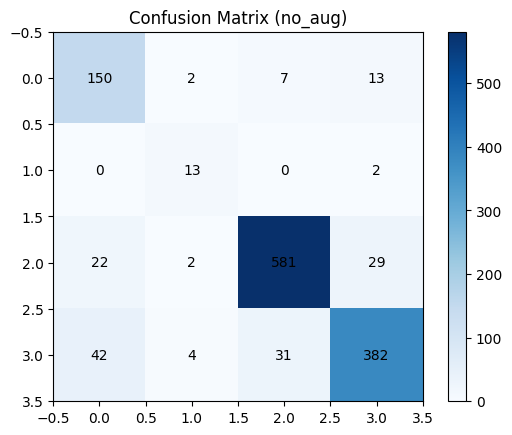

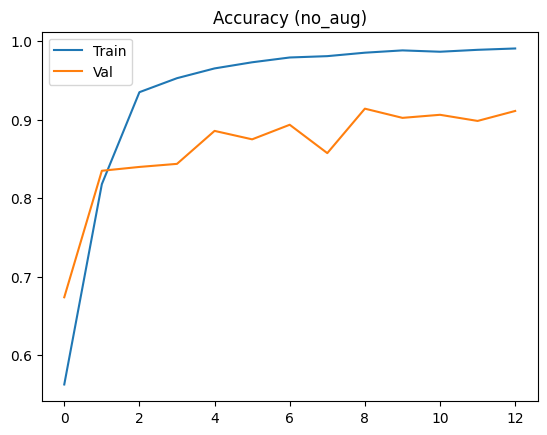

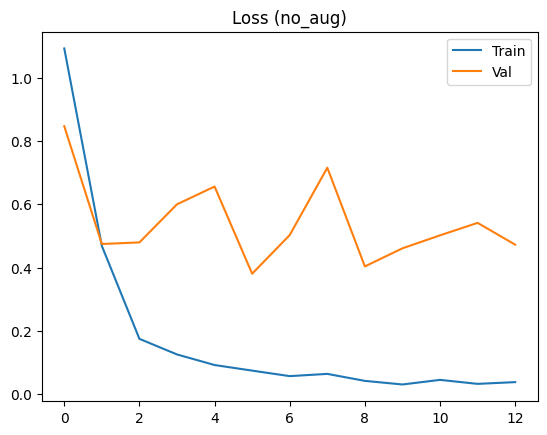

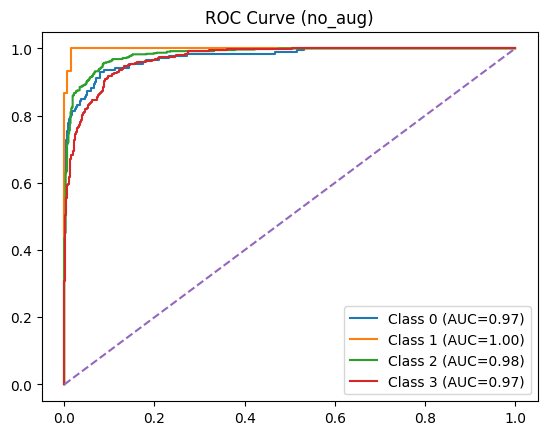

Eksperimen no_aug selesai di-render.

MULAI EKSPERIMEN: WITH_AUG
Epoch 01/25 | Train Acc: 0.4880 | Val Acc: 0.5996 | Val Loss: 1.1346
Epoch 02/25 | Train Acc: 0.5791 | Val Acc: 0.6504 | Val Loss: 0.9056
Epoch 03/25 | Train Acc: 0.6553 | Val Acc: 0.7119 | Val Loss: 0.6295
Epoch 04/25 | Train Acc: 0.6846 | Val Acc: 0.6846 | Val Loss: 0.7018
Epoch 05/25 | Train Acc: 0.7415 | Val Acc: 0.7637 | Val Loss: 0.6180
Epoch 06/25 | Train Acc: 0.7712 | Val Acc: 0.8145 | Val Loss: 0.4517
Epoch 07/25 | Train Acc: 0.7993 | Val Acc: 0.7061 | Val Loss: 0.5117
Epoch 08/25 | Train Acc: 0.8308 | Val Acc: 0.8232 | Val Loss: 0.3381
Epoch 09/25 | Train Acc: 0.8479 | Val Acc: 0.8633 | Val Loss: 0.2946
Epoch 10/25 | Train Acc: 0.8665 | Val Acc: 0.8604 | Val Loss: 0.3193
Epoch 11/25 | Train Acc: 0.8799 | Val Acc: 0.8564 | Val Loss: 0.3043
Epoch 12/25 | Train Acc: 0.8992 | Val Acc: 0.8809 | Val Loss: 0.3721
Epoch 13/25 | Train Acc: 0.9158 | Val Acc: 0.9033 | Val Loss: 0.2511
Epoch 14/25 | Train Acc: 0.9197 | Val 

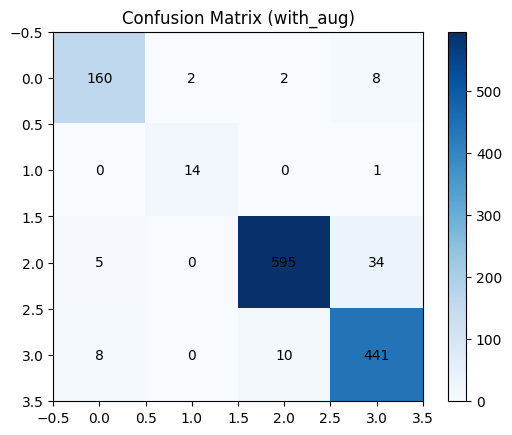

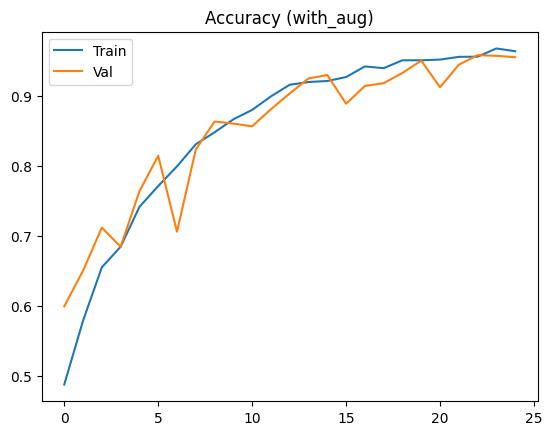

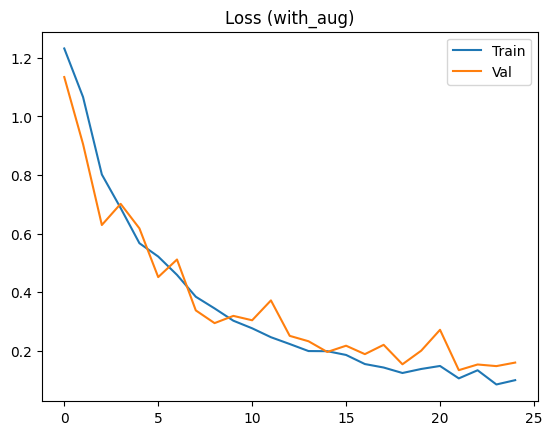

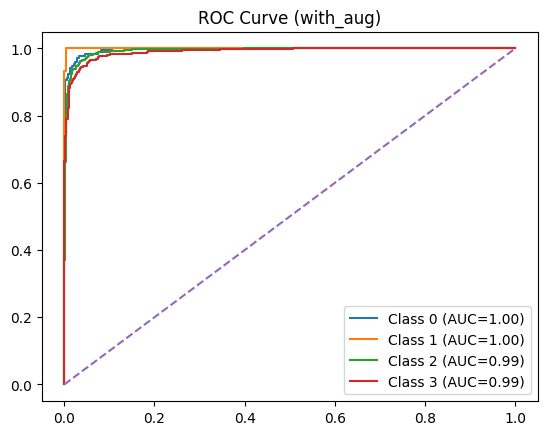

Eksperimen with_aug selesai di-render.

Kedua skenario selesai dieksekusi. Semua visualisasi sudah ditampilkan.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"] # 5120 data
test_data = dataset["test"]      # 1280 data

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 4. TRANSFORMS (SKENARIO)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_none = base_transform

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, train_transform):
    print(f"\n{'='*50}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"{'='*50}")

    # Data Loaders
    train_loader = DataLoader(
        AlzheimerDataset(train_data_raw, train_transform),
        batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"]
    )
    val_loader = DataLoader(
        AlzheimerDataset(val_data_raw, base_transform),
        batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
    )
    test_loader = DataLoader(
        AlzheimerDataset(test_data, base_transform),
        batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
    )

    # Setup Model
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)
    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer3.parameters():
        param.requires_grad = True
    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # Class Weights & Loss
    class_weights = compute_class_weight(
        class_weight='balanced', classes=np.unique(train_labels), y=train_labels
    )
    class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights)

    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=CONFIG["lr"]
    )

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=3, factor=0.3
    )

    # Training Loop
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total
        scheduler.step(val_acc)

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load best weights directly from RAM
    model.load_state_dict(best_model)

    # Testing
    print("\n--- FINAL TEST ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    all_data = []

    with torch.no_grad():
        for images, labels, indices in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

            for i in range(len(images)):
                all_data.append({
                    "image": images[i].cpu(),
                    "label": labels[i].item(),
                    "pred": preds[i].item()
                })

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------------------------------
    # Plotting (Ditampilkan langsung, tidak disimpan)
    # ------------------------------------------

    # 1. Confusion Matrix
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center")
    plt.show()

    # 2. Accuracy
    plt.figure()
    plt.plot(train_acc_hist, label="Train")
    plt.plot(val_acc_hist, label="Val")
    plt.legend()
    plt.title(f"Accuracy ({scenario_name})")
    plt.show()

    # 3. Loss
    plt.figure()
    plt.plot(train_loss_hist, label="Train")
    plt.plot(val_loss_hist, label="Val")
    plt.legend()
    plt.title(f"Loss ({scenario_name})")
    plt.show()

    # 4. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.legend()
    plt.title(f"ROC Curve ({scenario_name})")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai di-render.")
    return all_data

# ==========================================
# 6. JALANKAN KEDUA SKENARIO
# ==========================================
# Skenario 1: Tanpa Data Augmentasi
data_no_aug = run_experiment("no_aug", train_transform_none)

# Skenario 2: Dengan Data Augmentasi
data_with_aug = run_experiment("with_aug", train_transform_aug)

print("\nKedua skenario selesai dieksekusi. Semua visualisasi sudah ditampilkan.")

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random
import os

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": "./output_freeze_all"
}

os.makedirs(CONFIG["save_dir"], exist_ok=True)

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# Dataloader menggunakan Shuffle standard (tanpa sampler)
train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: Freeze Semua Parameter Feature Extractor
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params
    print(f"\n📊 INFORMASI LAYER:")
    print(f"   - Total Parameter    : {total_params:,}")
    print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
    print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")

    # REKAM BOBOT AWAL (Initial Weights) pada layer Linear (indeks 1 dari nn.Sequential)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0) # Hindari exploding gradient
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        # Penanda Best Epoch
        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    # REKAM PERUBAHAN BOBOT (Weight Shift)
    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # Simpan Bobot
    save_path = f"{CONFIG['save_dir']}/{scenario_name}_best_epoch_{best_epoch}.pth"
    torch.save(model.state_dict(), save_path)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.savefig(f"{CONFIG['save_dir']}/{scenario_name}_confusion_matrix.png")
    plt.close()

    # 2. Kurva Loss & Accuracy (Digabung agar ringkas)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    # Accuracy Plot
    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    # Loss Plot
    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.savefig(f"{CONFIG['save_dir']}/{scenario_name}_learning_curves.png")
    plt.close()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(f"{CONFIG['save_dir']}/{scenario_name}_roc_curve.png")
    plt.close()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil disimpan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    ("S-01", "Adam", "ReduceLROnPlateau"),
    ("S-02", "Adam", "CosineAnnealingLR"),
    ("S-03", "AdamW", "ReduceLROnPlateau"),
    # ("S-04", "AdamW", "CosineAnnealingLR"),
    # ("S-05", "SGD", "ReduceLROnPlateau"),
    # ("S-06", "SGD", "CosineAnnealingLR"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!")

Device: cuda

Loading dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:138: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-01
🛠️  Strategy: Freeze Semua | Optim: Adam | Sched: ReduceLROnPlateau
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 140MB/s]



📊 INFORMASI LAYER:
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4451 | Val Acc: 0.4609 | Val Loss: 1.2930 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.4824 | Val Acc: 0.4844 | Val Loss: 1.2779 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4888 | Val Acc: 0.5068 | Val Loss: 1.2679 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4856 | Val Acc: 0.5234 | Val Loss: 1.2562 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.5090 | Val Acc: 0.5176 | Val Loss: 1.2470 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.5088 | Val Acc: 0.4932 | Val Loss: 1.2382 
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.5034 | Val Acc: 0.5469 | Val Loss: 1.2255 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.5081 | Val Acc: 0.5156 | Val Loss: 1.2285 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.5193 | Val Acc: 0.5469 | Val Loss: 1.2166 
Epoch 10/25 | LR: 1.00e-04 | 

Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-04
🛠️  Strategy: Freeze Semua | Optim: AdamW | Sched: CosineAnnealingLR

📊 INFORMASI LAYER:
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4451 | Val Acc: 0.4609 | Val Loss: 1.2930 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4822 | Val Acc: 0.4844 | Val Loss: 1.2779 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4893 | Val Acc: 0.5068 | Val Loss: 1.2681 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4856 | Val Acc: 0.5225 | Val Loss: 1.2567 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.5090 | Val Acc: 0.5186 | Val Loss: 1.2479 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.5103 | Val Acc: 0.4932 | Val Loss: 1.2393 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.5049 | Val Acc: 0.5449 | Val Loss: 1.2284 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train

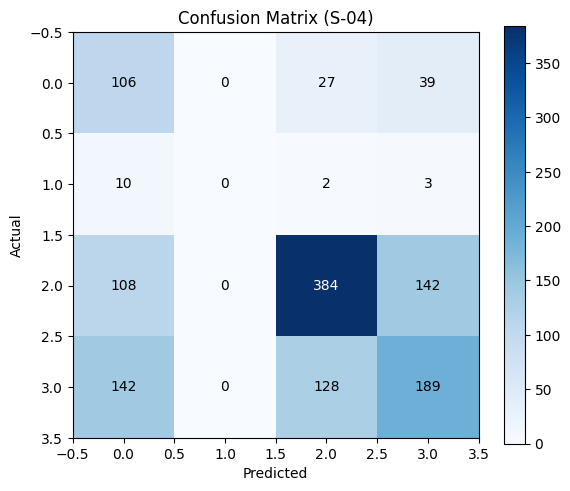

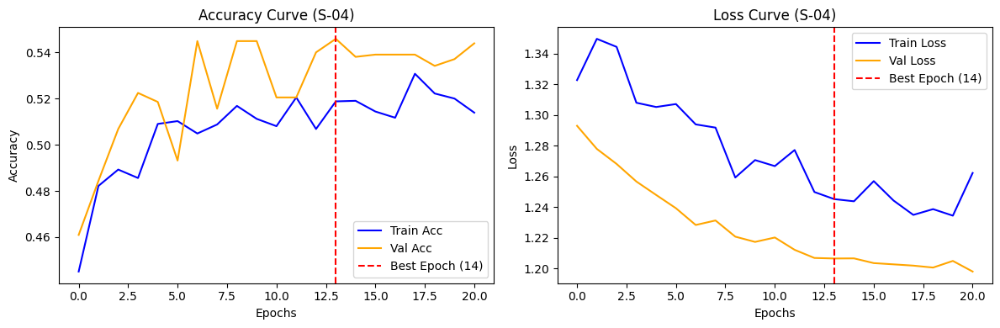

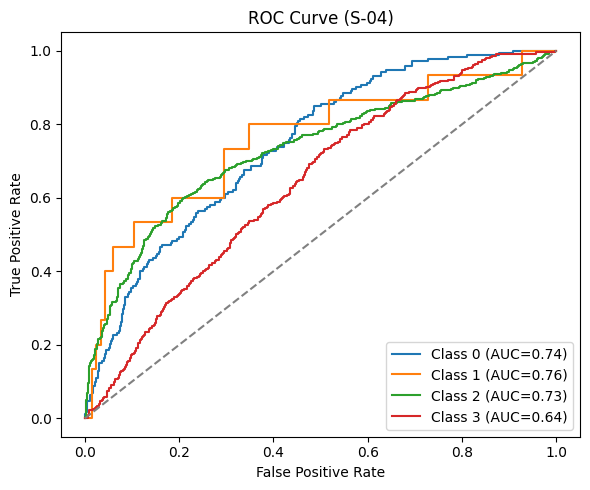

✅ Seluruh plot informatif untuk S-04 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-05
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER:
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3167 | Val Acc: 0.2959 | Val Loss: 1.3484 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3721 | Val Acc: 0.3799 | Val Loss: 1.3227 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4036 | Val Acc: 0.4355 | Val Loss: 1.3075 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4214 | Val Acc: 0.4414 | Val Loss: 1.3033 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4126 | Val Acc: 0.4570 | Val Loss: 1.2992 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4331 | Val Acc: 0.4648 | Val Loss: 1.2960 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4421 | Val Acc: 0.4961 | Val Loss: 1.2892 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Tr

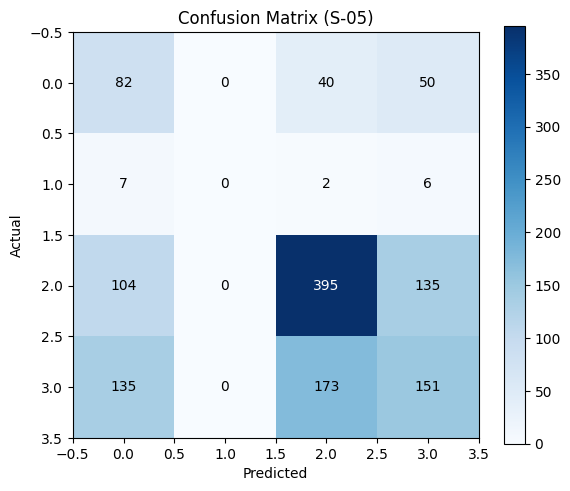

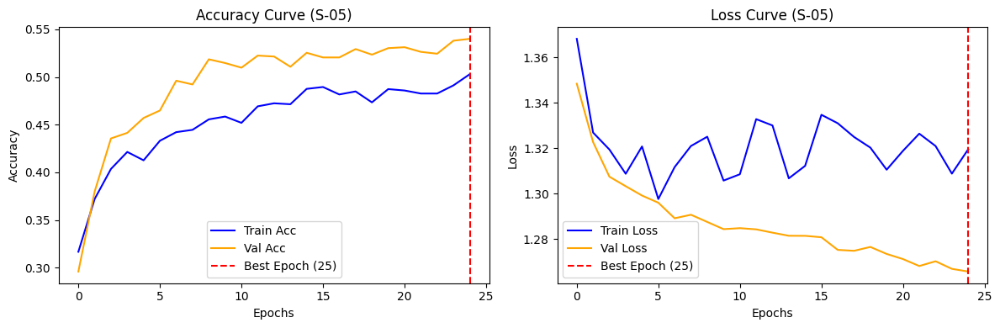

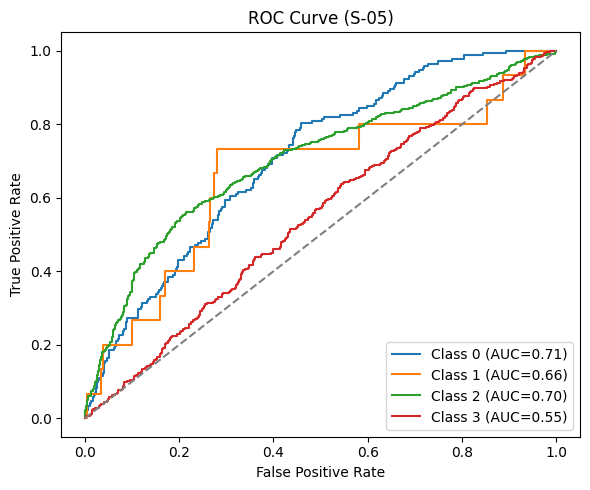

✅ Seluruh plot informatif untuk S-05 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-06
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: CosineAnnealingLR

📊 INFORMASI LAYER:
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4031 | Val Acc: 0.4893 | Val Loss: 1.3314 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4167 | Val Acc: 0.5049 | Val Loss: 1.3137 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4324 | Val Acc: 0.5068 | Val Loss: 1.3075 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4504 | Val Acc: 0.5107 | Val Loss: 1.3013 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4480 | Val Acc: 0.5088 | Val Loss: 1.2967 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4626 | Val Acc: 0.5215 | Val Loss: 1.2971 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4685 | Val Acc: 0.5205 | Val Loss: 1.2939 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4680 

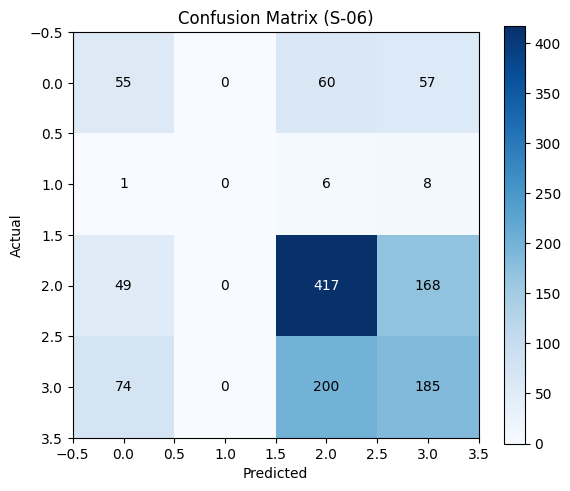

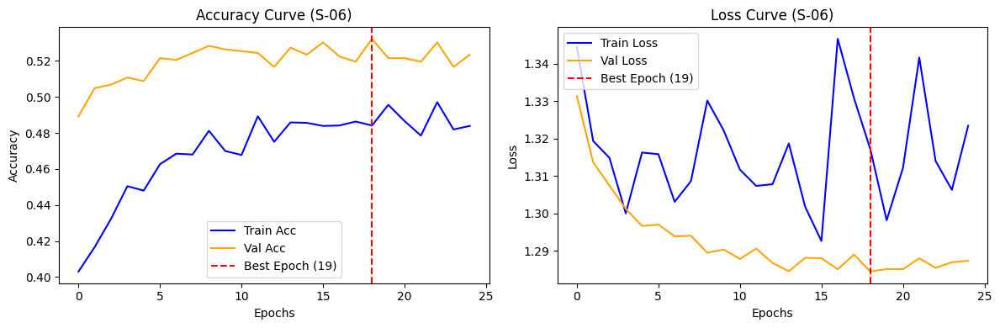

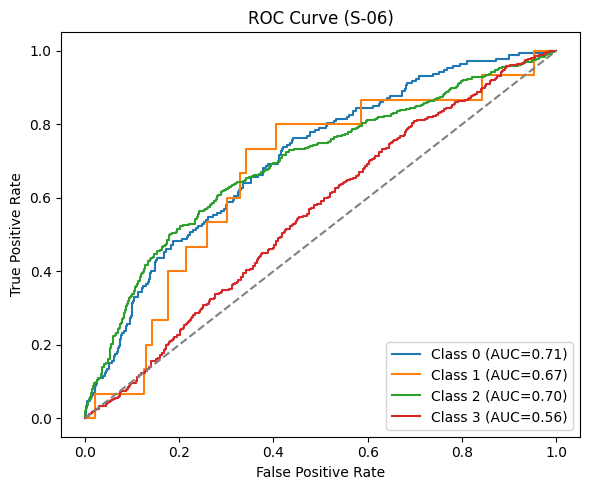

✅ Seluruh plot informatif untuk S-06 berhasil ditampilkan.


🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: Freeze Semua Parameter Feature Extractor
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params
    print(f"\n📊 INFORMASI LAYER:")
    print(f"   - Total Parameter    : {total_params:,}")
    print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
    print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    # ("S-01", "Adam", "ReduceLROnPlateau"),
    # ("S-02", "Adam", "CosineAnnealingLR"),
    # ("S-03", "AdamW", "ReduceLROnPlateau"),
    ("S-04", "AdamW", "CosineAnnealingLR"),
    ("S-05", "SGD", "ReduceLROnPlateau"),
    ("S-06", "SGD", "CosineAnnealingLR"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!")

Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-07
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: Adam | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER (Unfreeze Layer Terakhir):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 8,543,296 (36.33%)
   - Trainable Parameter: 14,972,932 (63.67%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4983 | Val Acc: 0.5293 | Val Loss: 1.0781 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5574 | Val Acc: 0.6328 | Val Loss: 1.0001 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6035 | Val Acc: 0.6504 | Val Loss: 0.8269 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.6304 | Val Acc: 0.6719 | Val Loss: 0.7316 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.6626 | Val Acc: 0.6895 | Val Loss: 0.6343 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.6836 | Val Acc: 0.7080 | Val Loss: 0.6347 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.6946 | Val Acc: 0.7158 | Val

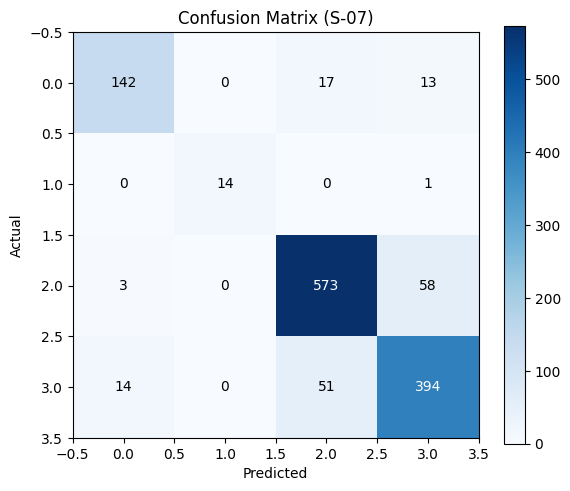

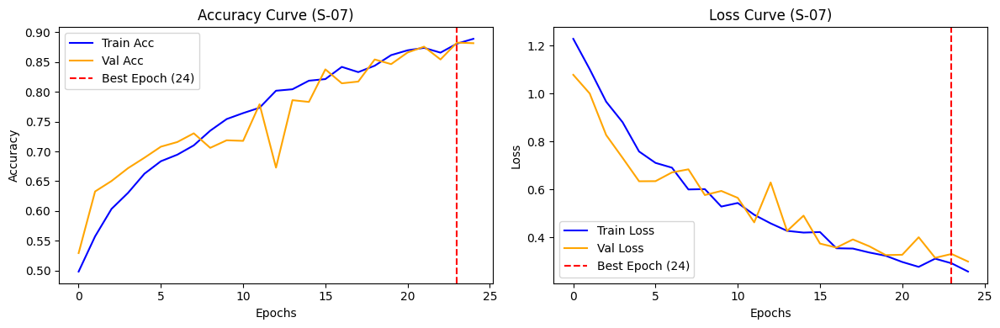

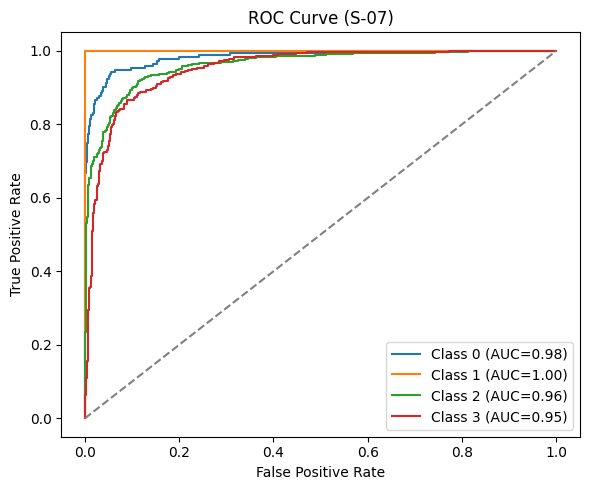

✅ Seluruh plot informatif untuk S-07 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-08
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: Adam | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4922 | Val Acc: 0.5635 | Val Loss: 1.1088 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5757 | Val Acc: 0.5781 | Val Loss: 0.9934 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6055 | Val Acc: 0.6230 | Val Loss: 0.8730 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.6340 | Val Acc: 0.6416 | Val Loss: 0.7245 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.6482 | Val Acc: 0.6816 | Val Loss: 0.7419 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.6794 | Val Acc: 0.7031 | Val Loss: 0.6936 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.6960 | Val Acc: 0.7109 | Val Loss: 0.7575 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.7227 | Val Acc: 0.7510 | Val Loss: 0.7324 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.7417 | Val Acc: 0.7637 | Va

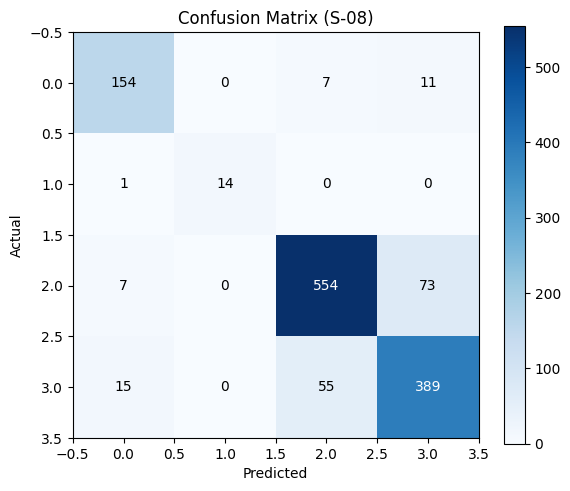

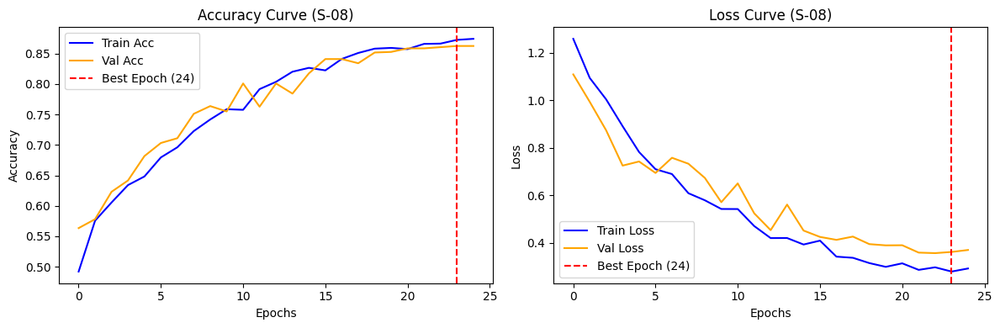

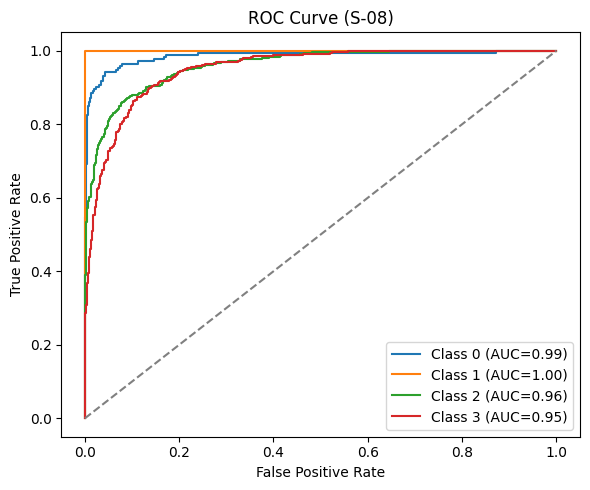

✅ Seluruh plot informatif untuk S-08 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-09
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: AdamW | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4839 | Val Acc: 0.5840 | Val Loss: 1.1726 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5488 | Val Acc: 0.6055 | Val Loss: 1.1171 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.5881 | Val Acc: 0.6299 | Val Loss: 0.8984 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.6362 | Val Acc: 0.6641 | Val Loss: 0.8060 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.6531 | Val Acc: 0.6221 | Val Loss: 0.8737 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.6711 | Val Acc: 0.6865 | Val Loss: 0.7107 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.6946 | Val Acc: 0.7354 | Val Loss: 0.8207 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7229 | Val Acc: 0.7480 | Val Loss: 0.5470 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.7302 | Val Acc: 0.7451 | Val Loss:

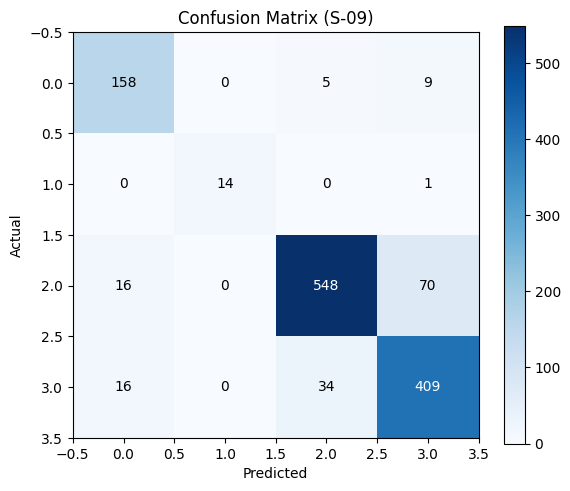

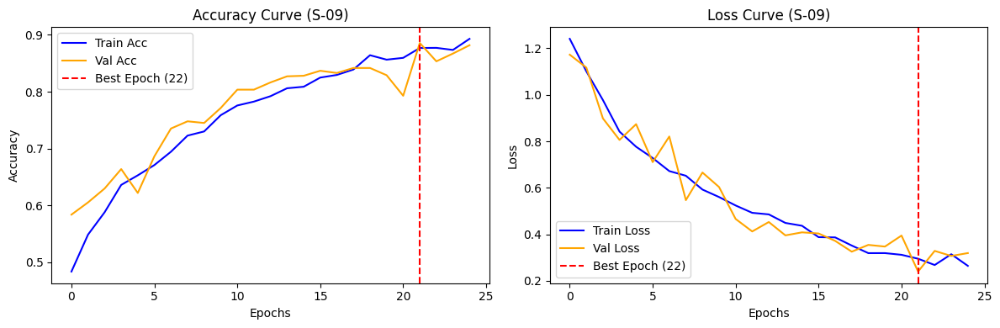

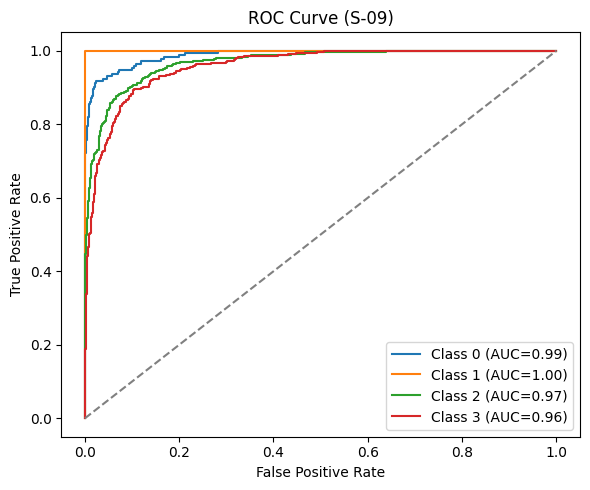

✅ Seluruh plot informatif untuk S-09 berhasil ditampilkan.


🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Unfreeze Layer Terakhir":
        for param in model.parameters():
            param.requires_grad = False
        # Buka layer4 (Layer Konvolusi Terakhir)
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-07 s/d S-12)
# ==========================================

scenarios = [
    ("S-07", "Unfreeze Layer Terakhir", "Adam", "ReduceLROnPlateau"),
    ("S-08", "Unfreeze Layer Terakhir", "Adam", "CosineAnnealingLR"),
    ("S-09", "Unfreeze Layer Terakhir", "AdamW", "ReduceLROnPlateau"),
    # ("S-10", "Unfreeze Layer Terakhir", "AdamW", "CosineAnnealingLR"),
    # ("S-11", "Unfreeze Layer Terakhir", "SGD", "ReduceLROnPlateau"),
    # ("S-12", "Unfreeze Layer Terakhir", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!")

Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-10
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: AdamW | Sched: CosineAnnealingLR

📊 INFORMASI LAYER (Unfreeze Layer Terakhir):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 8,543,296 (36.33%)
   - Trainable Parameter: 14,972,932 (63.67%)

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4983 | Val Acc: 0.5293 | Val Loss: 1.0781 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5552 | Val Acc: 0.6260 | Val Loss: 1.0120 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6042 | Val Acc: 0.6387 | Val Loss: 0.8362 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.6323 | Val Acc: 0.6758 | Val Loss: 0.7280 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.6655 | Val Acc: 0.6963 | Val Loss: 0.6198 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.6833 | Val Acc: 0.7148 | Val Loss: 0.5985 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.6995 | Val Acc: 0.7178 | Va

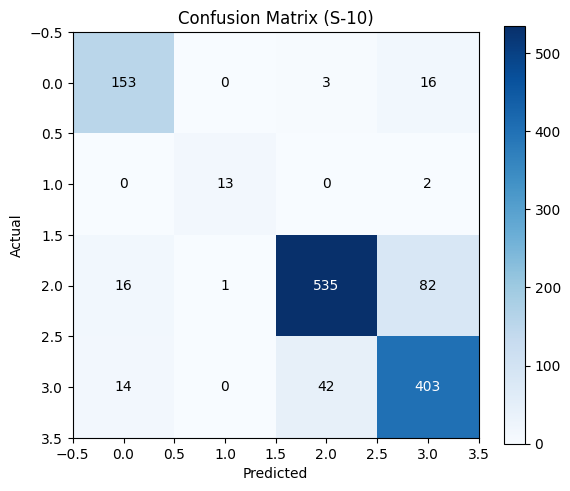

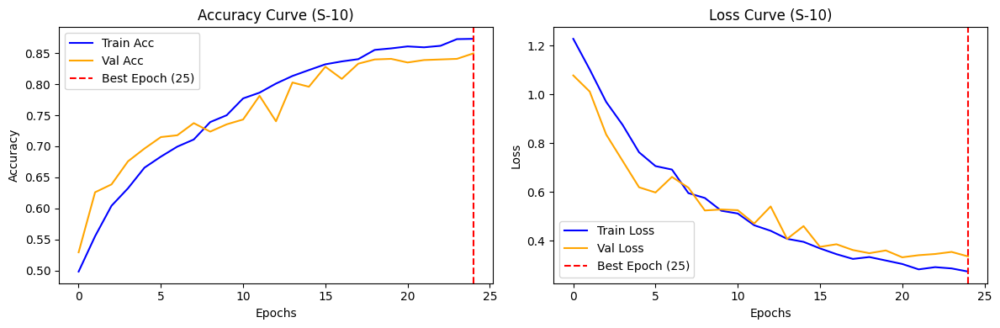

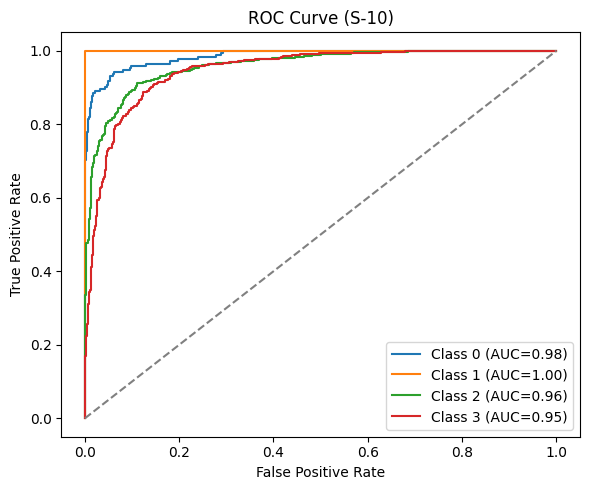

✅ Seluruh plot informatif untuk S-10 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-11
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2666 | Val Acc: 0.2734 | Val Loss: 1.3450 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3584 | Val Acc: 0.3584 | Val Loss: 1.3216 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4006 | Val Acc: 0.4482 | Val Loss: 1.3027 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4321 | Val Acc: 0.4756 | Val Loss: 1.2959 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4417 | Val Acc: 0.5049 | Val Loss: 1.2931 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4543 | Val Acc: 0.5088 | Val Loss: 1.2890 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4468 | Val Acc: 0.5039 | Val Loss: 1.2902 
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.4578 | Val Acc: 0.5283 | Val Loss: 1.2909 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.4624 | Val Acc: 0.5264 | Val Loss: 1

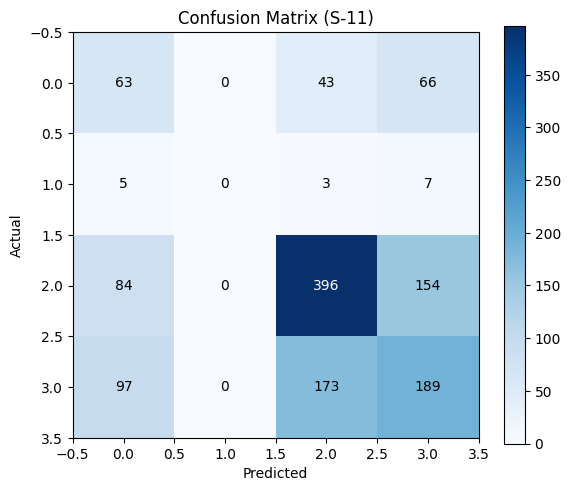

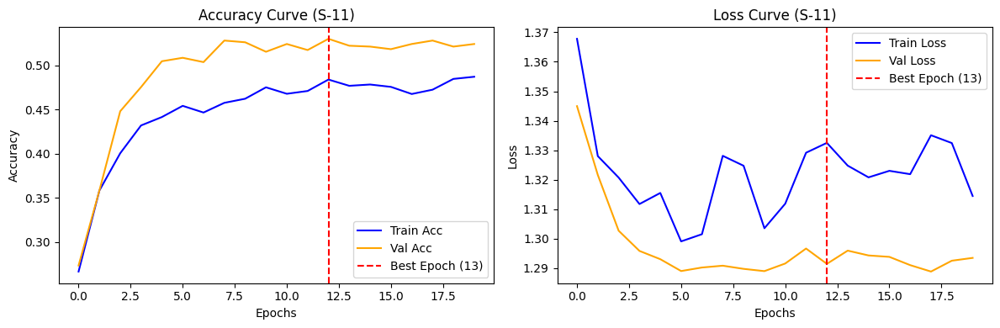

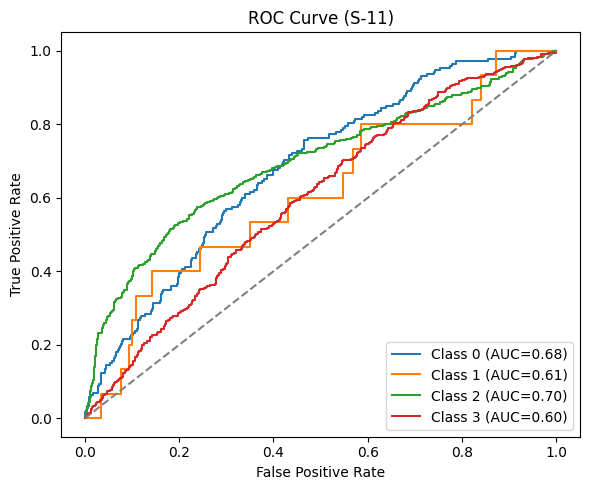

✅ Seluruh plot informatif untuk S-11 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-12
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3728 | Val Acc: 0.4189 | Val Loss: 1.3393 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4114 | Val Acc: 0.4404 | Val Loss: 1.3178 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4275 | Val Acc: 0.4512 | Val Loss: 1.3060 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4307 | Val Acc: 0.4678 | Val Loss: 1.3003 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4470 | Val Acc: 0.4668 | Val Loss: 1.2958 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4441 | Val Acc: 0.4766 | Val Loss: 1.2920 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4424 | Val Acc: 0.4834 | Val Loss: 1.2931 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4551 | Val Acc: 0.4824 | Val Loss: 1.2919 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.4563 | Val Acc: 0.4727 | Val Loss: 1.2928 
E

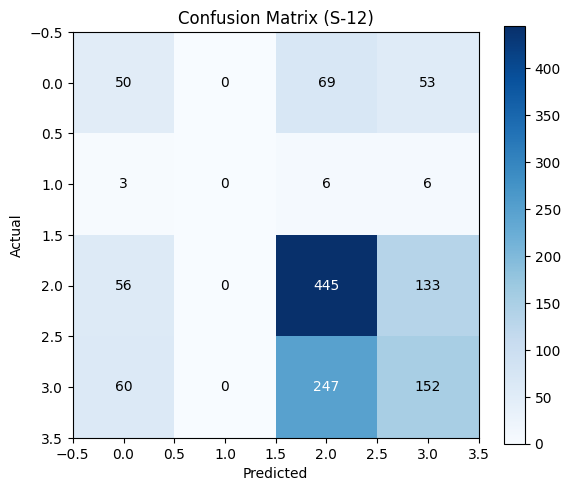

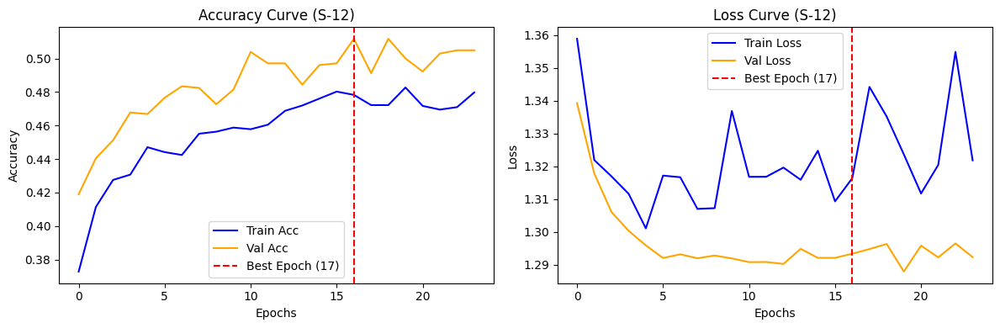

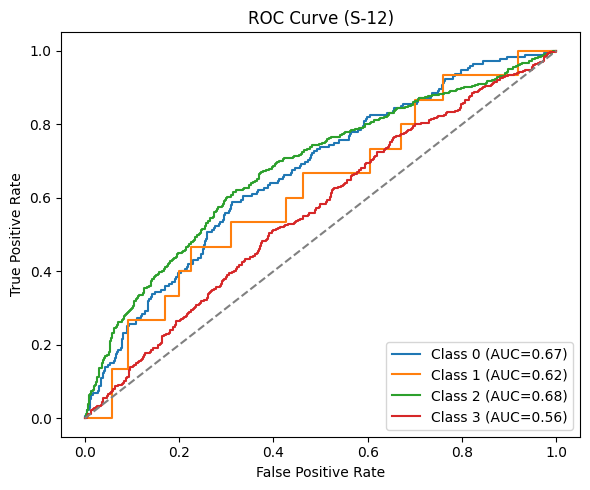

✅ Seluruh plot informatif untuk S-12 berhasil ditampilkan.


🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Unfreeze Layer Terakhir":
        for param in model.parameters():
            param.requires_grad = False
        # Buka layer4 (Layer Konvolusi Terakhir)
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-07 s/d S-12)
# ==========================================

scenarios = [
    # ("S-07", "Unfreeze Layer Terakhir", "Adam", "ReduceLROnPlateau"),
    # ("S-08", "Unfreeze Layer Terakhir", "Adam", "CosineAnnealingLR"),
    # ("S-09", "Unfreeze Layer Terakhir", "AdamW", "ReduceLROnPlateau"),
    ("S-10", "Unfreeze Layer Terakhir", "AdamW", "CosineAnnealingLR"),
    ("S-11", "Unfreeze Layer Terakhir", "SGD", "ReduceLROnPlateau"),
    ("S-12", "Unfreeze Layer Terakhir", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!")

Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-13
🛠️  Strategy: Full Tuning | Optim: Adam | Sched: ReduceLROnPlateau
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 171MB/s]



📊 INFORMASI LAYER (Full Tuning):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5168 | Val Acc: 0.5449 | Val Loss: 1.0811 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5898 | Val Acc: 0.6328 | Val Loss: 0.9674 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6401 | Val Acc: 0.7080 | Val Loss: 0.6183 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7114 | Val Acc: 0.7100 | Val Loss: 0.7196 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7798 | Val Acc: 0.7793 | Val Loss: 0.5577 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8215 | Val Acc: 0.8213 | Val Loss: 0.4566 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8528 | Val Acc: 0.8311 | Val Loss: 0.5388 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.8843 | Val Acc: 0.8008 | Val Loss: 0.6531 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9128 | Val Acc: 0.8799 | Val Loss: 0.4018 ⭐ (

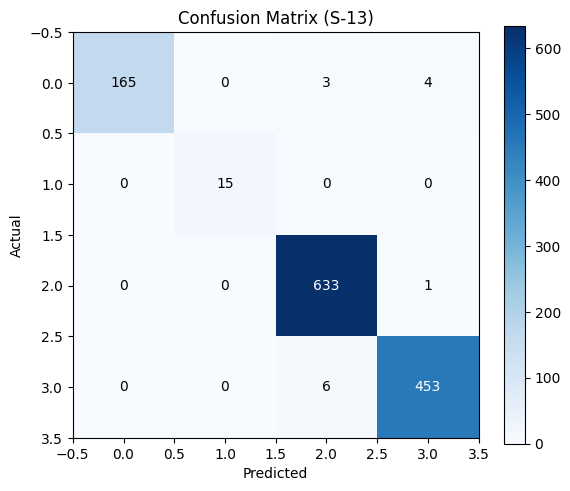

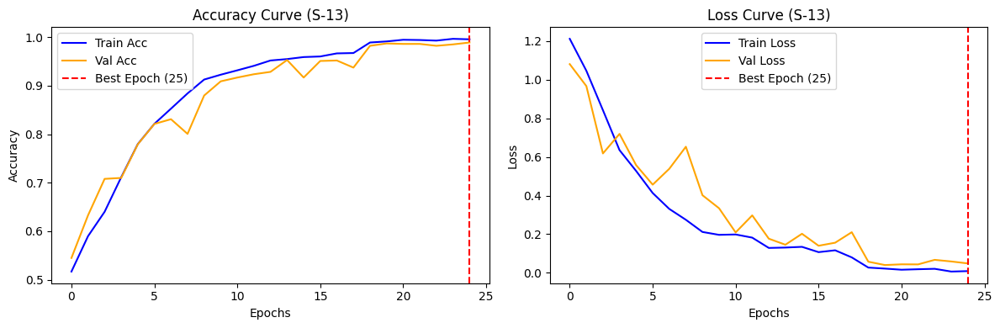

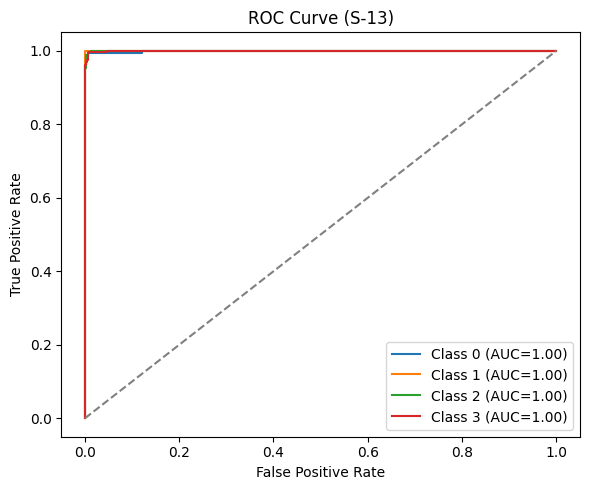

✅ Seluruh plot informatif untuk S-13 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-14
🛠️  Strategy: Full Tuning | Optim: Adam | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4902 | Val Acc: 0.5684 | Val Loss: 1.1057 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5852 | Val Acc: 0.6211 | Val Loss: 0.9011 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6682 | Val Acc: 0.7031 | Val Loss: 0.7380 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7393 | Val Acc: 0.7500 | Val Loss: 0.5803 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7847 | Val Acc: 0.8047 | Val Loss: 0.4671 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8376 | Val Acc: 0.8555 | Val Loss: 0.3593 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.8738 | Val Acc: 0.8066 | Val Loss: 0.4751 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8926 | Val Acc: 0.9141 | Val Loss: 0.2235 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9221 | Val Acc: 0.9121 | Val Loss: 0.2125 
Epoc

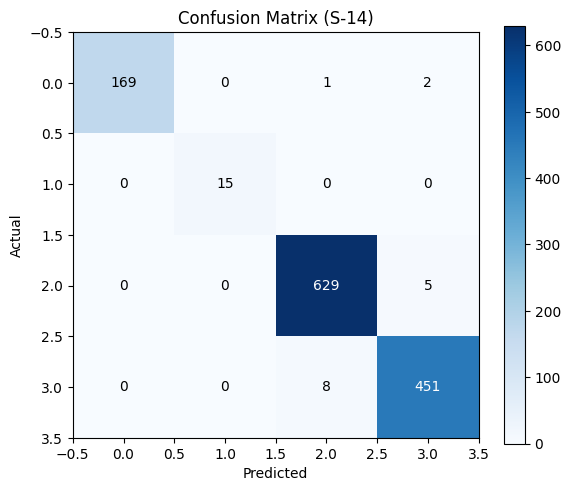

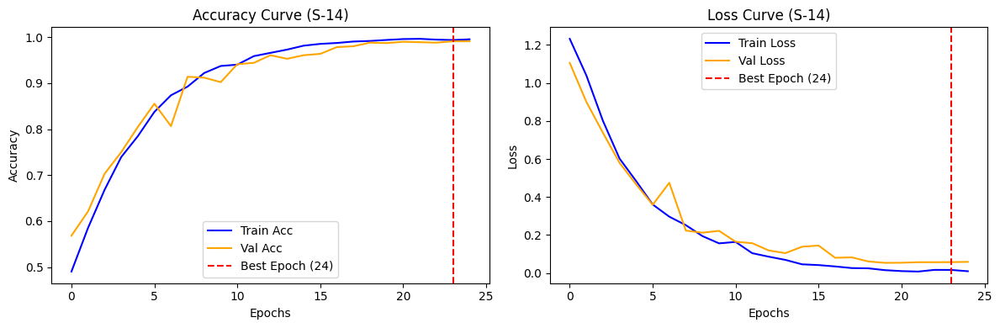

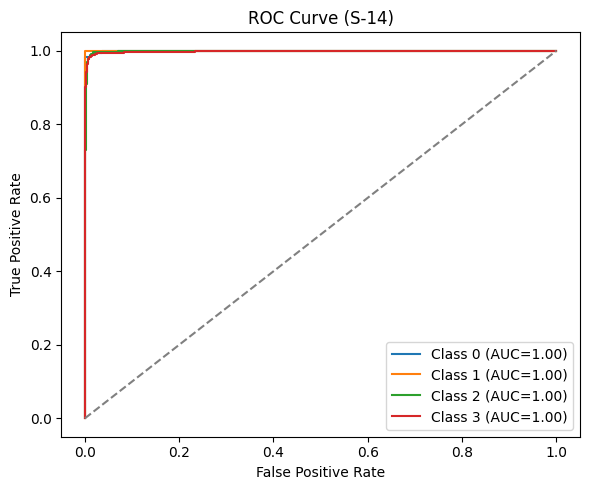

✅ Seluruh plot informatif untuk S-14 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-15
🛠️  Strategy: Full Tuning | Optim: AdamW | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5098 | Val Acc: 0.5684 | Val Loss: 1.0815 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5864 | Val Acc: 0.6240 | Val Loss: 0.9145 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6597 | Val Acc: 0.6982 | Val Loss: 0.6885 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7202 | Val Acc: 0.7070 | Val Loss: 0.6033 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7715 | Val Acc: 0.7119 | Val Loss: 0.5486 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8293 | Val Acc: 0.8203 | Val Loss: 0.4399 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8560 | Val Acc: 0.8506 | Val Loss: 0.3687 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.8877 | Val Acc: 0.8730 | Val Loss: 0.3118 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9036 | Val Acc: 0.8916 | Val Loss: 0.2

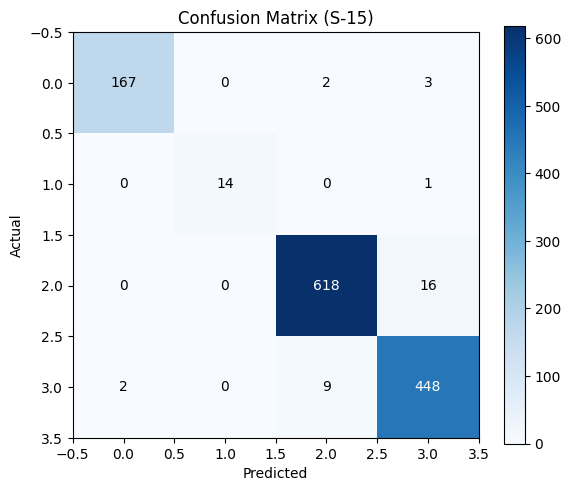

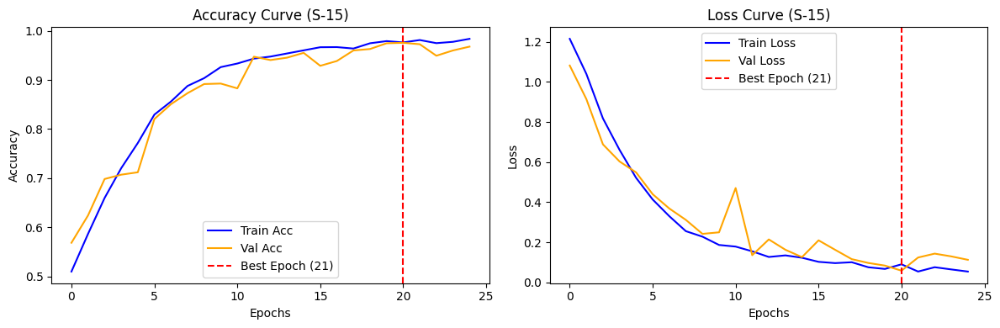

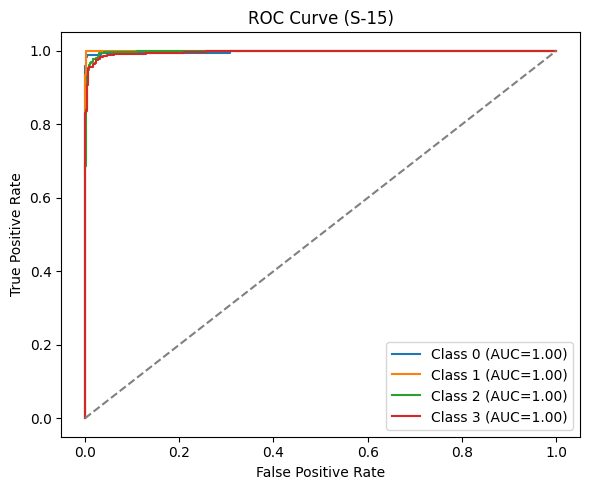

✅ Seluruh plot informatif untuk S-15 berhasil ditampilkan.


🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Full Tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-13 s/d S-18)
# ==========================================

scenarios = [
    ("S-13", "Full Tuning", "Adam", "ReduceLROnPlateau"),
    ("S-14", "Full Tuning", "Adam", "CosineAnnealingLR"),
    ("S-15", "Full Tuning", "AdamW", "ReduceLROnPlateau"),
    # ("S-16", "Full Tuning", "AdamW", "CosineAnnealingLR"),
    # ("S-17", "Full Tuning", "SGD", "ReduceLROnPlateau"),
    # ("S-18", "Full Tuning", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!")

Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-16
🛠️  Strategy: Full Tuning | Optim: AdamW | Sched: CosineAnnealingLR
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 169MB/s]



📊 INFORMASI LAYER (Full Tuning):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5168 | Val Acc: 0.5449 | Val Loss: 1.0811 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5730 | Val Acc: 0.6211 | Val Loss: 0.9770 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6580 | Val Acc: 0.6455 | Val Loss: 0.7302 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7126 | Val Acc: 0.7295 | Val Loss: 0.7142 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7737 | Val Acc: 0.7764 | Val Loss: 0.4009 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8274 | Val Acc: 0.7520 | Val Loss: 0.4590 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.8696 | Val Acc: 0.8506 | Val Loss: 0.3830 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.9014 | Val Acc: 0.8525 | Val Loss: 0.4547 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9229 | Val Acc: 0.9160 | Val Loss: 0.2234 ⭐ (

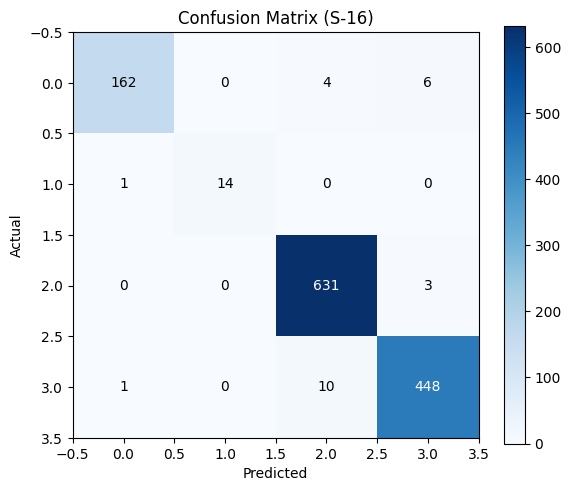

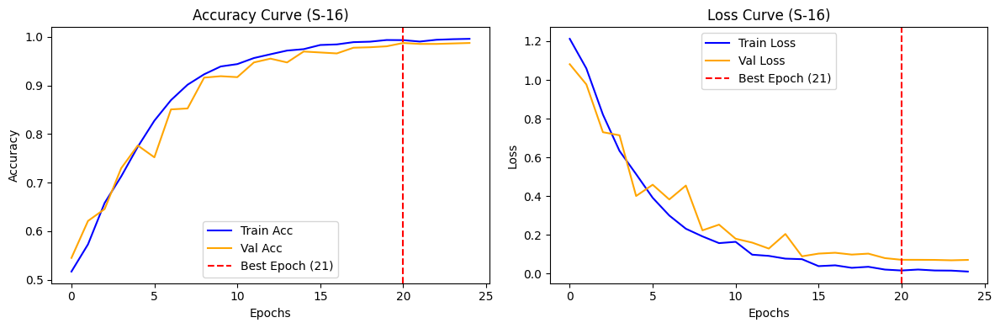

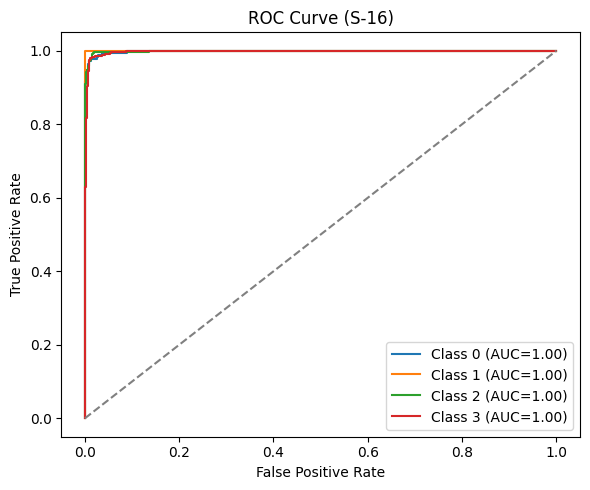

✅ Seluruh plot informatif untuk S-16 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-17
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.1909 | Val Acc: 0.2363 | Val Loss: 1.3758 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2468 | Val Acc: 0.1787 | Val Loss: 1.3749 
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2795 | Val Acc: 0.2656 | Val Loss: 1.3623 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.3108 | Val Acc: 0.2334 | Val Loss: 1.3568 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.3318 | Val Acc: 0.2900 | Val Loss: 1.3457 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.3513 | Val Acc: 0.3213 | Val Loss: 1.3427 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.3594 | Val Acc: 0.3281 | Val Loss: 1.3392 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.3782 | Val Acc: 0.3975 | Val Loss: 1.3264 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.3962 | Val Acc: 0.3418 | Val Loss: 1.3302 
Epoch 10/25 |

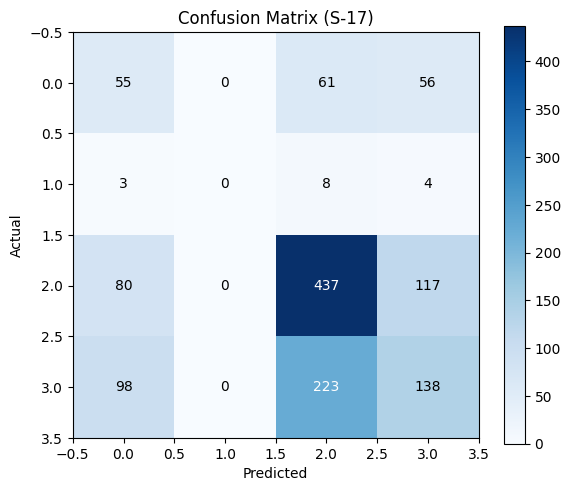

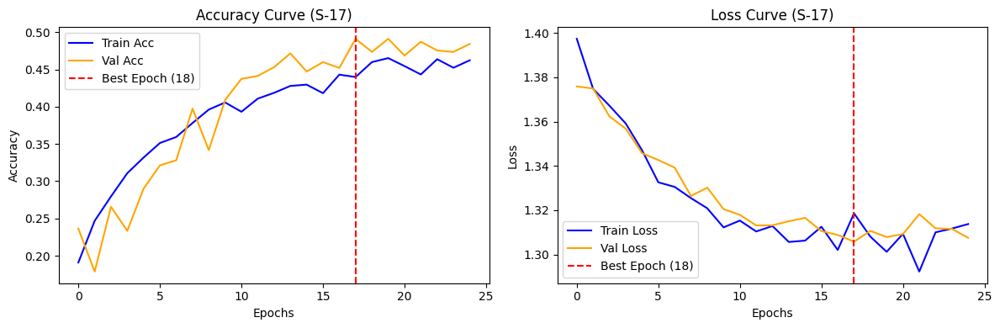

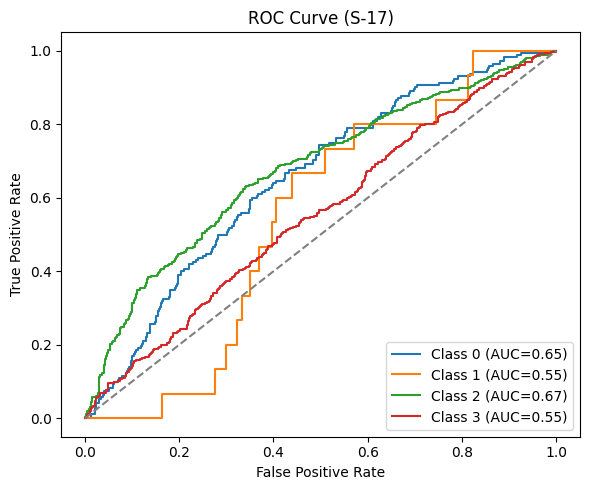

✅ Seluruh plot informatif untuk S-17 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-18
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3376 | Val Acc: 0.3916 | Val Loss: 1.3555 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3730 | Val Acc: 0.4121 | Val Loss: 1.3442 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.3918 | Val Acc: 0.4258 | Val Loss: 1.3319 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3879 | Val Acc: 0.3955 | Val Loss: 1.3270 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3784 | Val Acc: 0.4004 | Val Loss: 1.3203 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3967 | Val Acc: 0.3994 | Val Loss: 1.3143 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4065 | Val Acc: 0.4355 | Val Loss: 1.3083 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4148 | Val Acc: 0.4160 | Val Loss: 1.3063 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.4028 | Val Acc: 0.4424 | Val Loss: 1.3047 ⭐ (Best)
Epoch 10/25 | LR: 6.5

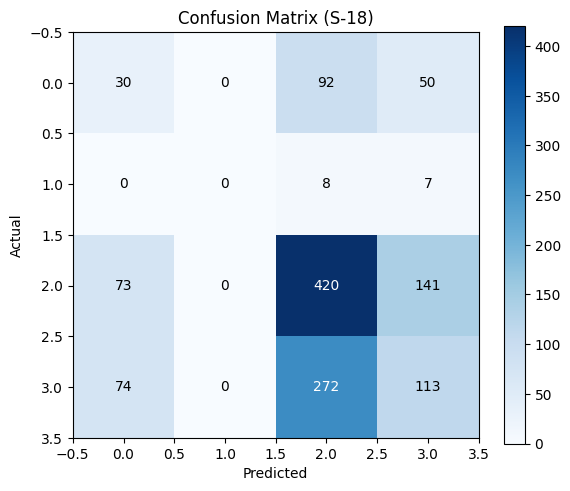

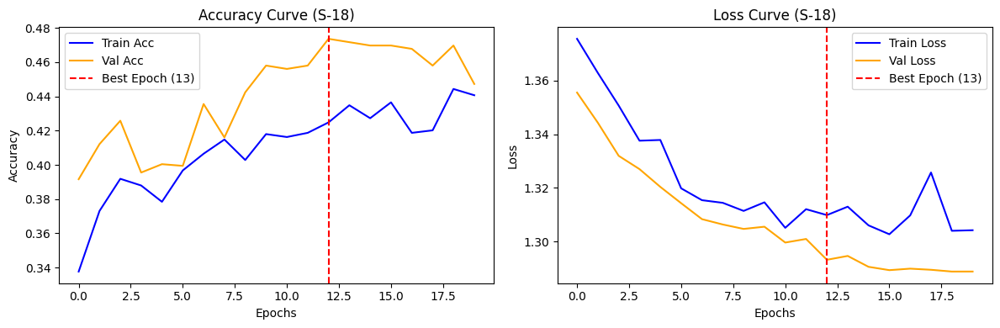

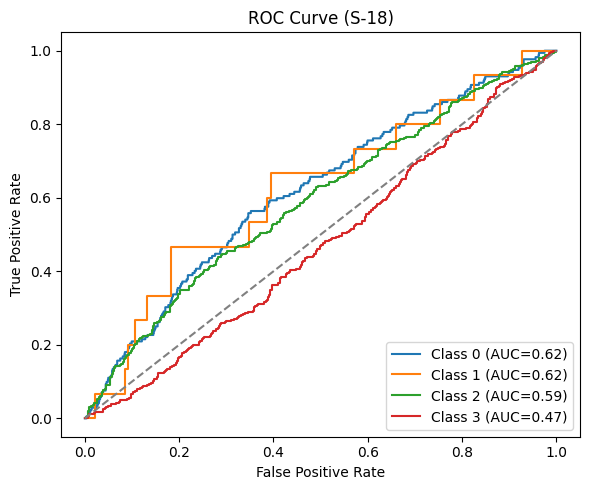

✅ Seluruh plot informatif untuk S-18 berhasil ditampilkan.


🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Full Tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS ------------------
    model.load_state_dict(best_model)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-13 s/d S-18)
# ==========================================

scenarios = [
    # ("S-13", "Full Tuning", "Adam", "ReduceLROnPlateau"),
    # ("S-14", "Full Tuning", "Adam", "CosineAnnealingLR"),
    # ("S-15", "Full Tuning", "AdamW", "ReduceLROnPlateau"),
    ("S-16", "Full Tuning", "AdamW", "CosineAnnealingLR"),
    ("S-17", "Full Tuning", "SGD", "ReduceLROnPlateau"),
    ("S-18", "Full Tuning", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!")

# Class Weight (Saved Model)

Mounted at /content/drive
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All
Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-01
🛠️  Strategy: Freeze Semua | Optim: Adam | Sched: ReduceLROnPlateau
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 175MB/s]



📊 INFORMASI LAYER (FREEZE SEMUA):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4451 | Val Acc: 0.4609 | Val Loss: 1.2930 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.4824 | Val Acc: 0.4844 | Val Loss: 1.2779 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4888 | Val Acc: 0.5068 | Val Loss: 1.2679 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4856 | Val Acc: 0.5234 | Val Loss: 1.2562 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.5090 | Val Acc: 0.5176 | Val Loss: 1.2470 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.5088 | Val Acc: 0.4932 | Val Loss: 1.2382 
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.5034 | Val Acc: 0.5469 | Val Loss: 1.2255 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.5081 | Val Acc: 0.5156 | Val Loss: 1.2285 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.5193 | Val Acc: 0.5469 | Val Loss: 1.2166 
Epoch 10/25 | 

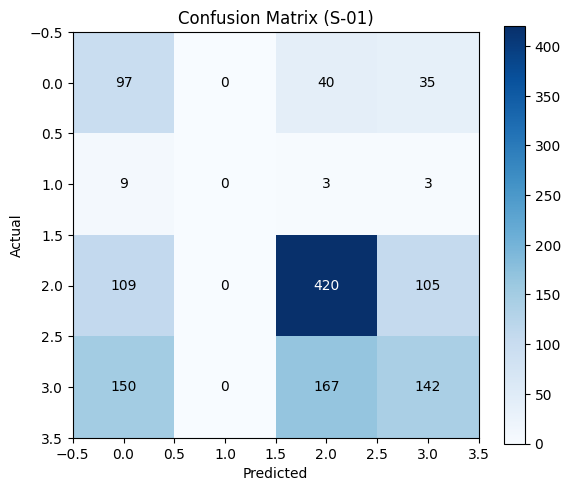

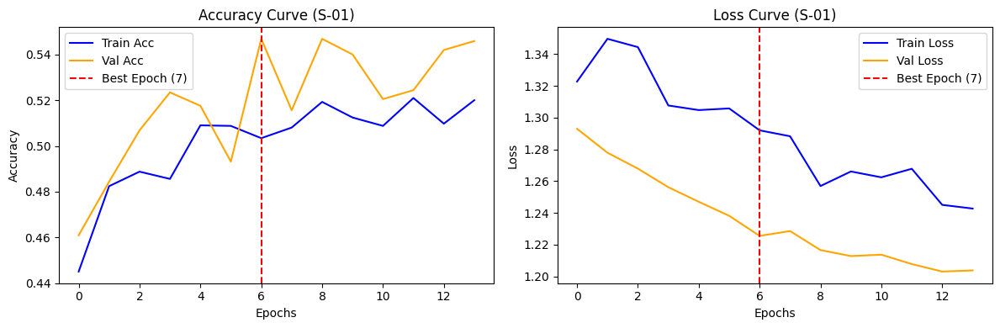

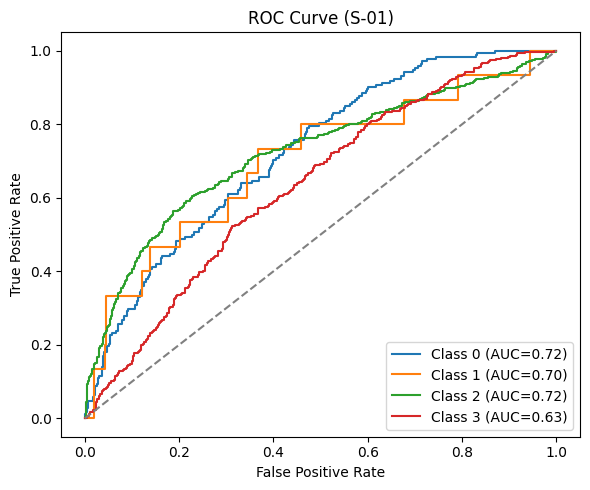

✅ Seluruh plot informatif untuk S-01 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-02
🛠️  Strategy: Freeze Semua | Optim: Adam | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4292 | Val Acc: 0.4893 | Val Loss: 1.2999 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4824 | Val Acc: 0.5176 | Val Loss: 1.2838 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4912 | Val Acc: 0.5420 | Val Loss: 1.2698 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4934 | Val Acc: 0.5557 | Val Loss: 1.2616 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.5042 | Val Acc: 0.5342 | Val Loss: 1.2530 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.5161 | Val Acc: 0.4932 | Val Loss: 1.2526 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.5166 | Val Acc: 0.5107 | Val Loss: 1.2359 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.5229 | Val Acc: 0.5459 | Val Loss: 1.2317 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.5027 | Val Acc: 0.5576 | Val Loss: 1.2236 ⭐ (Best)
Epoch 10/25 | LR: 6

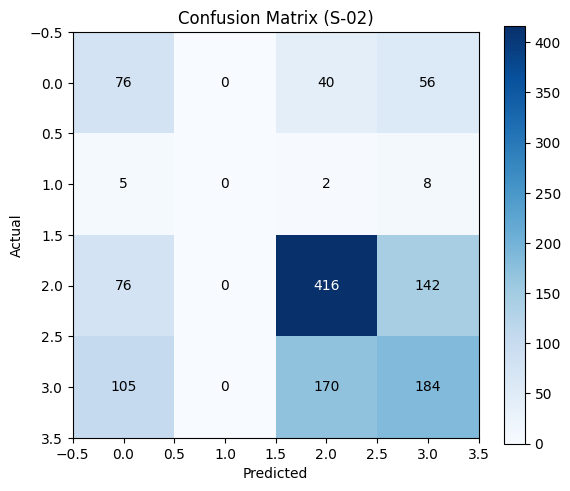

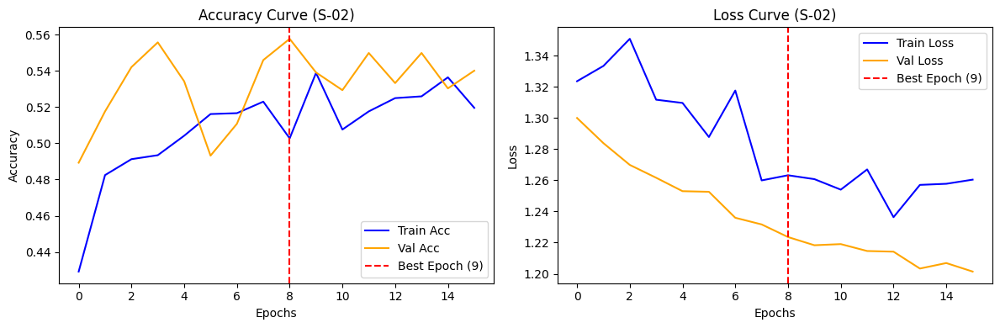

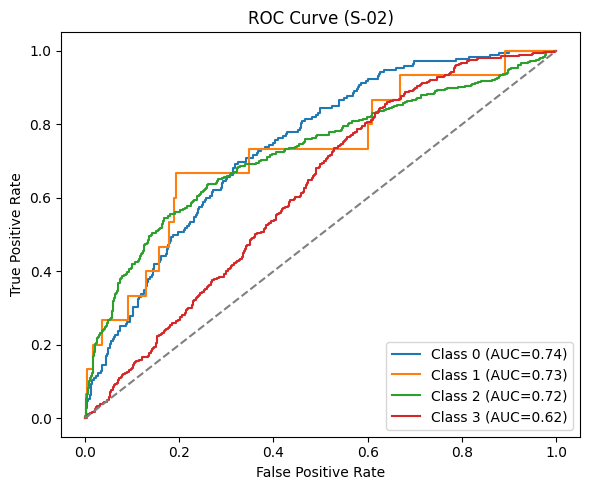

✅ Seluruh plot informatif untuk S-02 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-03
🛠️  Strategy: Freeze Semua | Optim: AdamW | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4299 | Val Acc: 0.5361 | Val Loss: 1.2888 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.4670 | Val Acc: 0.5498 | Val Loss: 1.2766 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4795 | Val Acc: 0.5547 | Val Loss: 1.2634 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.5134 | Val Acc: 0.5283 | Val Loss: 1.2536 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.5071 | Val Acc: 0.5498 | Val Loss: 1.2445 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4939 | Val Acc: 0.5391 | Val Loss: 1.2334 
Epoch 07/25 | LR: 3.00e-05 | Train Acc: 0.5200 | Val Acc: 0.5176 | Val Loss: 1.2261 
Epoch 08/25 | LR: 3.00e-05 | Train Acc: 0.5024 | Val Acc: 0.5098 | Val Loss: 1.2298 
Epoch 09/25 | LR: 3.00e-05 | Train Acc: 0.5122 | Val Acc: 0.5244 | Val Loss: 1.2265 
Epoch 10/25 | LR: 3.00e-05 | Train

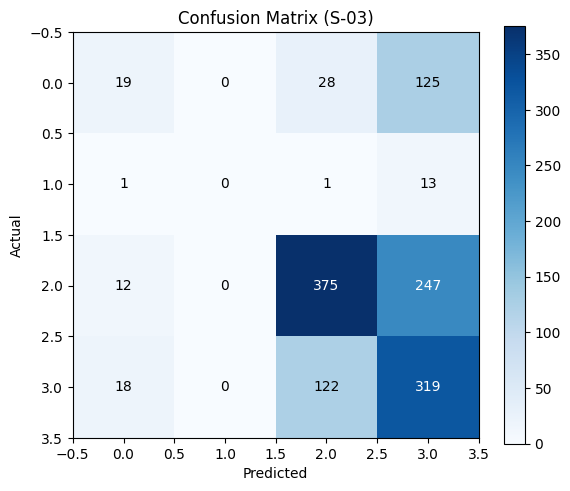

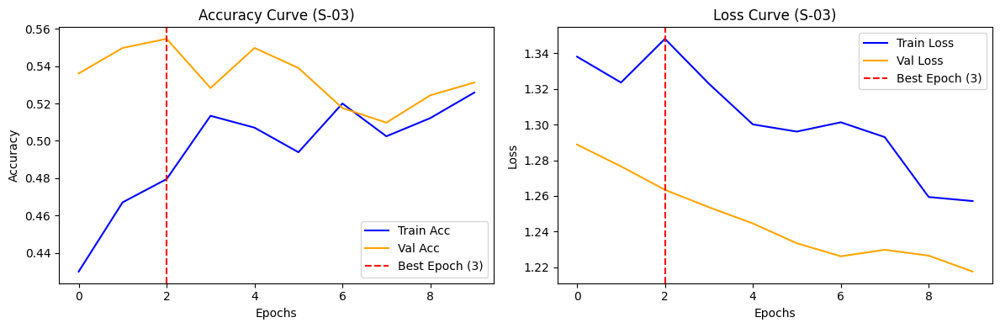

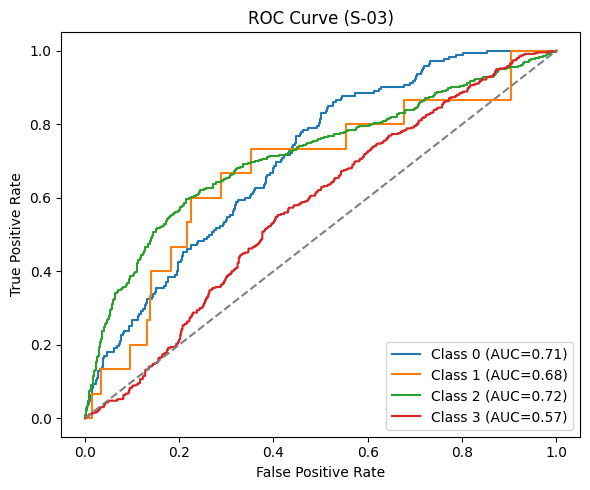

✅ Seluruh plot informatif untuk S-03 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-04
🛠️  Strategy: Freeze Semua | Optim: AdamW | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4023 | Val Acc: 0.4678 | Val Loss: 1.3006 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4702 | Val Acc: 0.4326 | Val Loss: 1.2911 
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.5083 | Val Acc: 0.5225 | Val Loss: 1.2692 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.5063 | Val Acc: 0.4844 | Val Loss: 1.2614 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.5088 | Val Acc: 0.5420 | Val Loss: 1.2483 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.5225 | Val Acc: 0.5488 | Val Loss: 1.2425 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.5056 | Val Acc: 0.5430 | Val Loss: 1.2320 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.5212 | Val Acc: 0.5518 | Val Loss: 1.2303 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.5315 | Val Acc: 0.5352 | Val Loss: 1.2217 
Epoch 10/25 | LR: 

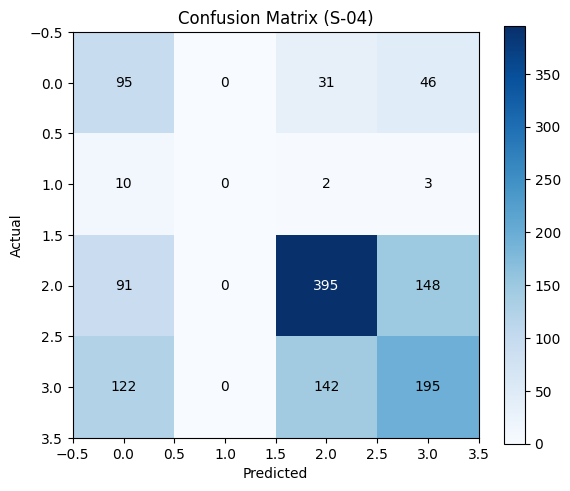

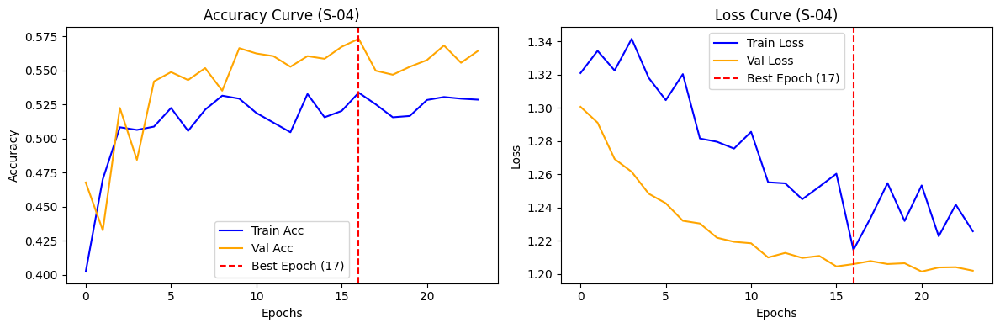

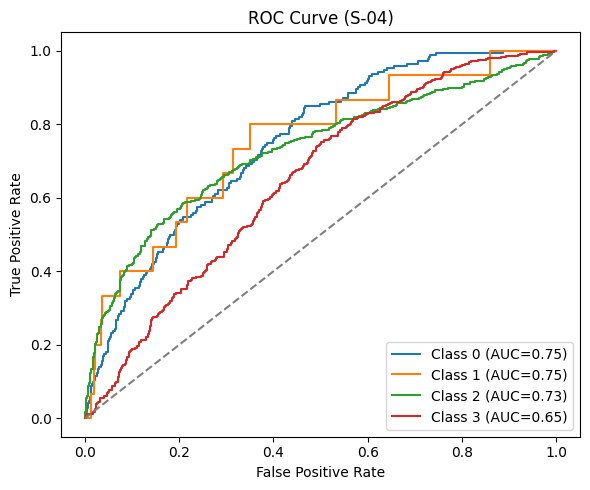

✅ Seluruh plot informatif untuk S-04 berhasil ditampilkan.


🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_freeze_all'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer dicetak sekali saja
info_printed = False

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: FREEZE SEMUA PARAMETER FEATURE EXTRACTOR
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FREEZE SEMUA):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    ("S-01", "Adam", "ReduceLROnPlateau"),
    ("S-02", "Adam", "CosineAnnealingLR"),
    ("S-03", "AdamW", "ReduceLROnPlateau"),
    ("S-04", "AdamW", "CosineAnnealingLR"),
    # ("S-05", "SGD", "ReduceLROnPlateau"),
    # ("S-06", "SGD", "CosineAnnealingLR"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-05
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER (FREEZE SEMUA):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3452 | Val Acc: 0.4111 | Val Loss: 1.3337 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.4163 | Val Acc: 0.4307 | Val Loss: 1.3136 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4441 | Val Acc: 0.4707 | Val Loss: 1.3019 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4409 | Val Acc: 0.4746 | Val Loss: 1.2961 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 

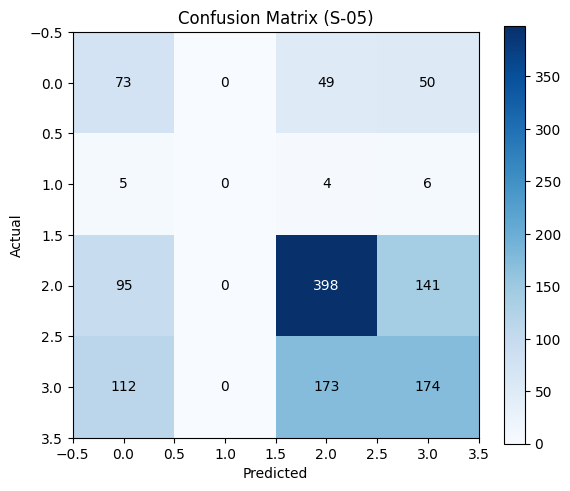

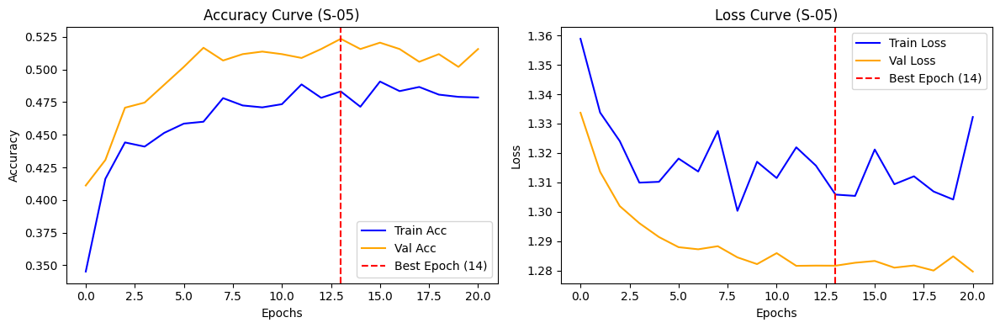

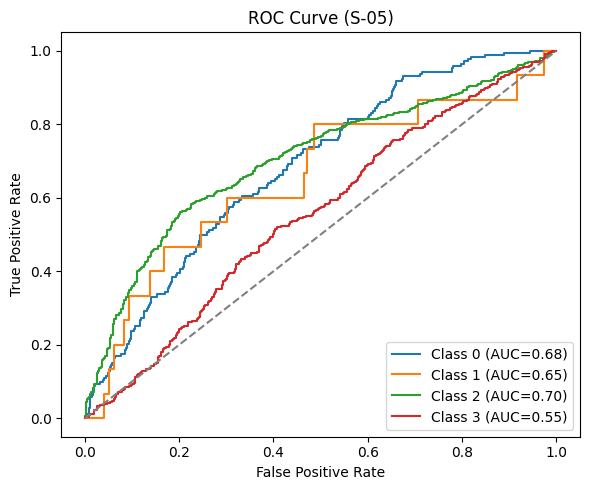

✅ Seluruh plot informatif untuk S-05 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-06
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3167 | Val Acc: 0.2959 | Val Loss: 1.3484 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3718 | Val Acc: 0.3799 | Val Loss: 1.3228 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4031 | Val Acc: 0.4307 | Val Loss: 1.3077 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4214 | Val Acc: 0.4424 | Val Loss: 1.3036 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4111 | Val Acc: 0.4570 | Val Loss: 1.2996 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4319 | Val Acc: 0.4590 | Val Loss: 1.2967 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4395 | Val Acc: 0.4941 | Val Loss: 1.2901 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4421 | Val Acc: 0.4893 | Val Loss: 1.2918 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.4512 | Val Acc: 0.5156 | Val Loss: 1.2890 ⭐ (Be

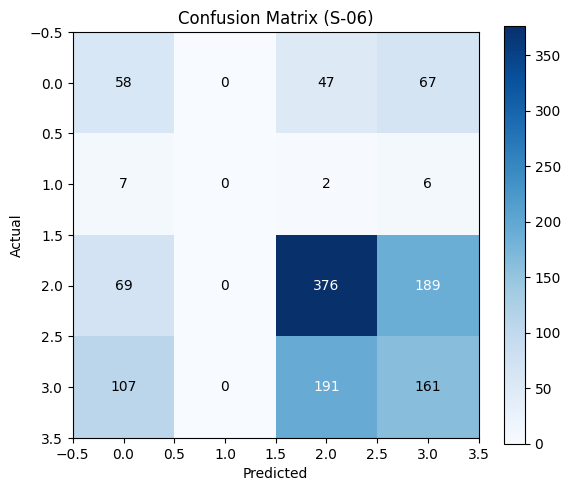

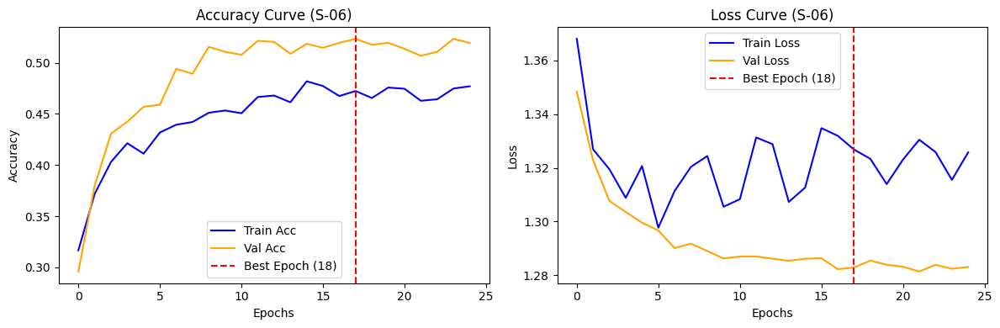

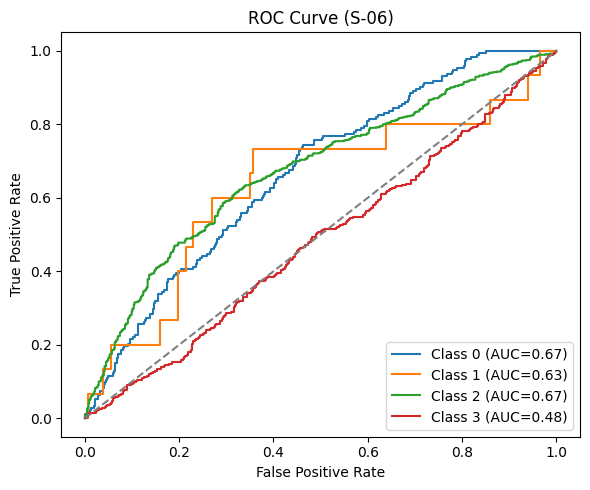

✅ Seluruh plot informatif untuk S-06 berhasil ditampilkan.


🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_freeze_all'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer dicetak sekali saja
info_printed = False

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: FREEZE SEMUA PARAMETER FEATURE EXTRACTOR
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FREEZE SEMUA):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    # ("S-01", "Adam", "ReduceLROnPlateau"),
    # ("S-02", "Adam", "CosineAnnealingLR"),
    # ("S-03", "AdamW", "ReduceLROnPlateau"),
    # ("S-04", "AdamW", "CosineAnnealingLR"),
    ("S-05", "SGD", "ReduceLROnPlateau"),
    ("S-06", "SGD", "CosineAnnealingLR"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-07
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: Adam | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER (Unfreeze Layer Terakhir):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 8,543,296 (36.33%)
   - Trainable Parameter: 14,972,932 (63.67%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4983 | Val Acc: 0.5293 | Val Loss: 1.0781 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5574 | Val Acc: 0.6328 | Val Loss: 1.0001 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6035 | Val Acc: 0.6504 | Val Loss: 0.8269 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.6304 | Val Acc: 0.6719 | Val Loss: 0.7316 ⭐ (Best)
Epo

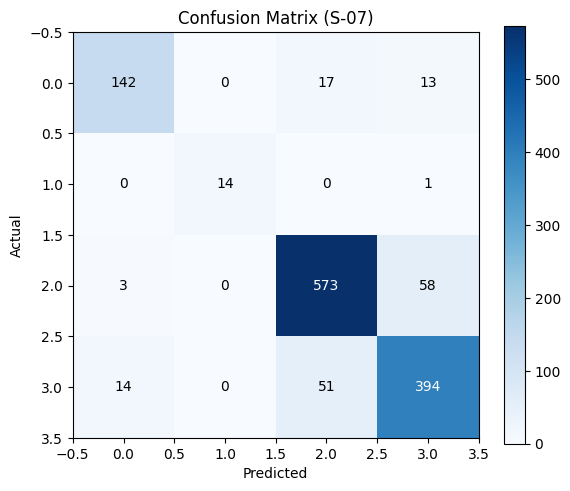

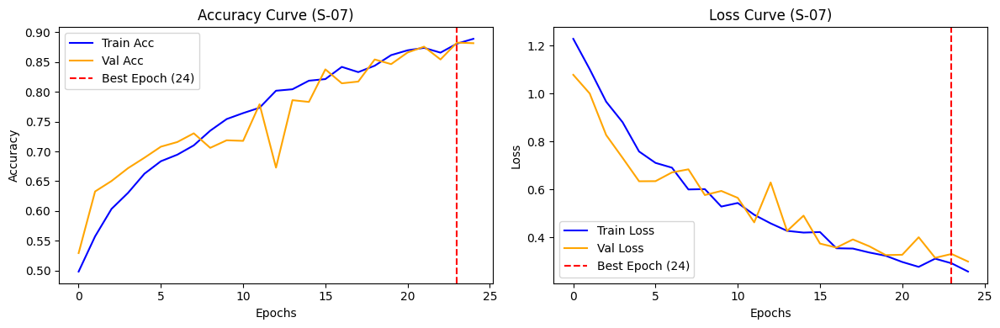

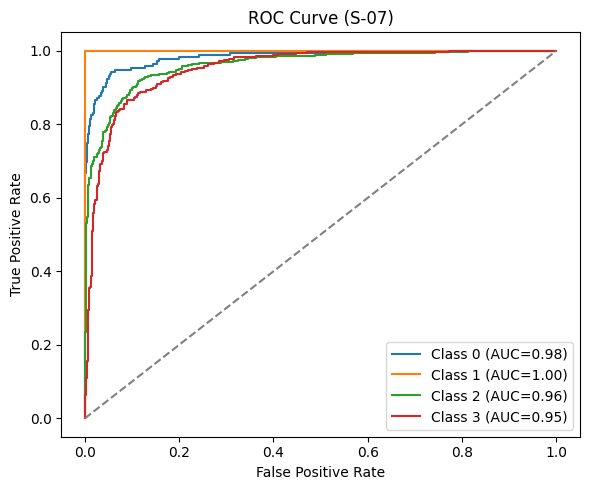

✅ Seluruh plot informatif untuk S-07 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-08
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: Adam | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4922 | Val Acc: 0.5635 | Val Loss: 1.1088 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5757 | Val Acc: 0.5781 | Val Loss: 0.9934 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6055 | Val Acc: 0.6230 | Val Loss: 0.8730 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.6340 | Val Acc: 0.6416 | Val Loss: 0.7245 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.6482 | Val Acc: 0.6816 | Val Loss: 0.7419 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.6794 | Val Acc: 0.7031 | Val Loss: 0.6936 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.6960 | Val Acc: 0.7109 | Val Loss: 0.7575 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.7227 | Val Acc: 0.7510 | Val Loss: 0.7324 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.7417 | Val Acc: 0.7637 | Va

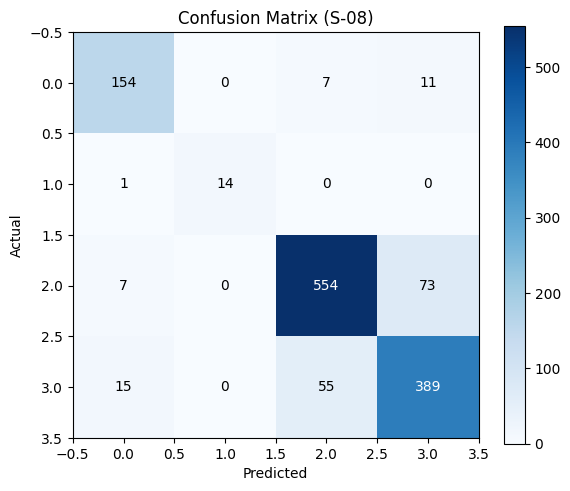

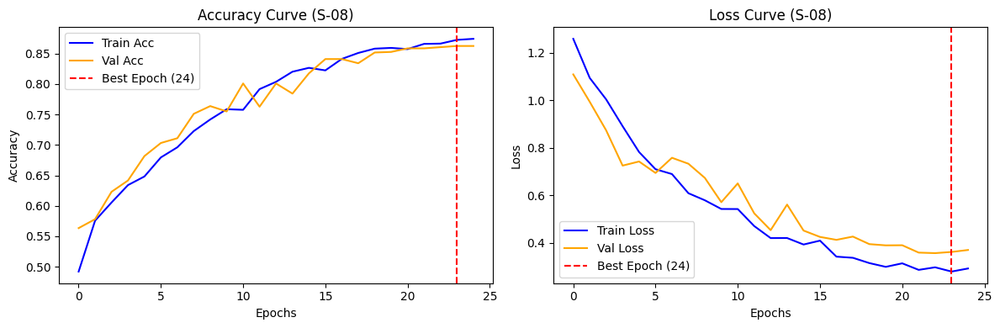

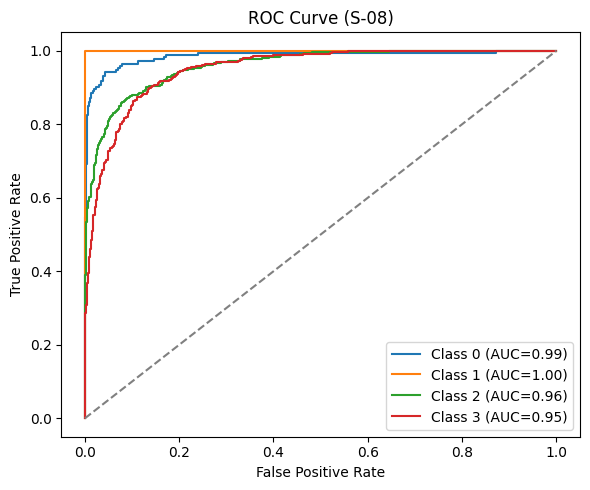

✅ Seluruh plot informatif untuk S-08 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-09
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: AdamW | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4839 | Val Acc: 0.5840 | Val Loss: 1.1726 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5488 | Val Acc: 0.6055 | Val Loss: 1.1171 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.5881 | Val Acc: 0.6299 | Val Loss: 0.8984 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.6362 | Val Acc: 0.6641 | Val Loss: 0.8060 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.6531 | Val Acc: 0.6221 | Val Loss: 0.8737 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.6711 | Val Acc: 0.6865 | Val Loss: 0.7107 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.6946 | Val Acc: 0.7354 | Val Loss: 0.8207 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7229 | Val Acc: 0.7480 | Val Loss: 0.5470 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.7302 | Val Acc: 0.7451 | Val Loss:

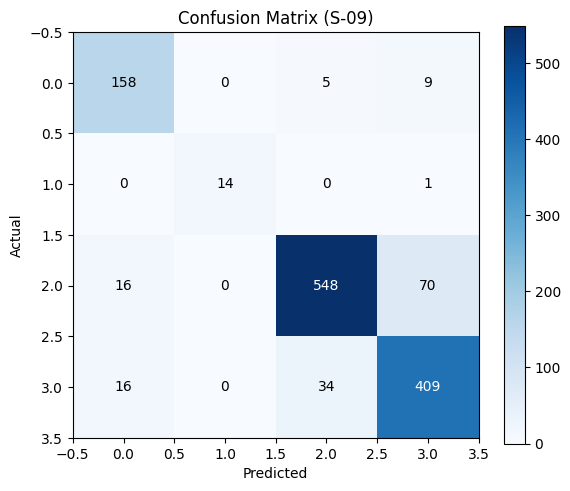

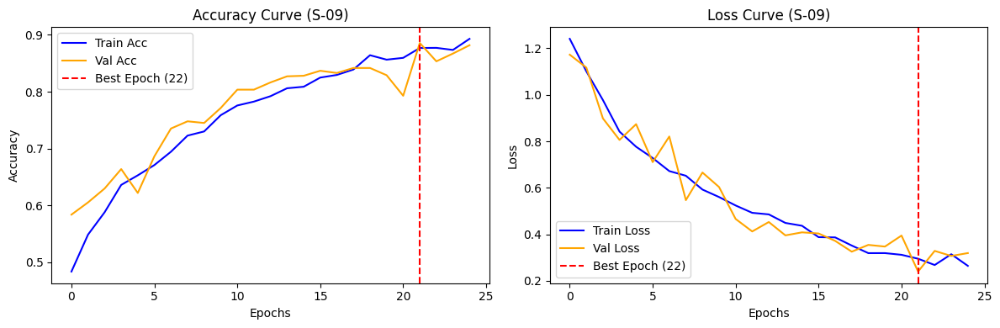

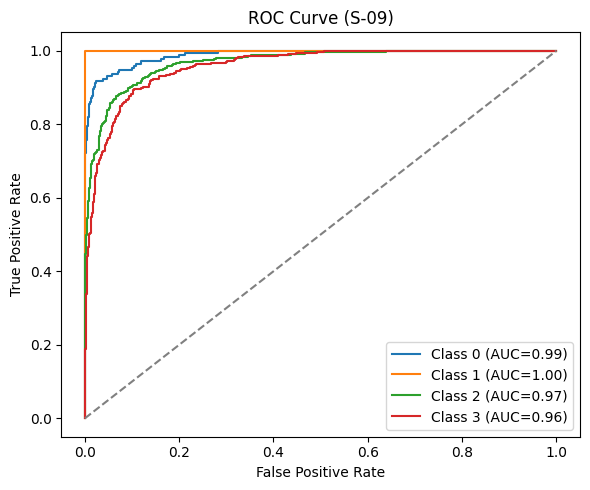

✅ Seluruh plot informatif untuk S-09 berhasil ditampilkan.


🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_unfreeze_last_layer'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Unfreeze Layer Terakhir":
        for param in model.parameters():
            param.requires_grad = False
        # Buka layer4 (Layer Konvolusi Terakhir)
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-07 s/d S-12)
# ==========================================

scenarios = [
    ("S-07", "Unfreeze Layer Terakhir", "Adam", "ReduceLROnPlateau"),
    ("S-08", "Unfreeze Layer Terakhir", "Adam", "CosineAnnealingLR"),
    ("S-09", "Unfreeze Layer Terakhir", "AdamW", "ReduceLROnPlateau"),
    # ("S-10", "Unfreeze Layer Terakhir", "AdamW", "CosineAnnealingLR"),
    # ("S-11", "Unfreeze Layer Terakhir", "SGD", "ReduceLROnPlateau"),
    # ("S-12", "Unfreeze Layer Terakhir", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-10
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: AdamW | Sched: CosineAnnealingLR

📊 INFORMASI LAYER (Unfreeze Layer Terakhir):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 8,543,296 (36.33%)
   - Trainable Parameter: 14,972,932 (63.67%)

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4983 | Val Acc: 0.5293 | Val Loss: 1.0781 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5552 | Val Acc: 0.6260 | Val Loss: 1.0120 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6042 | Val Acc: 0.6387 | Val Loss: 0.8362 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.6323 | Val Acc: 0.6758 | Val Loss: 0.7280 ⭐ (Best)
Ep

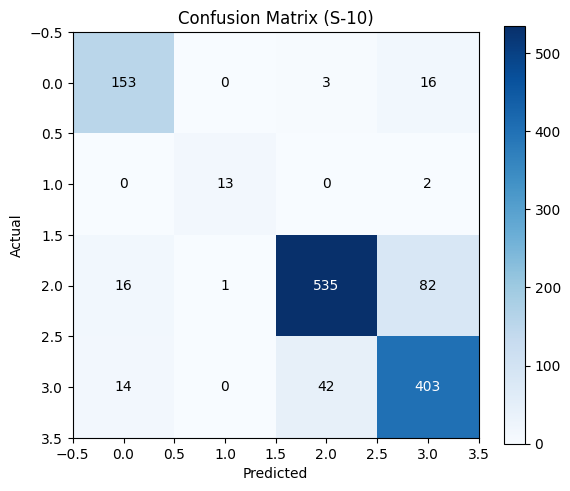

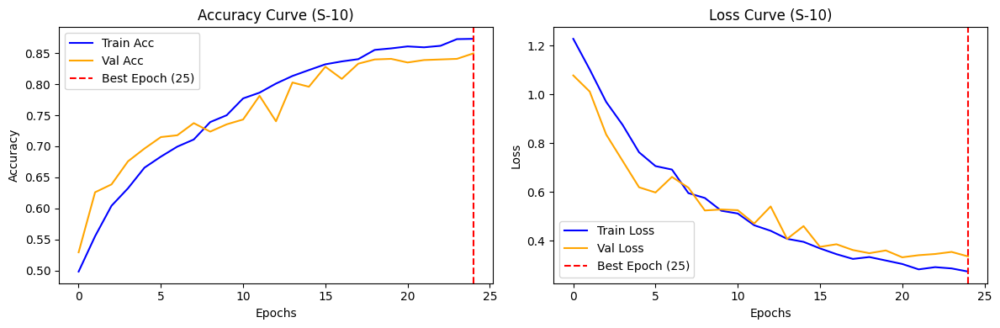

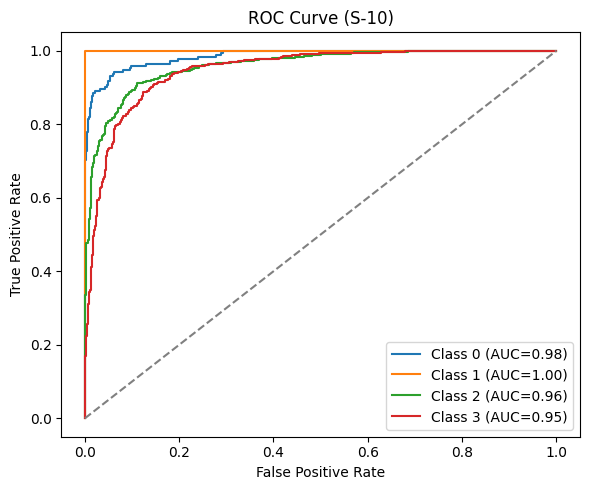

✅ Seluruh plot informatif untuk S-10 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-11
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: ReduceLROnPlateau

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2666 | Val Acc: 0.2734 | Val Loss: 1.3450 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3584 | Val Acc: 0.3584 | Val Loss: 1.3216 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4006 | Val Acc: 0.4482 | Val Loss: 1.3027 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4321 | Val Acc: 0.4756 | Val Loss: 1.2959 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4417 | Val Acc: 0.5049 | Val Loss: 1.2931 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4543 | Val Acc: 0.5088 | Val Loss: 1.2890 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4468 | Val Acc: 0.5039 | Val Loss: 1.2902 
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.4578 | Val Acc: 0.5283 | Val Loss: 1.2909 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.4624 | Val Acc: 0.5264 | Val Loss: 1

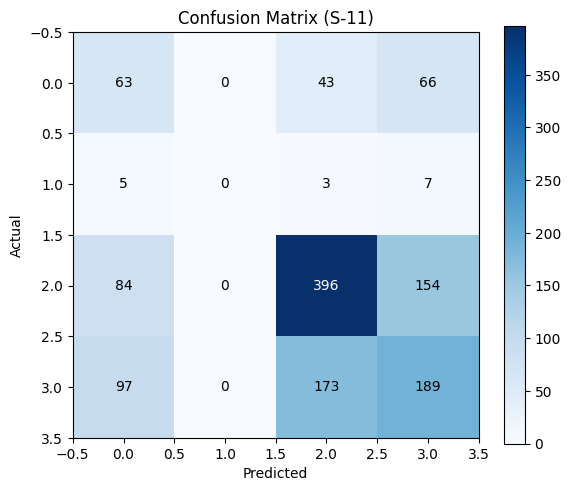

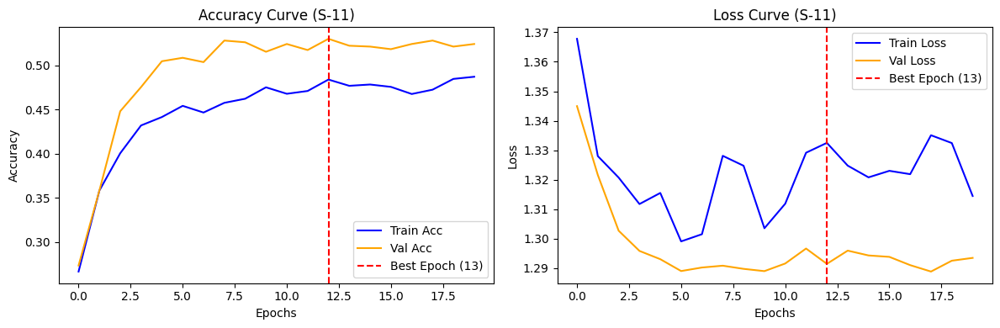

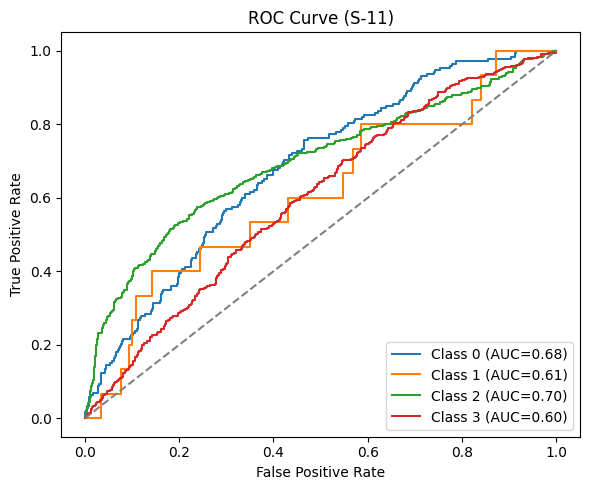

✅ Seluruh plot informatif untuk S-11 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-12
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3728 | Val Acc: 0.4189 | Val Loss: 1.3393 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.4114 | Val Acc: 0.4404 | Val Loss: 1.3178 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4275 | Val Acc: 0.4512 | Val Loss: 1.3060 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4307 | Val Acc: 0.4678 | Val Loss: 1.3003 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4470 | Val Acc: 0.4668 | Val Loss: 1.2958 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4441 | Val Acc: 0.4766 | Val Loss: 1.2920 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4424 | Val Acc: 0.4834 | Val Loss: 1.2931 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4551 | Val Acc: 0.4824 | Val Loss: 1.2919 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.4563 | Val Acc: 0.4727 | Val Loss: 1.2928 
E

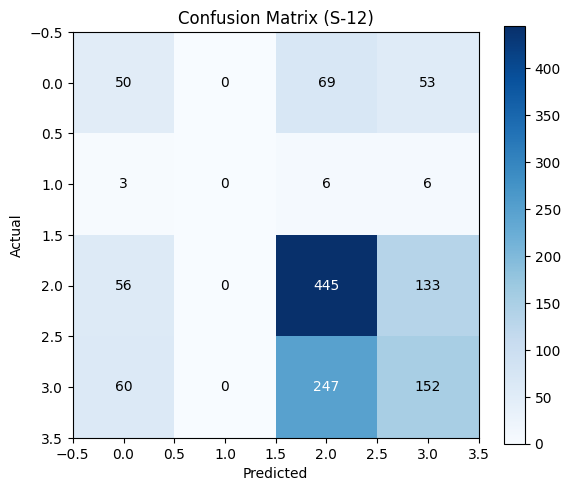

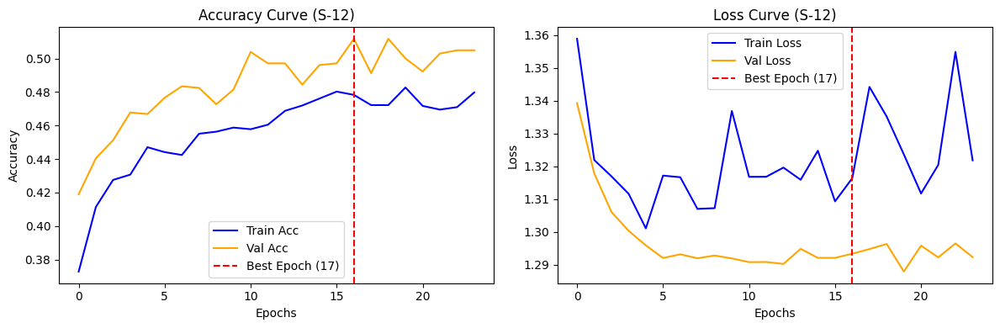

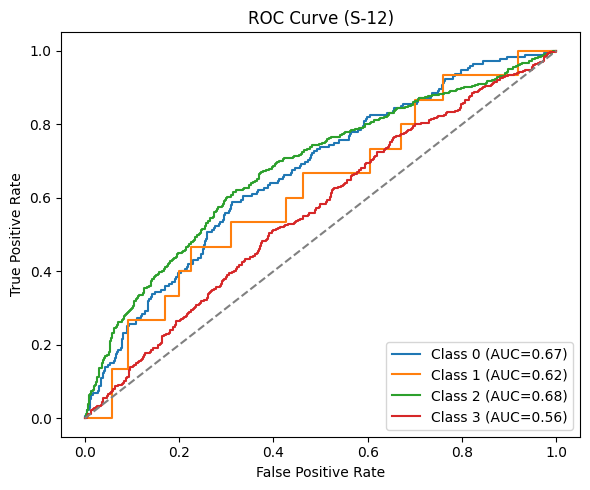

✅ Seluruh plot informatif untuk S-12 berhasil ditampilkan.


🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_unfreeze_last_layer'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Unfreeze Layer Terakhir":
        for param in model.parameters():
            param.requires_grad = False
        # Buka layer4 (Layer Konvolusi Terakhir)
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-07 s/d S-12)
# ==========================================

scenarios = [
    # ("S-07", "Unfreeze Layer Terakhir", "Adam", "ReduceLROnPlateau"),
    # ("S-08", "Unfreeze Layer Terakhir", "Adam", "CosineAnnealingLR"),
    # ("S-09", "Unfreeze Layer Terakhir", "AdamW", "ReduceLROnPlateau"),
    ("S-10", "Unfreeze Layer Terakhir", "AdamW", "CosineAnnealingLR"),
    ("S-11", "Unfreeze Layer Terakhir", "SGD", "ReduceLROnPlateau"),
    ("S-12", "Unfreeze Layer Terakhir", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 2 (S-07 hingga S-12) SELESAI DIEKSEKUSI!")

Mounted at /content/drive
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning
Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-13
🛠️  Strategy: Full Tuning | Optim: Adam | Sched: ReduceLROnPlateau
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 168MB/s]



📊 INFORMASI LAYER (Full Tuning):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5168 | Val Acc: 0.5449 | Val Loss: 1.0811 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5898 | Val Acc: 0.6328 | Val Loss: 0.9674 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6401 | Val Acc: 0.7080 | Val Loss: 0.6183 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7114 | Val Acc: 0.7100 | Val Loss: 0.7196 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7798 | Val Acc: 0.7793 | Val Loss: 0.5577 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8215 | Val Acc: 0.8213 | Val Loss: 0.4566 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8528 | Val Acc: 0.8311 | Val Loss: 0.5388 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.8843 | Val Acc: 0.8008 | Val Loss: 0.6531 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9128 | Val Acc: 0.8799 | Val Loss: 0.4018 ⭐ (

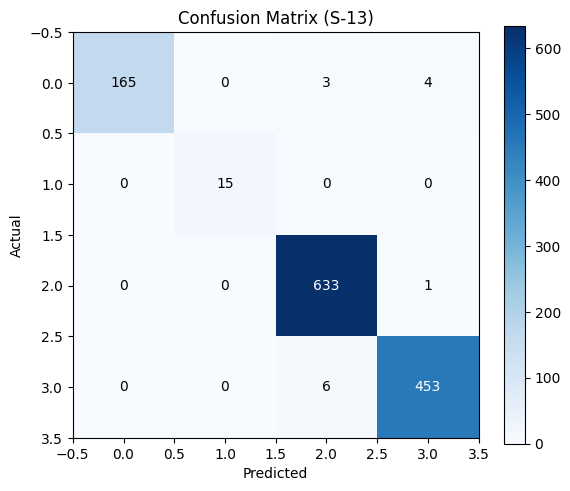

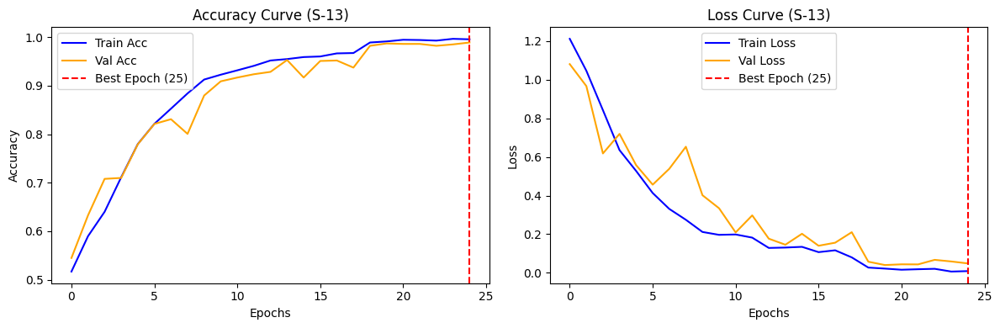

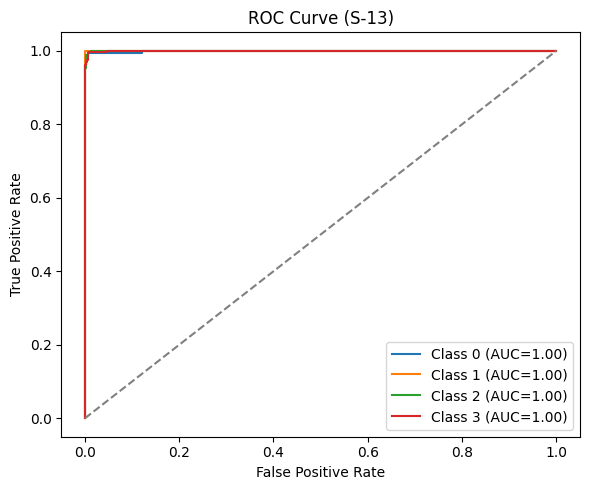

✅ Seluruh plot informatif untuk S-13 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-14
🛠️  Strategy: Full Tuning | Optim: Adam | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4902 | Val Acc: 0.5684 | Val Loss: 1.1057 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5852 | Val Acc: 0.6211 | Val Loss: 0.9011 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6682 | Val Acc: 0.7031 | Val Loss: 0.7380 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7393 | Val Acc: 0.7500 | Val Loss: 0.5803 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7847 | Val Acc: 0.8047 | Val Loss: 0.4671 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8376 | Val Acc: 0.8555 | Val Loss: 0.3593 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.8738 | Val Acc: 0.8066 | Val Loss: 0.4751 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8926 | Val Acc: 0.9141 | Val Loss: 0.2235 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9221 | Val Acc: 0.9121 | Val Loss: 0.2125 
Epoc

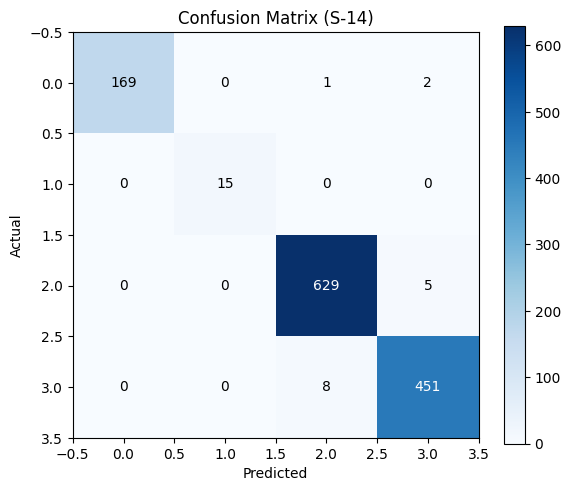

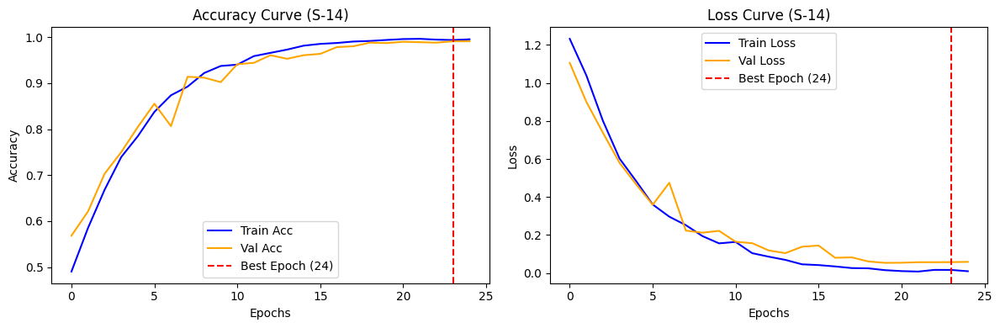

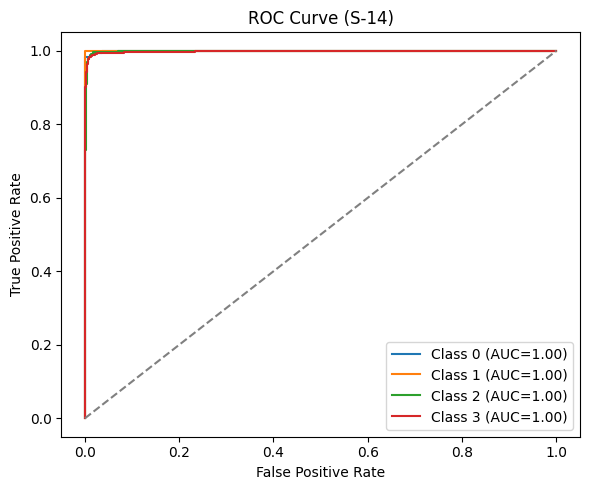

✅ Seluruh plot informatif untuk S-14 berhasil ditampilkan.


🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_full_tuning'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Full Tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-13 s/d S-18)
# ==========================================

scenarios = [
    ("S-13", "Full Tuning", "Adam", "ReduceLROnPlateau"),
    ("S-14", "Full Tuning", "Adam", "CosineAnnealingLR"),
    # ("S-15", "Full Tuning", "AdamW", "ReduceLROnPlateau"),
    # ("S-16", "Full Tuning", "AdamW", "CosineAnnealingLR"),
    # ("S-17", "Full Tuning", "SGD", "ReduceLROnPlateau"),
    # ("S-18", "Full Tuning", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-15
🛠️  Strategy: Full Tuning | Optim: AdamW | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER (Full Tuning):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5168 | Val Acc: 0.5449 | Val Loss: 1.0811 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.5898 | Val Acc: 0.6328 | Val Loss: 0.9674 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6401 | Val Acc: 0.7080 | Val Loss: 0.6183 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7114 | Val Acc: 0.7100 | Val Loss: 0.7196 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.

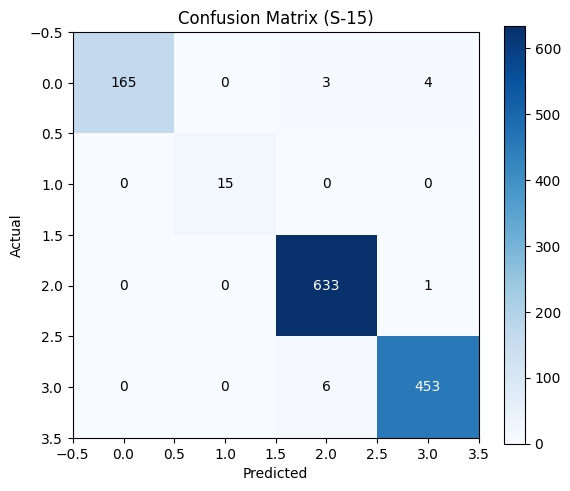

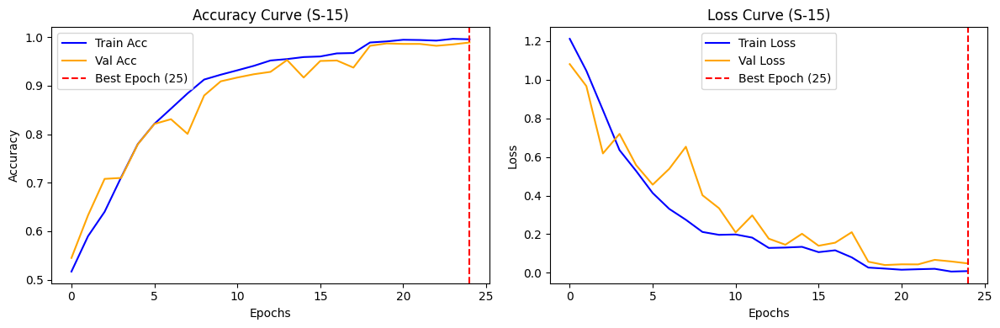

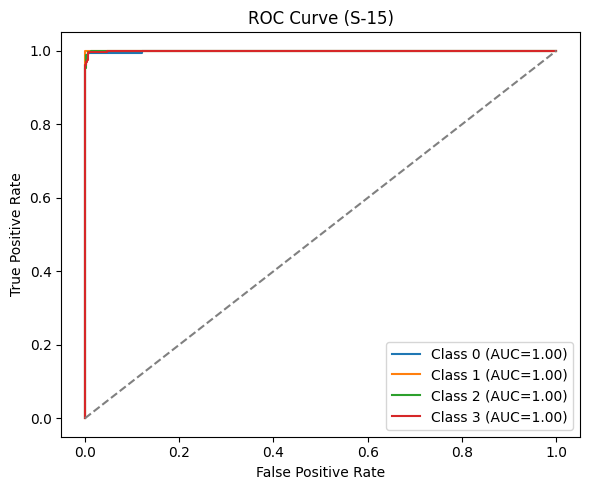

✅ Seluruh plot informatif untuk S-15 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-16
🛠️  Strategy: Full Tuning | Optim: AdamW | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.4902 | Val Acc: 0.5684 | Val Loss: 1.1057 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.5852 | Val Acc: 0.6211 | Val Loss: 0.9011 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.6682 | Val Acc: 0.7031 | Val Loss: 0.7380 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7393 | Val Acc: 0.7500 | Val Loss: 0.5803 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7847 | Val Acc: 0.8047 | Val Loss: 0.4671 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8376 | Val Acc: 0.8555 | Val Loss: 0.3593 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.8738 | Val Acc: 0.8066 | Val Loss: 0.4751 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8926 | Val Acc: 0.9141 | Val Loss: 0.2235 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9221 | Val Acc: 0.9121 | Val Loss: 0.2125 
Epo

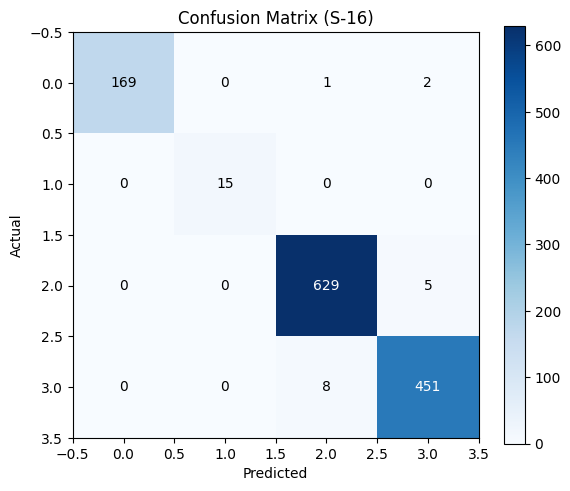

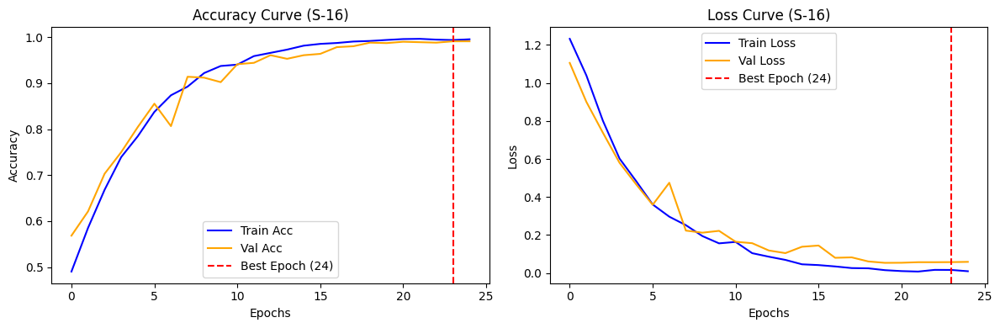

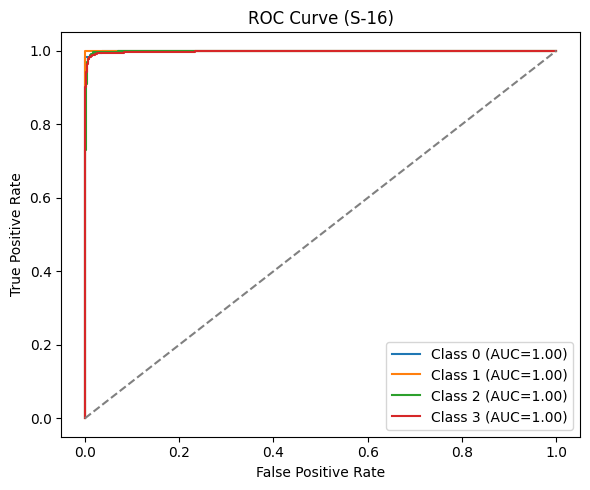

✅ Seluruh plot informatif untuk S-16 berhasil ditampilkan.


🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_full_tuning'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Full Tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-13 s/d S-18)
# ==========================================

scenarios = [
    # ("S-13", "Full Tuning", "Adam", "ReduceLROnPlateau"),
    # ("S-14", "Full Tuning", "Adam", "CosineAnnealingLR"),
    ("S-15", "Full Tuning", "AdamW", "ReduceLROnPlateau"),
    ("S-16", "Full Tuning", "AdamW", "CosineAnnealingLR"),
    # ("S-17", "Full Tuning", "SGD", "ReduceLROnPlateau"),
    # ("S-18", "Full Tuning", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-17
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: ReduceLROnPlateau

📊 INFORMASI LAYER (Full Tuning):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2861 | Val Acc: 0.3643 | Val Loss: 1.3746 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3362 | Val Acc: 0.4170 | Val Loss: 1.3589 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.3677 | Val Acc: 0.4268 | Val Loss: 1.3421 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.3733 | Val Acc: 0.4648 | Val Loss: 1.3307 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.39

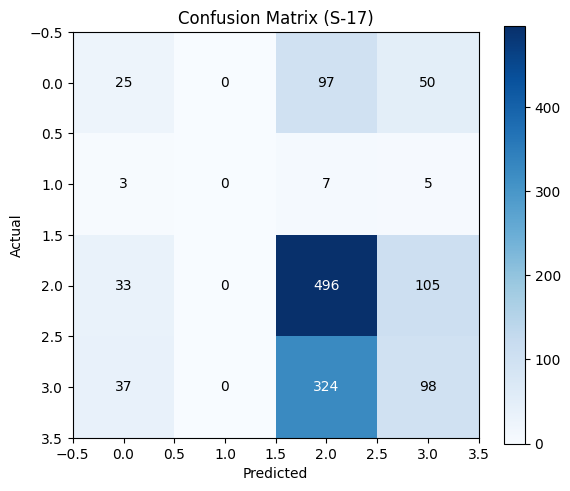

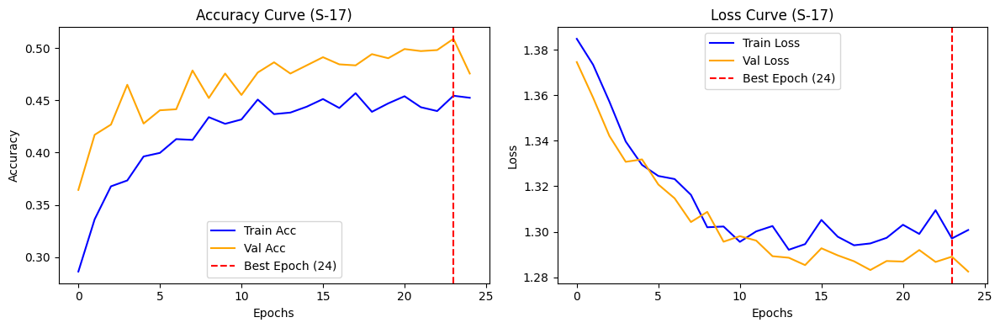

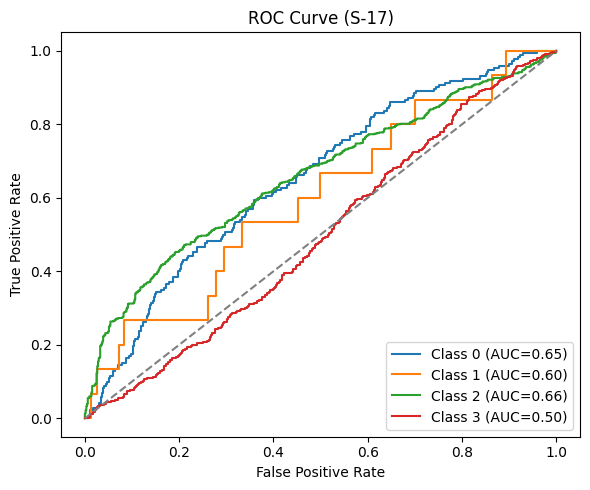

✅ Seluruh plot informatif untuk S-17 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-18
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: CosineAnnealingLR

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.1909 | Val Acc: 0.2363 | Val Loss: 1.3758 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2556 | Val Acc: 0.2139 | Val Loss: 1.3726 
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2856 | Val Acc: 0.2734 | Val Loss: 1.3559 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3218 | Val Acc: 0.3418 | Val Loss: 1.3501 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3328 | Val Acc: 0.3555 | Val Loss: 1.3374 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3564 | Val Acc: 0.3125 | Val Loss: 1.3316 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.3750 | Val Acc: 0.3760 | Val Loss: 1.3239 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.3684 | Val Acc: 0.4053 | Val Loss: 1.3177 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.3694 | Val Acc: 0.4189 | Val Loss: 1.3097 ⭐ (Best)
Epoch

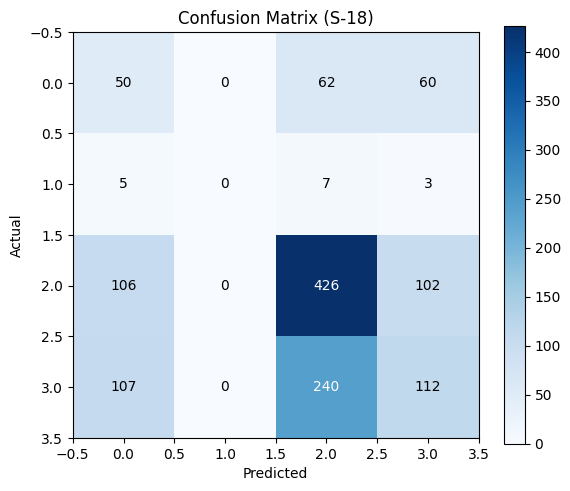

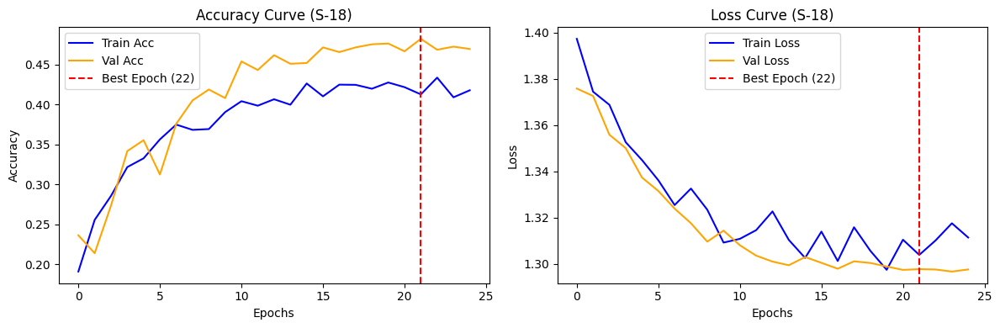

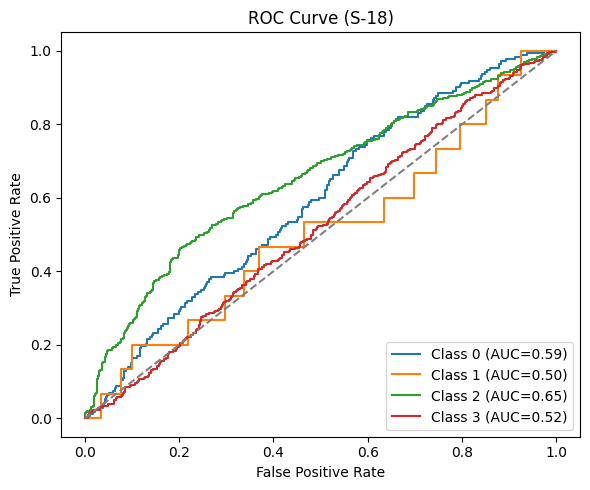

✅ Seluruh plot informatif untuk S-18 berhasil ditampilkan.


🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_full_tuning'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI CLASS WEIGHTS (LOSS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer tidak di-print berulang-ulang
printed_strategies = set()

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_strategy, optimizer_type, scheduler_type):
    global printed_strategies

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: {fine_tune_strategy} | Optim: {optimizer_type} | Sched: {scheduler_type}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOGIKA FINE TUNING
    if fine_tune_strategy == "Full Tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI PER STRATEGI)
    if fine_tune_strategy not in printed_strategies:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER ({fine_tune_strategy}):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        printed_strategies.add(fine_tune_strategy)

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS, OPTIMIZER & SCHEDULER ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "Adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "AdamW":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "SGD":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "ReduceLROnPlateau":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "CosineAnnealingLR":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "ReduceLROnPlateau":
            scheduler.step(val_acc)
        elif scheduler_type == "CosineAnnealingLR":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-13 s/d S-18)
# ==========================================

scenarios = [
    # ("S-13", "Full Tuning", "Adam", "ReduceLROnPlateau"),
    # ("S-14", "Full Tuning", "Adam", "CosineAnnealingLR"),
    # ("S-15", "Full Tuning", "AdamW", "ReduceLROnPlateau"),
    # ("S-16", "Full Tuning", "AdamW", "CosineAnnealingLR"),
    ("S-17", "Full Tuning", "SGD", "ReduceLROnPlateau"),
    ("S-18", "Full Tuning", "SGD", "CosineAnnealingLR"),
]

for s_name, ft_strat, optim_type, sched_type in scenarios:
    run_experiment(s_name, ft_strat, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 3 (S-13 hingga S-18) SELESAI DIEKSEKUSI!")

# WEIGHTED RANDOM SAMPLER + AUG (ALL SKENARIO)

Device: cuda
Loading dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:124: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: NO_AUG_WITH_SAMPLER (WEIGHTED SAMPLER)
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 166MB/s]


Epoch 01/25 | Train Acc: 0.7092 | Val Acc: 0.6387 | Val Loss: 0.8678
Epoch 02/25 | Train Acc: 0.8792 | Val Acc: 0.7256 | Val Loss: 0.7413
Epoch 03/25 | Train Acc: 0.9319 | Val Acc: 0.8047 | Val Loss: 0.5457
Epoch 04/25 | Train Acc: 0.9546 | Val Acc: 0.8389 | Val Loss: 0.4466
Epoch 05/25 | Train Acc: 0.9666 | Val Acc: 0.8525 | Val Loss: 0.5891
Epoch 06/25 | Train Acc: 0.9697 | Val Acc: 0.8604 | Val Loss: 0.5208
Epoch 07/25 | Train Acc: 0.9734 | Val Acc: 0.8848 | Val Loss: 0.3632
Epoch 08/25 | Train Acc: 0.9829 | Val Acc: 0.9004 | Val Loss: 0.3840
Epoch 09/25 | Train Acc: 0.9858 | Val Acc: 0.8965 | Val Loss: 0.4016
Epoch 10/25 | Train Acc: 0.9871 | Val Acc: 0.9004 | Val Loss: 0.4079
Epoch 11/25 | Train Acc: 0.9905 | Val Acc: 0.9102 | Val Loss: 0.3714
Epoch 12/25 | Train Acc: 0.9944 | Val Acc: 0.9004 | Val Loss: 0.4645
Epoch 13/25 | Train Acc: 0.9910 | Val Acc: 0.9268 | Val Loss: 0.3038
Epoch 14/25 | Train Acc: 0.9912 | Val Acc: 0.8682 | Val Loss: 0.7046
Epoch 15/25 | Train Acc: 0.9946 | 

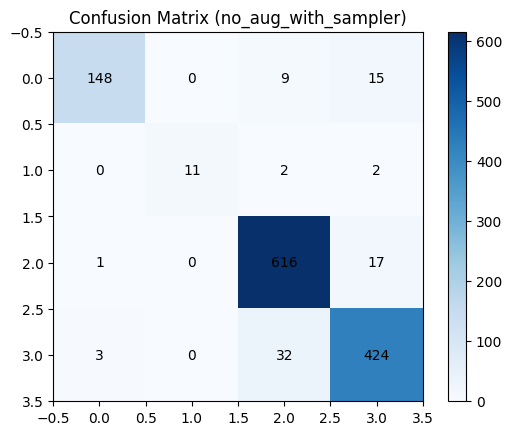

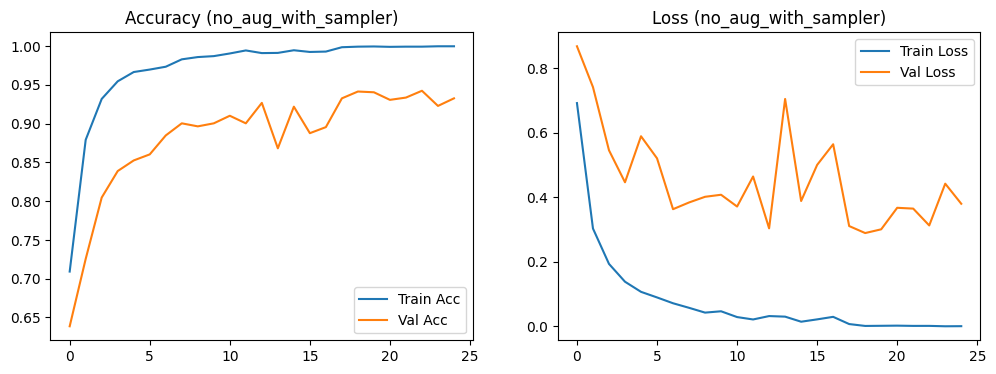

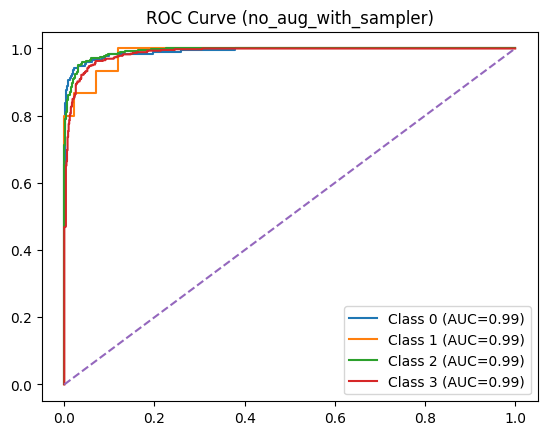

Eksperimen no_aug_with_sampler selesai di-render.

MULAI EKSPERIMEN: WITH_AUG_WITH_SAMPLER (WEIGHTED SAMPLER)
Epoch 01/25 | Train Acc: 0.5854 | Val Acc: 0.5732 | Val Loss: 0.8869
Epoch 02/25 | Train Acc: 0.7056 | Val Acc: 0.6543 | Val Loss: 0.7805
Epoch 03/25 | Train Acc: 0.7578 | Val Acc: 0.6777 | Val Loss: 0.7223
Epoch 04/25 | Train Acc: 0.7925 | Val Acc: 0.7354 | Val Loss: 0.6040
Epoch 05/25 | Train Acc: 0.8159 | Val Acc: 0.6963 | Val Loss: 0.7162
Epoch 06/25 | Train Acc: 0.8430 | Val Acc: 0.7549 | Val Loss: 0.6117
Epoch 07/25 | Train Acc: 0.8640 | Val Acc: 0.7520 | Val Loss: 0.5653
Epoch 08/25 | Train Acc: 0.8855 | Val Acc: 0.8242 | Val Loss: 0.4704
Epoch 09/25 | Train Acc: 0.8896 | Val Acc: 0.8555 | Val Loss: 0.3763
Epoch 10/25 | Train Acc: 0.9060 | Val Acc: 0.8350 | Val Loss: 0.4676
Epoch 11/25 | Train Acc: 0.9060 | Val Acc: 0.8770 | Val Loss: 0.3182
Epoch 12/25 | Train Acc: 0.9270 | Val Acc: 0.8574 | Val Loss: 0.3905
Epoch 13/25 | Train Acc: 0.9292 | Val Acc: 0.8916 | Val Loss: 

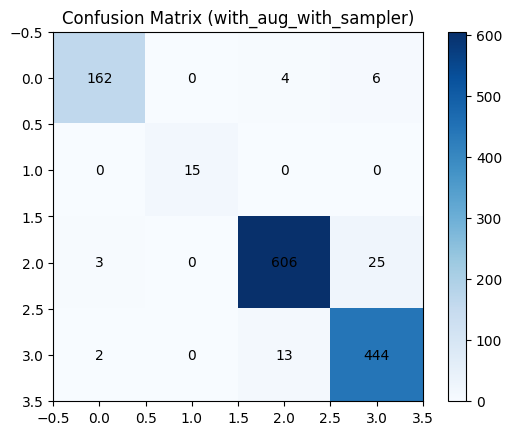

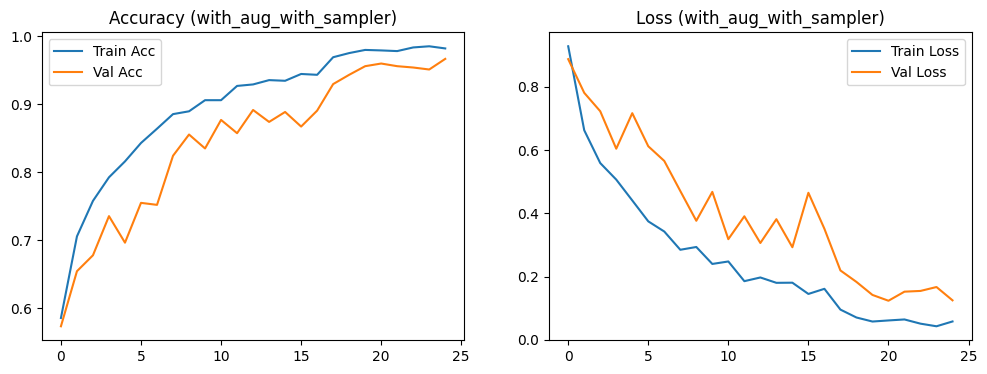

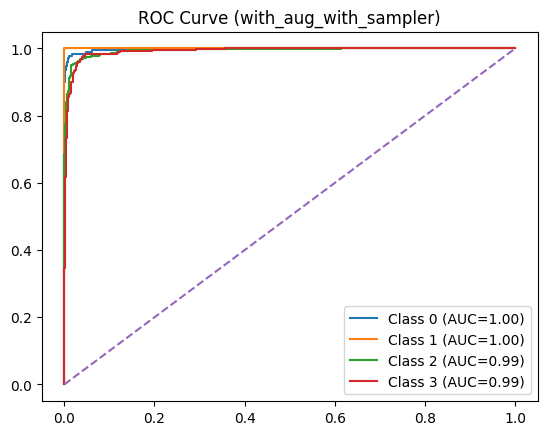

Eksperimen with_aug_with_sampler selesai di-render.

Kedua skenario selesai dieksekusi dengan Weighted Random Sampler.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random
import os

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"] # 5120 data
test_data = dataset["test"]      # 1280 data

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
# Hitung bobot per kelas
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

# Mapping bobot ke setiap sampel data di training set
sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

# Buat Sampler
sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (SKENARIO)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_none = base_transform

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, train_transform):
    print(f"\n{'='*50}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()} (WEIGHTED SAMPLER)")
    print(f"{'='*50}")

    # Data Loaders
    train_loader = DataLoader(
        AlzheimerDataset(train_data_raw, train_transform),
        batch_size=CONFIG["batch_size"],
        sampler=sampler, # Menggunakan Sampler
        shuffle=False,   # WAJIB False jika pakai sampler
        num_workers=CONFIG["num_workers"]
    )
    val_loader = DataLoader(
        AlzheimerDataset(val_data_raw, base_transform),
        batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
    )
    test_loader = DataLoader(
        AlzheimerDataset(test_data, base_transform),
        batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
    )

    # Setup Model
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)
    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer3.parameters():
        param.requires_grad = True
    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # Loss menggunakan standard CrossEntropy tanpa bobot tambahan
    criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=CONFIG["lr"]
    )

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=3, factor=0.3
    )

    # Training Loop
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total
        scheduler.step(val_acc)

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load best weights directly from RAM
    model.load_state_dict(best_model)

    # Testing
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    all_data = []

    with torch.no_grad():
        for images, labels, indices in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

            for i in range(len(images)):
                all_data.append({
                    "image": images[i].cpu(),
                    "label": labels[i].item(),
                    "pred": preds[i].item()
                })

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------------------------------
    # Plotting (Ditampilkan langsung)
    # ------------------------------------------

    # 1. Confusion Matrix
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center")
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.legend()
    plt.title(f"ROC Curve ({scenario_name})")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai di-render.")
    return all_data

# ==========================================
# 7. JALANKAN KEDUA SKENARIO
# ==========================================
# Skenario 1: Tanpa Data Augmentasi
data_no_aug = run_experiment("no_aug_with_sampler", train_transform_none)

# Skenario 2: Dengan Data Augmentasi
data_with_aug = run_experiment("with_aug_with_sampler", train_transform_aug)

print("\nKedua skenario selesai dieksekusi dengan Weighted Random Sampler.")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-01
Strategy: Freeze Semua | Optim: ADAM | Sched: REDUCE_LR
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3118 | Val Acc: 0.2764 | Val Loss: 1.3826
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3965 | Val Acc: 0.3887 | Val Loss: 1.3478
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4321 | Val Acc: 0.4033 | Val Loss: 1.3370
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4678 | Val Acc: 0.3662 | Val Loss: 1.3515
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4683 | Val Acc: 0.4531 | Val Loss: 1.2997
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4932 | Val Acc: 0.4414 | Val Loss: 1.2727
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4822 | Val Acc: 0.4102 | Val Loss: 1.2996
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.4980 | Val Acc: 0.4150 | Val Loss: 1.2847
Epoch 09/25 | LR: 3.00e-05 | Train Acc: 0.5159 | Val Acc: 0.4473 | Val Loss: 1.2802
Epoch 10/25 | LR: 3.00e-05 | Train Acc: 0.5110 | Val Acc: 0.4434 | Val Loss: 1.2785
Epoch 11/25

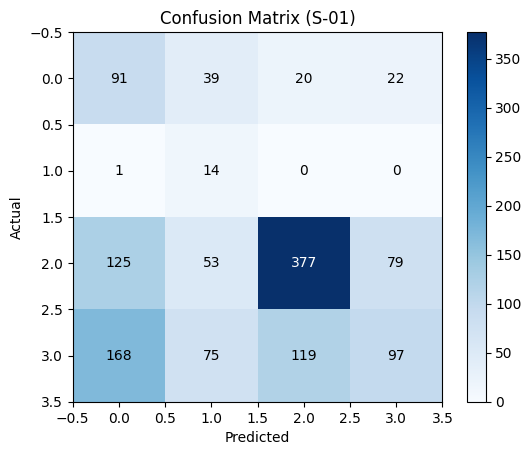

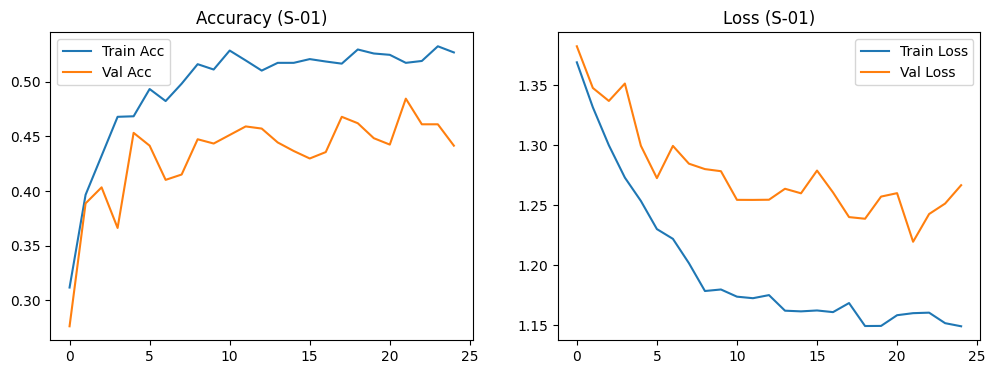

Eksperimen S-01 selesai.


MULAI EKSPERIMEN: S-02
Strategy: Freeze Semua | Optim: ADAM | Sched: COSINE
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3201 | Val Acc: 0.4004 | Val Loss: 1.3431
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3972 | Val Acc: 0.3877 | Val Loss: 1.3305
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4385 | Val Acc: 0.4463 | Val Loss: 1.3032
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4412 | Val Acc: 0.4336 | Val Loss: 1.2968
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4763 | Val Acc: 0.4355 | Val Loss: 1.2912
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4978 | Val Acc: 0.4434 | Val Loss: 1.2901
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4946 | Val Acc: 0.4521 | Val Loss: 1.2760
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4983 | Val Acc: 0.4463 | Val Loss: 1.2783
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.5017 | Val Acc: 0.4258 | Val Loss: 1.2805
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.5120 | Val Acc: 0.4268 | Val Loss: 1.2770
Epoch 11/25 | LR: 5.94e-05 | Train Acc: 0.5178 | Val Acc:

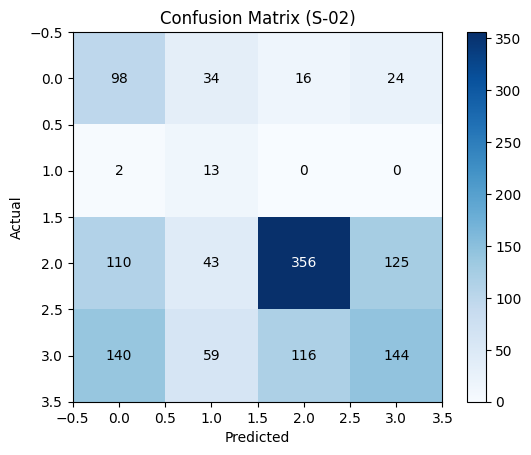

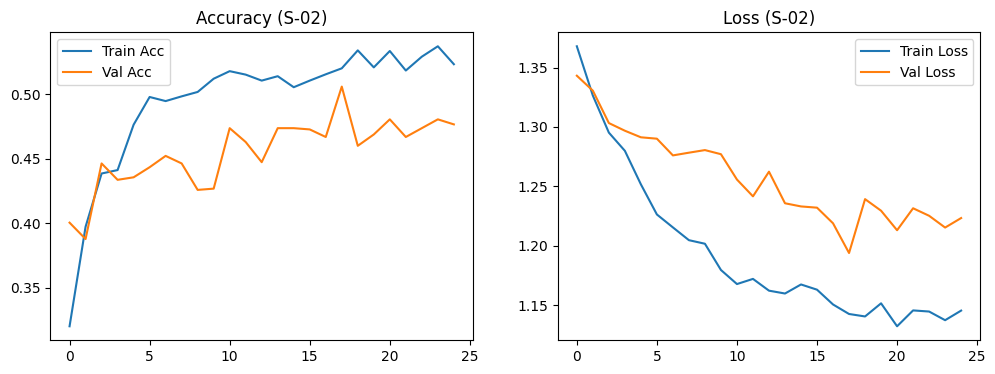

Eksperimen S-02 selesai.


MULAI EKSPERIMEN: S-03
Strategy: Freeze Semua | Optim: ADAMW | Sched: REDUCE_LR
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3062 | Val Acc: 0.1660 | Val Loss: 1.4071
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3987 | Val Acc: 0.4092 | Val Loss: 1.3446
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4302 | Val Acc: 0.4092 | Val Loss: 1.3300
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4719 | Val Acc: 0.4053 | Val Loss: 1.3243
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4734 | Val Acc: 0.4062 | Val Loss: 1.3210
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4841 | Val Acc: 0.4268 | Val Loss: 1.2949
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4875 | Val Acc: 0.4053 | Val Loss: 1.3037
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.4949 | Val Acc: 0.4355 | Val Loss: 1.2684
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.5020 | Val Acc: 0.4521 | Val Loss: 1.2722
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.4988 | Val Acc: 0.4863 | Val Loss: 1.2216
Epoch 11/25 | LR: 1.00e-04 | Train Acc: 0.5144 | Val 

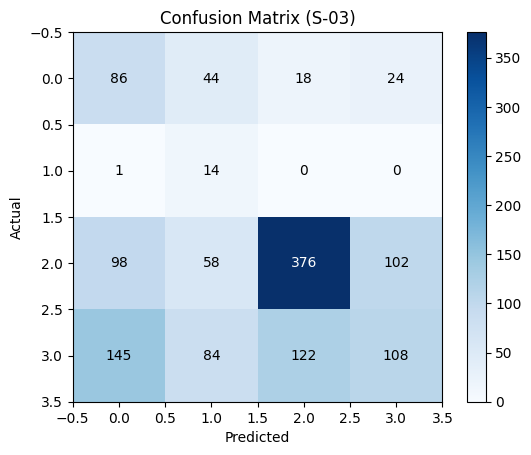

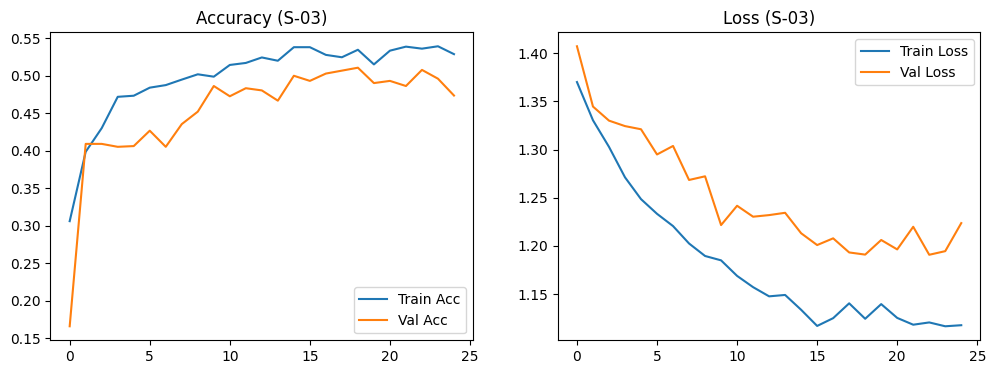

Eksperimen S-03 selesai.

Semua skenario Freeze Semua (S-01 s/d S-03) telah selesai dievaluasi.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Ingat: ColorJitter sudah dihapus
train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Instansiasi Dataset
train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# Data Loaders (Dikunci menggunakan Sampler)
train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Freeze Semua | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-01 sampai S-06 menggunakan "Freeze Semua"
    for param in model.parameters():
        param.requires_grad = False

    # Layer klasifikasi baru akan secara default requires_grad = True
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # ------------------ LOSS FUNCTION ------------------
    # Standard loss karena kita sudah menggunakan WeightedRandomSampler
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Eksekusi Scheduler
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING (Berdasarkan Val Loss)
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load best weights directly from RAM
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, indices in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-01 s/d S-06
# ==========================================

run_experiment("S-01", optimizer_type="adam", scheduler_type="reduce_lr")
run_experiment("S-02", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-03", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-04", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-05", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-06", optimizer_type="sgd", scheduler_type="cosine")

print("Semua skenario Freeze Semua (S-01 s/d S-03) telah selesai dievaluasi.")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-04
Strategy: Freeze Semua | Optim: ADAMW | Sched: COSINE
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3118 | Val Acc: 0.2764 | Val Loss: 1.3826
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3965 | Val Acc: 0.3877 | Val Loss: 1.3479
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4321 | Val Acc: 0.4033 | Val Loss: 1.3373
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4663 | Val Acc: 0.3652 | Val Loss: 1.3520
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4666 | Val Acc: 0.4512 | Val Loss: 1.3014
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4922 | Val Acc: 0.4385 | Val Loss: 1.2768
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4805 | Val Acc: 0.4102 | Val Loss: 1.3015
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4956 | Val Acc: 0.4170 | Val Loss: 1.2865
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.5151 | Val Acc: 0.4385 | Val Loss: 1.2889
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.5107 | Val Acc: 0.4268 | Val Loss: 1.2804
Epoch 11/25 |

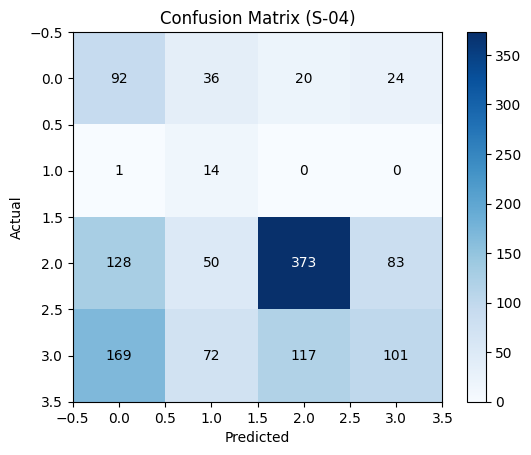

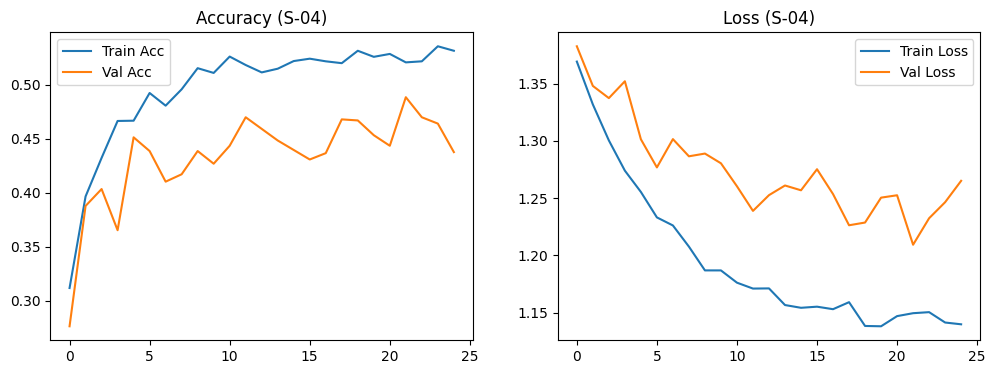

Eksperimen S-04 selesai.


MULAI EKSPERIMEN: S-05
Strategy: Freeze Semua | Optim: SGD | Sched: REDUCE_LR
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2722 | Val Acc: 0.3037 | Val Loss: 1.3793
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2793 | Val Acc: 0.3643 | Val Loss: 1.3680
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2883 | Val Acc: 0.3740 | Val Loss: 1.3639
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.3135 | Val Acc: 0.4053 | Val Loss: 1.3575
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.3374 | Val Acc: 0.4102 | Val Loss: 1.3544
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.3467 | Val Acc: 0.3896 | Val Loss: 1.3562
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.3535 | Val Acc: 0.4043 | Val Loss: 1.3541
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.3706 | Val Acc: 0.4102 | Val Loss: 1.3518
Epoch 09/25 | LR: 3.00e-05 | Train Acc: 0.3730 | Val Acc: 0.3906 | Val Loss: 1.3549
Epoch 10/25 | LR: 3.00e-05 | Train Acc: 0.3843 | Val Acc: 0.3955 | Val Loss: 1.3540
Epoch 11/25 | LR: 3.00e-05 | Train Acc: 0.4011 | Val Ac

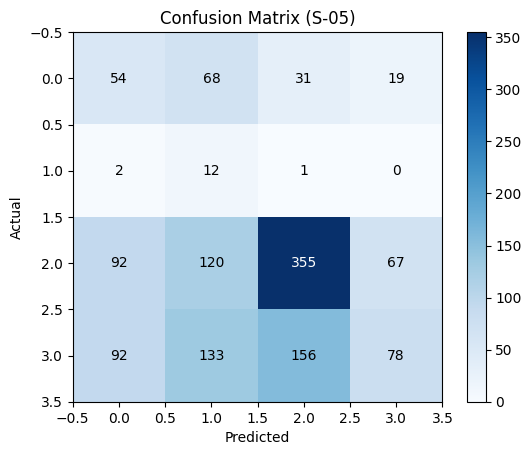

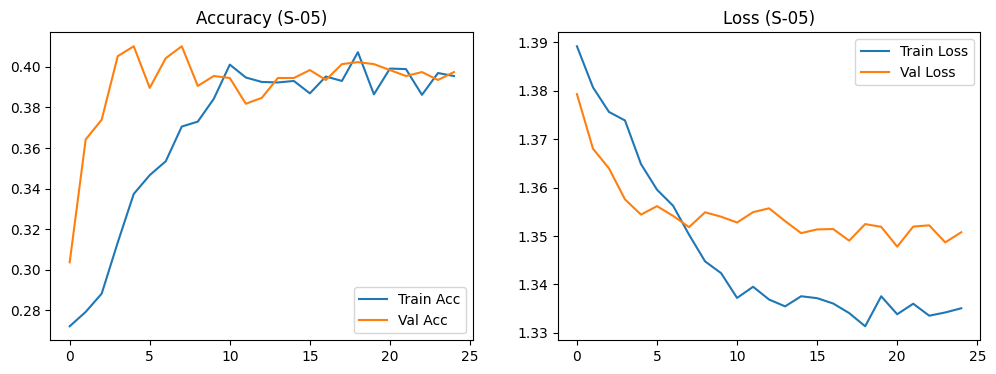

Eksperimen S-05 selesai.


MULAI EKSPERIMEN: S-06
Strategy: Freeze Semua | Optim: SGD | Sched: COSINE
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2485 | Val Acc: 0.1924 | Val Loss: 1.4035
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2871 | Val Acc: 0.2422 | Val Loss: 1.3904
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2849 | Val Acc: 0.2734 | Val Loss: 1.3823
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3203 | Val Acc: 0.2988 | Val Loss: 1.3769
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3330 | Val Acc: 0.3223 | Val Loss: 1.3731
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3469 | Val Acc: 0.3389 | Val Loss: 1.3692
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.3491 | Val Acc: 0.3223 | Val Loss: 1.3726
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.3633 | Val Acc: 0.3779 | Val Loss: 1.3608
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.3694 | Val Acc: 0.3486 | Val Loss: 1.3664
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.3792 | Val Acc: 0.4189 | Val Loss: 1.3539
Epoch 11/25 | LR: 5.94e-05 | Train Acc: 0.3733 | Val Acc: 

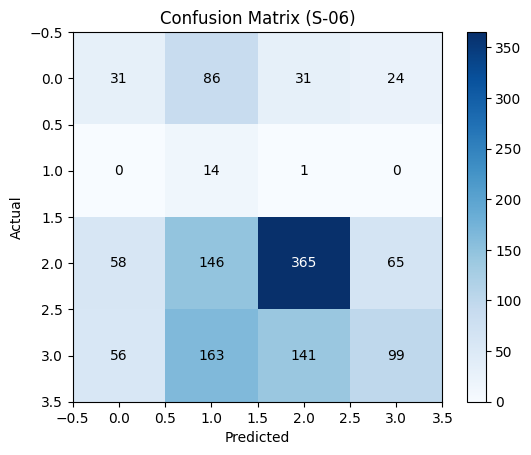

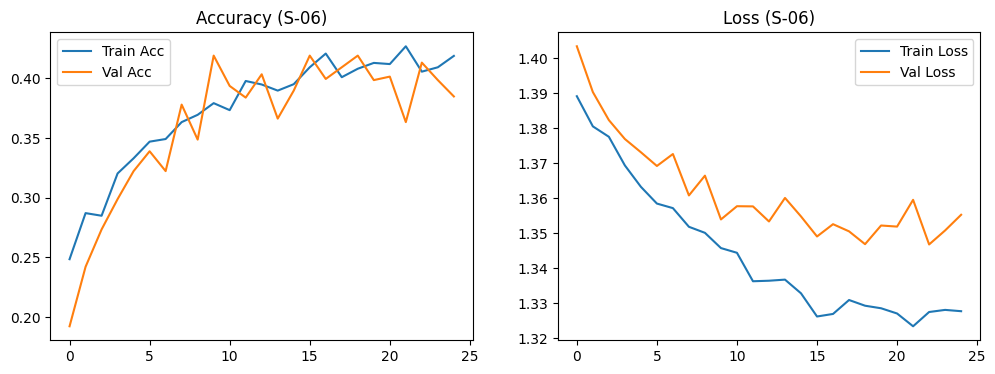

Eksperimen S-06 selesai.

Semua skenario Freeze Semua (S-03 s/d S-06) telah selesai dievaluasi.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Ingat: ColorJitter sudah dihapus
train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Instansiasi Dataset
train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# Data Loaders (Dikunci menggunakan Sampler)
train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Freeze Semua | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-01 sampai S-06 menggunakan "Freeze Semua"
    for param in model.parameters():
        param.requires_grad = False

    # Layer klasifikasi baru akan secara default requires_grad = True
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # ------------------ LOSS FUNCTION ------------------
    # Standard loss karena kita sudah menggunakan WeightedRandomSampler
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Eksekusi Scheduler
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING (Berdasarkan Val Loss)
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load best weights directly from RAM
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, indices in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-01 s/d S-06
# ==========================================

# run_experiment("S-01", optimizer_type="adam", scheduler_type="reduce_lr")
# run_experiment("S-02", optimizer_type="adam", scheduler_type="cosine")
# run_experiment("S-03", optimizer_type="adamw", scheduler_type="reduce_lr")
run_experiment("S-04", optimizer_type="adamw", scheduler_type="cosine")
run_experiment("S-05", optimizer_type="sgd", scheduler_type="reduce_lr")
run_experiment("S-06", optimizer_type="sgd", scheduler_type="cosine")

print("Semua skenario Freeze Semua (S-03 s/d S-06) telah selesai dievaluasi.")

Device: cuda
Loading dataset...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:124: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-07
Strategy: Unfreeze Layer Terakhir | Optim: ADAM | Sched: REDUCE_LR
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s]


Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5261 | Val Acc: 0.4902 | Val Loss: 1.0541
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6628 | Val Acc: 0.5928 | Val Loss: 0.8693
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6973 | Val Acc: 0.6494 | Val Loss: 0.7534
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7295 | Val Acc: 0.6387 | Val Loss: 0.8347
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7454 | Val Acc: 0.6357 | Val Loss: 0.9867
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.7705 | Val Acc: 0.6885 | Val Loss: 0.7099
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.7793 | Val Acc: 0.7100 | Val Loss: 0.6408
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7932 | Val Acc: 0.7578 | Val Loss: 0.5653
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.8162 | Val Acc: 0.7734 | Val Loss: 0.5436
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.8367 | Val Acc: 0.7197 | Val Loss: 0.6255
Epoch 11/25 | LR: 1.00e-04 | Train Acc: 0.8374 | Val Acc: 0.7881 | Val Loss: 0.5056
Epoch 12/25 | LR: 1.00e-04 | Train Ac

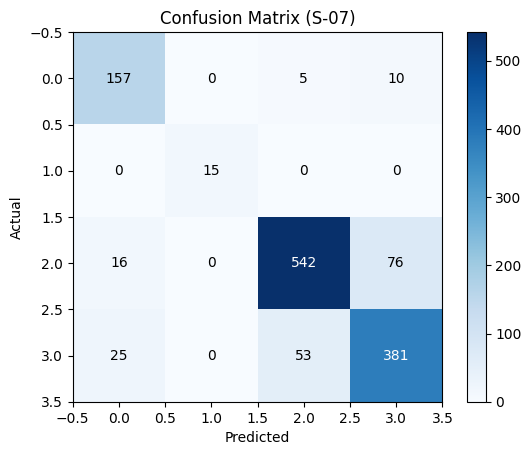

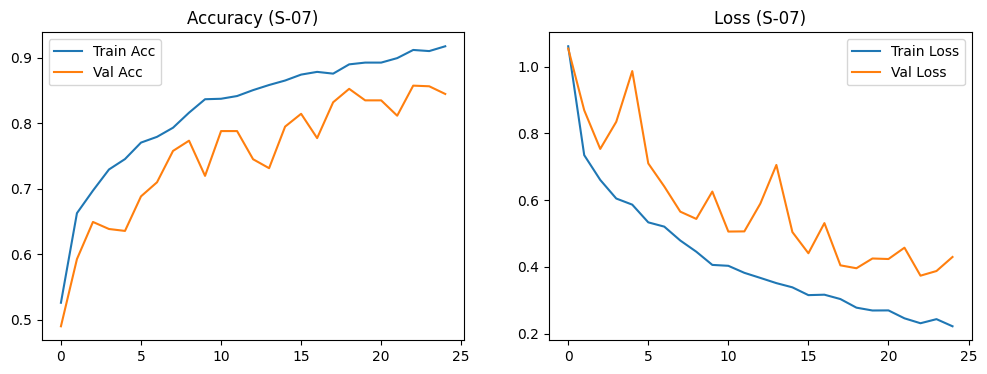

Eksperimen S-07 selesai.


MULAI EKSPERIMEN: S-08
Strategy: Unfreeze Layer Terakhir | Optim: ADAM | Sched: COSINE
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5356 | Val Acc: 0.5586 | Val Loss: 0.9088
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.6655 | Val Acc: 0.5527 | Val Loss: 0.9515
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7039 | Val Acc: 0.5996 | Val Loss: 0.8240
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7212 | Val Acc: 0.6367 | Val Loss: 0.7932
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7419 | Val Acc: 0.6650 | Val Loss: 0.7471
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.7800 | Val Acc: 0.6904 | Val Loss: 0.6731
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.7856 | Val Acc: 0.7119 | Val Loss: 0.6690
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8054 | Val Acc: 0.7236 | Val Loss: 0.6269
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.8052 | Val Acc: 0.7246 | Val Loss: 0.5906
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.8240 | Val Acc: 0.7812 | Val Loss: 0.5471
Epoch 1

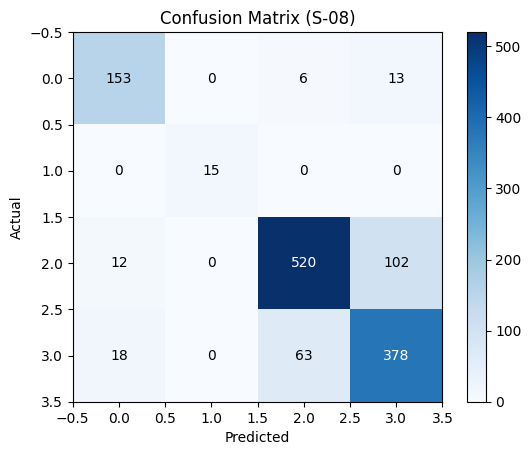

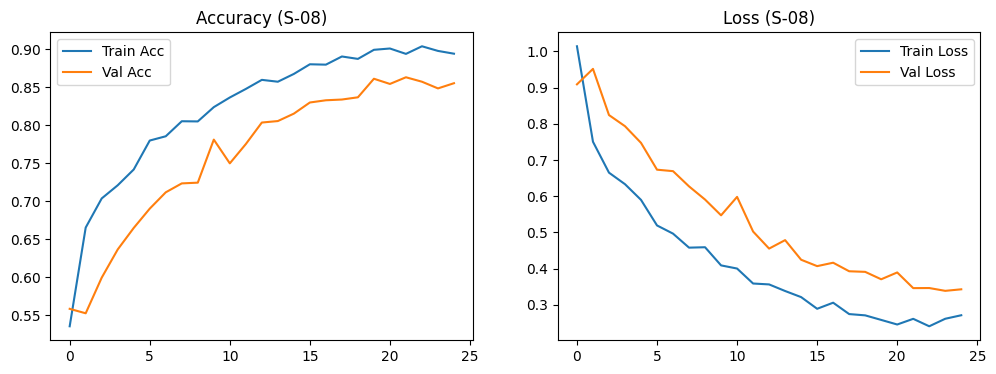

Eksperimen S-08 selesai.


MULAI EKSPERIMEN: S-09
Strategy: Unfreeze Layer Terakhir | Optim: ADAMW | Sched: REDUCE_LR
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5234 | Val Acc: 0.5410 | Val Loss: 0.9398
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6592 | Val Acc: 0.5811 | Val Loss: 0.9083
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6973 | Val Acc: 0.6592 | Val Loss: 0.7273
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7295 | Val Acc: 0.6465 | Val Loss: 0.8102
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7461 | Val Acc: 0.6846 | Val Loss: 0.6886
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.7622 | Val Acc: 0.7031 | Val Loss: 0.6494
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.7798 | Val Acc: 0.6973 | Val Loss: 0.7277
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7959 | Val Acc: 0.7256 | Val Loss: 0.6623
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.8169 | Val Acc: 0.7607 | Val Loss: 0.5545
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.8252 | Val Acc: 0.7783 | Val Loss: 0.5241
Epo

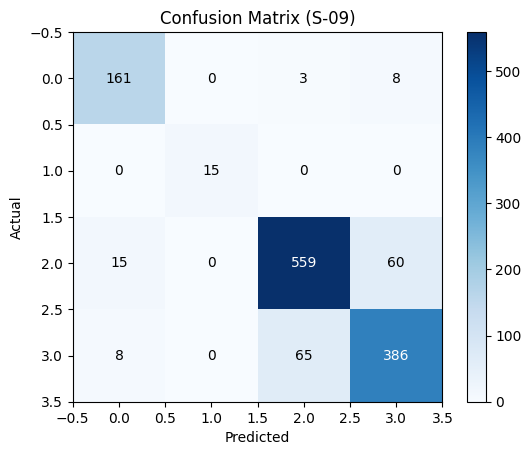

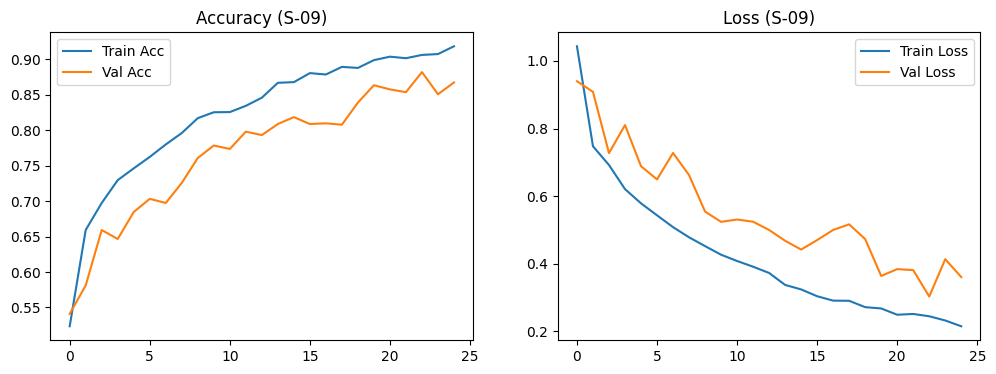

Eksperimen S-09 selesai.

Semua skenario Unfreeze Layer Terakhir (S-07 s/d S-12) telah selesai dievaluasi.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Unfreeze Layer Terakhir | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-07 sampai S-12 menggunakan "Unfreeze Layer Terakhir"
    for param in model.parameters():
        param.requires_grad = False

    # Buka layer4 (Layer Konvolusi Terakhir)
    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']
        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-07 s/d S-12
# ==========================================

run_experiment("S-07", optimizer_type="adam", scheduler_type="reduce_lr")
run_experiment("S-08", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-09", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-10", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-11", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-12", optimizer_type="sgd", scheduler_type="cosine")

print("Semua skenario Unfreeze Layer Terakhir (S-07 s/d S-12) telah selesai dievaluasi.")


MULAI EKSPERIMEN: S-10
Strategy: Unfreeze Layer Terakhir | Optim: ADAMW | Sched: COSINE
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5129 | Val Acc: 0.5312 | Val Loss: 0.9400
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.6633 | Val Acc: 0.6006 | Val Loss: 0.8127
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7058 | Val Acc: 0.6318 | Val Loss: 0.8524
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7273 | Val Acc: 0.5996 | Val Loss: 0.8627
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7454 | Val Acc: 0.6592 | Val Loss: 0.7922
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.7561 | Val Acc: 0.6670 | Val Loss: 0.7658
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.7805 | Val Acc: 0.6943 | Val Loss: 0.6626
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8091 | Val Acc: 0.7305 | Val Loss: 0.6146
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.8152 | Val Acc: 0.7295 | Val Loss: 0.6260
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.8198 | Val Acc: 0.7627 | Val Loss: 0.5607
Epoch 11/25 | LR: 5.94e-05 | Tra

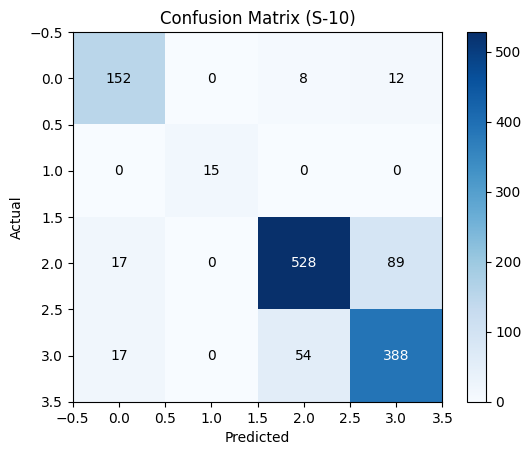

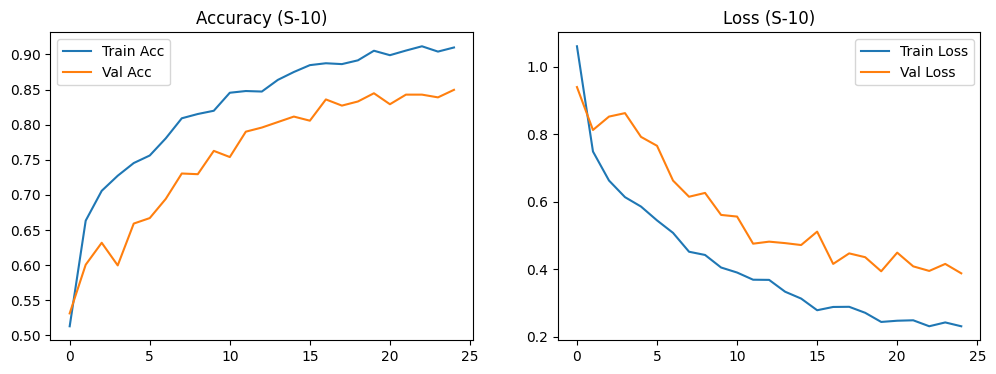

Eksperimen S-10 selesai.


MULAI EKSPERIMEN: S-11
Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: REDUCE_LR
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2615 | Val Acc: 0.2471 | Val Loss: 1.3937
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2786 | Val Acc: 0.2559 | Val Loss: 1.3883
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2900 | Val Acc: 0.2939 | Val Loss: 1.3805
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.2891 | Val Acc: 0.2695 | Val Loss: 1.3841
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.3174 | Val Acc: 0.2695 | Val Loss: 1.3864
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.3286 | Val Acc: 0.3271 | Val Loss: 1.3736
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.3230 | Val Acc: 0.3428 | Val Loss: 1.3677
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.3420 | Val Acc: 0.3545 | Val Loss: 1.3648
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.3521 | Val Acc: 0.3350 | Val Loss: 1.3674
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.3606 | Val Acc: 0.3076 | Val Loss: 1.3751
Epoch

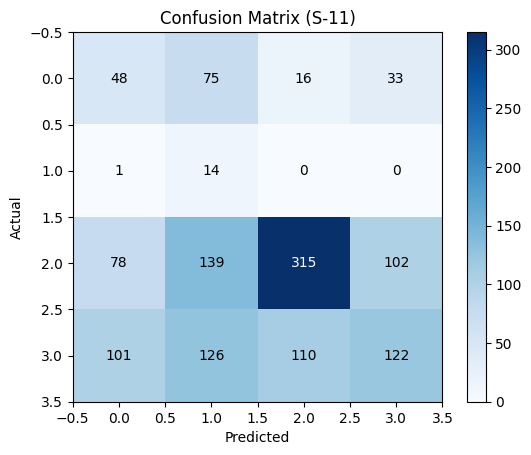

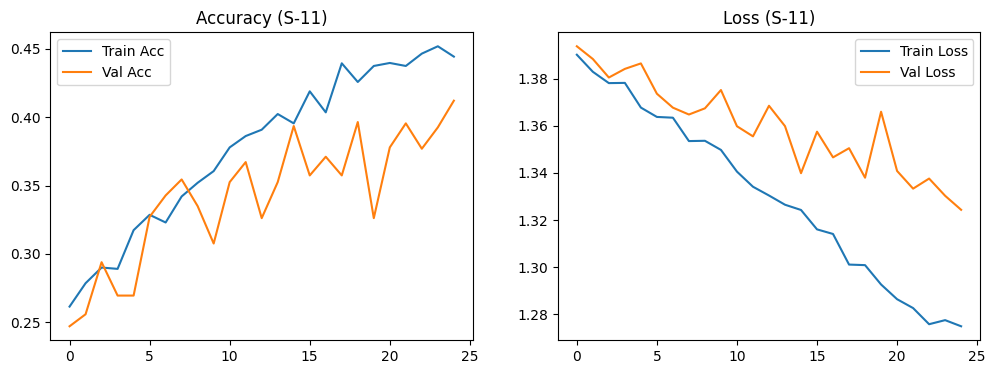

Eksperimen S-11 selesai.


MULAI EKSPERIMEN: S-12
Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: COSINE
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2664 | Val Acc: 0.3613 | Val Loss: 1.3627
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2595 | Val Acc: 0.3887 | Val Loss: 1.3604
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2864 | Val Acc: 0.3604 | Val Loss: 1.3681
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3157 | Val Acc: 0.3574 | Val Loss: 1.3694
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3242 | Val Acc: 0.3076 | Val Loss: 1.3775
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3289 | Val Acc: 0.3174 | Val Loss: 1.3758
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.3557 | Val Acc: 0.3643 | Val Loss: 1.3639
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.3367 | Val Acc: 0.2861 | Val Loss: 1.3787
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.3596 | Val Acc: 0.2920 | Val Loss: 1.3784
Early stopping at epoch 9!

--- FINAL TEST (S-12) ---
              precision    recall  f1-

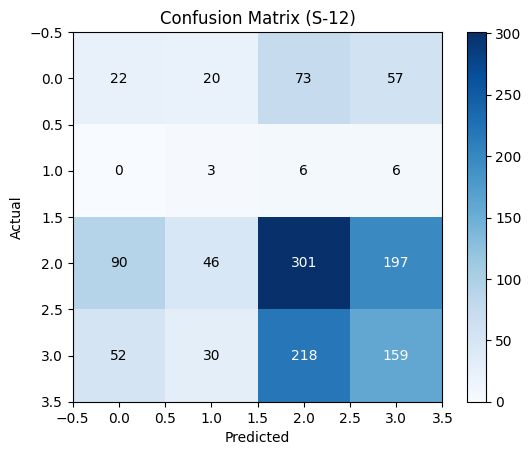

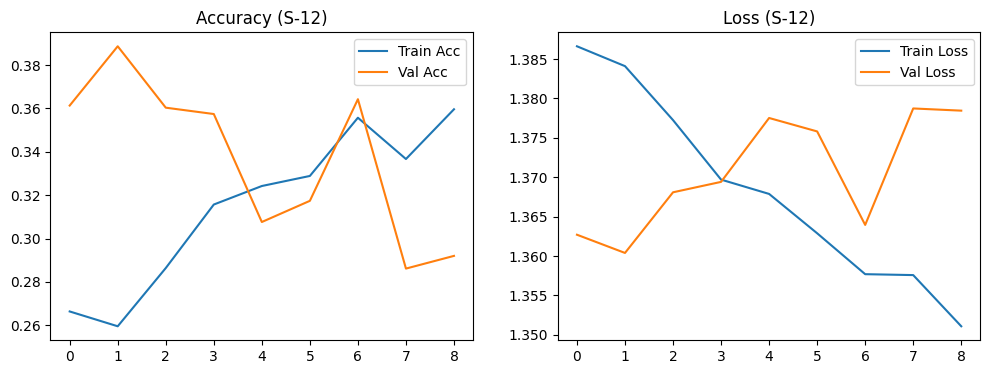

Eksperimen S-12 selesai.



In [ ]:
run_experiment("S-10", optimizer_type="adamw", scheduler_type="cosine")
run_experiment("S-11", optimizer_type="sgd", scheduler_type="reduce_lr")
run_experiment("S-12", optimizer_type="sgd", scheduler_type="cosine")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-13
Strategy: Full Tuning | Optim: ADAM | Sched: REDUCE_LR
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5728 | Val Acc: 0.4346 | Val Loss: 1.1840
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.7258 | Val Acc: 0.5889 | Val Loss: 0.8776
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.7849 | Val Acc: 0.6914 | Val Loss: 0.8079
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.8381 | Val Acc: 0.6533 | Val Loss: 0.8353
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.8616 | Val Acc: 0.8027 | Val Loss: 0.4864
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8853 | Val Acc: 0.8164 | Val Loss: 0.4863
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.9006 | Val Acc: 0.8672 | Val Loss: 0.3032
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.9165 | Val Acc: 0.8867 | Val Loss: 0.2931
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9280 | Val Acc: 0.8516 | Val Loss: 0.4049
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.9399 | Val Acc:

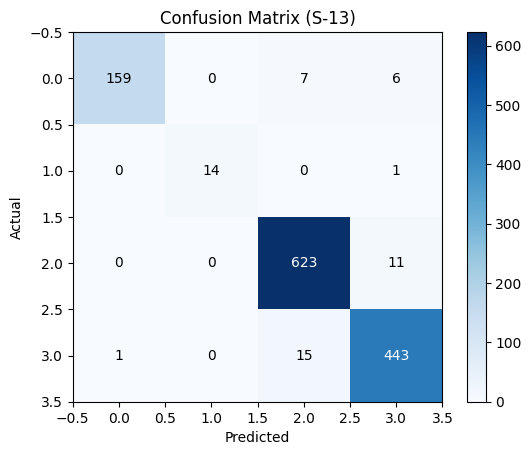

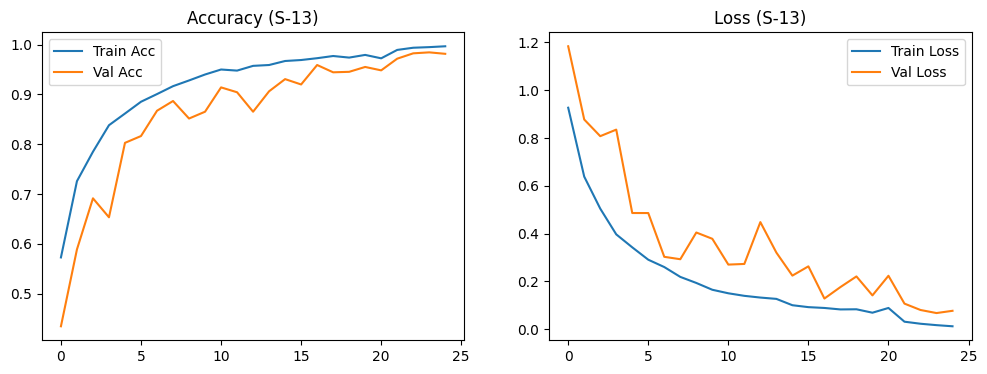

Eksperimen S-13 selesai.


MULAI EKSPERIMEN: S-14
Strategy: Full Tuning | Optim: ADAM | Sched: COSINE
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5894 | Val Acc: 0.6279 | Val Loss: 0.7768
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.7305 | Val Acc: 0.6836 | Val Loss: 0.7197
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.8000 | Val Acc: 0.7363 | Val Loss: 0.5955
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.8408 | Val Acc: 0.7734 | Val Loss: 0.5237
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.8687 | Val Acc: 0.7588 | Val Loss: 0.7170
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8994 | Val Acc: 0.8330 | Val Loss: 0.5060
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.9189 | Val Acc: 0.8613 | Val Loss: 0.3791
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.9397 | Val Acc: 0.8574 | Val Loss: 0.4411
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9380 | Val Acc: 0.9121 | Val Loss: 0.2236
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.9556 | Val Acc: 0.8867 | Val Loss: 0.3318
Epoch 11/25 | LR: 5

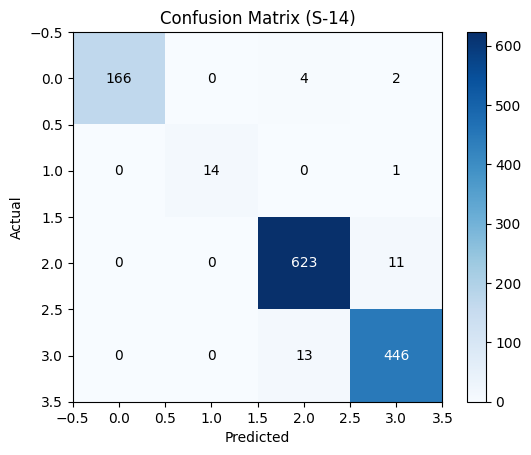

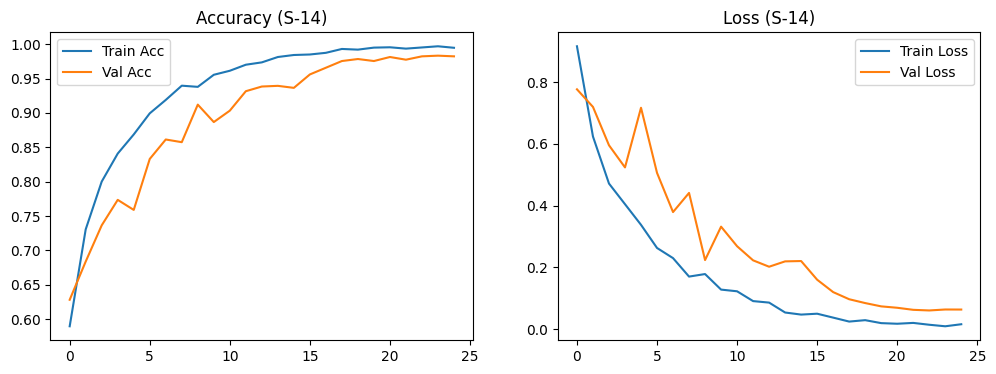

Eksperimen S-14 selesai.

Semua skenario Full Tuning (S-13 s/d S-18) telah selesai dievaluasi.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-13 sampai S-18 menggunakan "Full Tuning"
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']
        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-13 s/d S-18
# ==========================================

run_experiment("S-13", optimizer_type="adam", scheduler_type="reduce_lr")
run_experiment("S-14", optimizer_type="adam", scheduler_type="cosine")
# run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-16", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

print("Semua skenario Full Tuning (S-13 s/d S-18) telah selesai dievaluasi.")

Device: cuda
Loading dataset...


data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-15
Strategy: Full Tuning | Optim: ADAMW | Sched: REDUCE_LR
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 188MB/s]


Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5774 | Val Acc: 0.5273 | Val Loss: 1.0097
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.7249 | Val Acc: 0.5469 | Val Loss: 1.1223
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.7932 | Val Acc: 0.6982 | Val Loss: 0.7126
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.8301 | Val Acc: 0.7412 | Val Loss: 0.6021
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.8591 | Val Acc: 0.7861 | Val Loss: 0.5315
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8850 | Val Acc: 0.7686 | Val Loss: 0.6959
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.9048 | Val Acc: 0.8633 | Val Loss: 0.4427
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.9160 | Val Acc: 0.8457 | Val Loss: 0.4720
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9275 | Val Acc: 0.8613 | Val Loss: 0.3661
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.9429 | Val Acc: 0.8691 | Val Loss: 0.4538
Epoch 11/25 | LR: 1.00e-04 | Train Acc: 0.9465 | Val Acc: 0.8828 | Val Loss: 0.3662
Epoch 12/25 | LR: 1.00e-04 | Train Ac

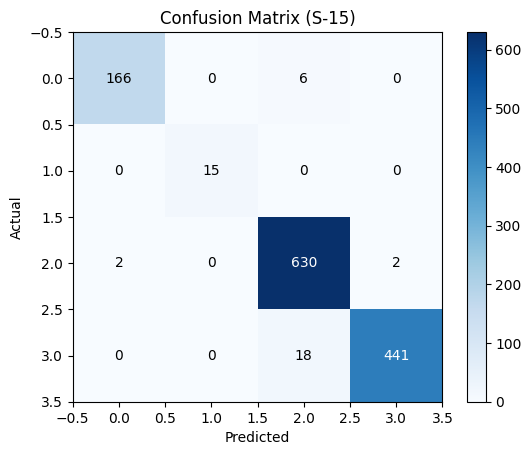

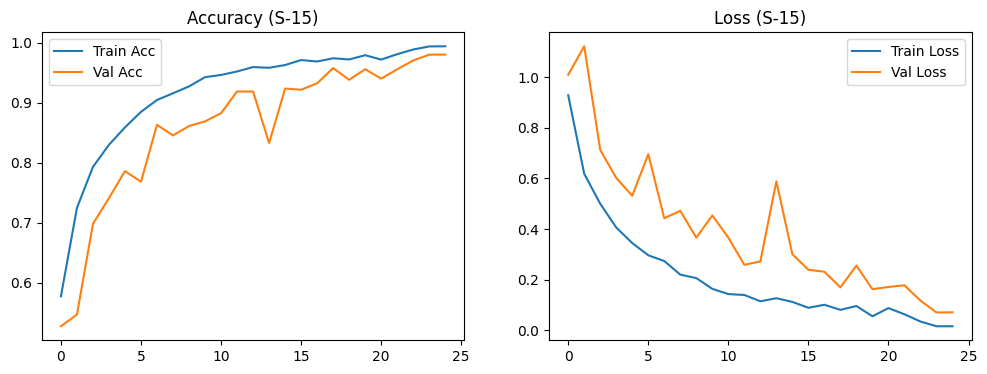

Eksperimen S-15 selesai.


MULAI EKSPERIMEN: S-16
Strategy: Full Tuning | Optim: ADAMW | Sched: COSINE
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5820 | Val Acc: 0.6152 | Val Loss: 0.7727
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.7173 | Val Acc: 0.6406 | Val Loss: 0.7870
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7825 | Val Acc: 0.7158 | Val Loss: 0.6297
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.8298 | Val Acc: 0.7812 | Val Loss: 0.4929
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.8599 | Val Acc: 0.8301 | Val Loss: 0.3927
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8970 | Val Acc: 0.8135 | Val Loss: 0.5263
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.9111 | Val Acc: 0.8271 | Val Loss: 0.5192
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.9392 | Val Acc: 0.8662 | Val Loss: 0.4076
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9309 | Val Acc: 0.9053 | Val Loss: 0.2614
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.9536 | Val Acc: 0.9160 | Val Loss: 0.2395
Epoch 11/25 | LR: 

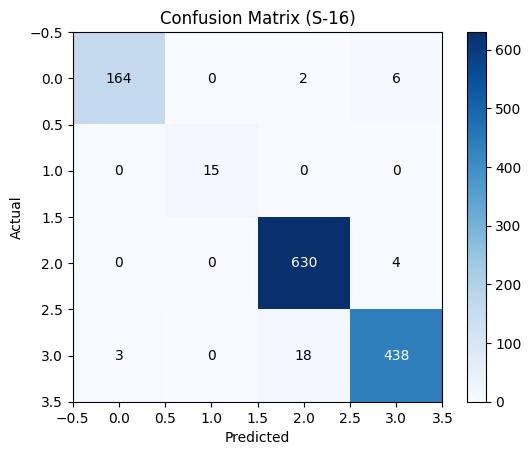

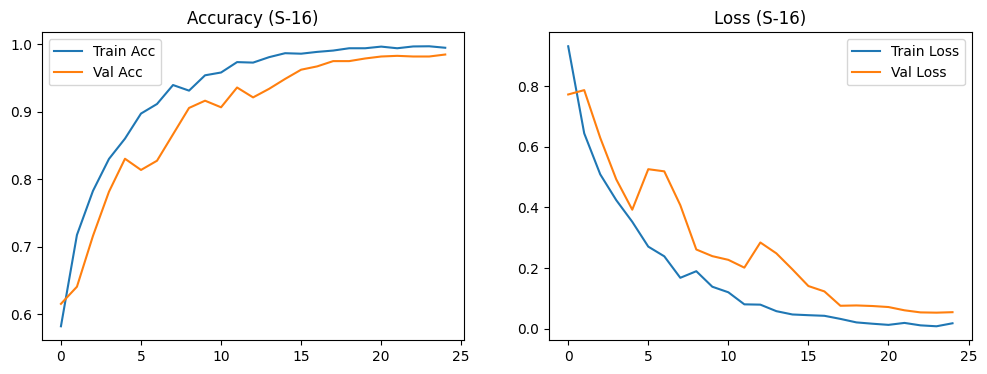

Eksperimen S-16 selesai.

Semua skenario Full Tuning (S-13 s/d S-18) telah selesai dievaluasi.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-13 sampai S-18 menggunakan "Full Tuning"
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']
        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-13 s/d S-18
# ==========================================

# run_experiment("S-13", optimizer_type="adam", scheduler_type="reduce_lr")
# run_experiment("S-14", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")
run_experiment("S-16", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

print("Semua skenario Full Tuning (S-13 s/d S-18) telah selesai dievaluasi.")


MULAI EKSPERIMEN: S-17
Strategy: Full Tuning | Optim: SGD | Sched: REDUCE_LR
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2471 | Val Acc: 0.2520 | Val Loss: 1.3921
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2656 | Val Acc: 0.2061 | Val Loss: 1.3934
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2605 | Val Acc: 0.1895 | Val Loss: 1.4121
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.2622 | Val Acc: 0.1982 | Val Loss: 1.4019
Epoch 05/25 | LR: 3.00e-05 | Train Acc: 0.2656 | Val Acc: 0.1992 | Val Loss: 1.4023
Epoch 06/25 | LR: 3.00e-05 | Train Acc: 0.2668 | Val Acc: 0.1934 | Val Loss: 1.3978
Epoch 07/25 | LR: 3.00e-05 | Train Acc: 0.2644 | Val Acc: 0.2061 | Val Loss: 1.3957
Epoch 08/25 | LR: 3.00e-05 | Train Acc: 0.2722 | Val Acc: 0.1836 | Val Loss: 1.3947
Early stopping at epoch 8!

--- FINAL TEST (S-17) ---
              precision    recall  f1-score   support

           0       0.12      0.38      0.18       172
           1       0.02      0.20      0.04     

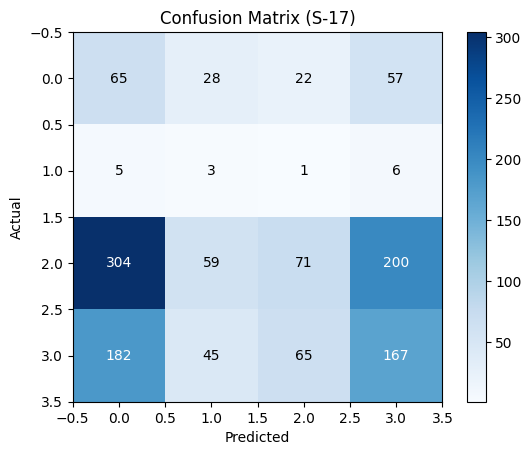

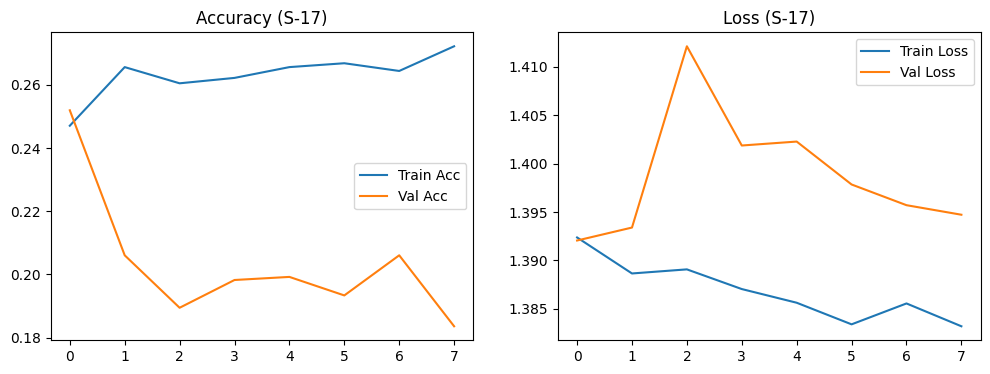

Eksperimen S-17 selesai.


MULAI EKSPERIMEN: S-18
Strategy: Full Tuning | Optim: SGD | Sched: COSINE
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2502 | Val Acc: 0.0996 | Val Loss: 1.4352
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2598 | Val Acc: 0.1045 | Val Loss: 1.4342
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2683 | Val Acc: 0.1182 | Val Loss: 1.4217
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.2659 | Val Acc: 0.1328 | Val Loss: 1.4158
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.2693 | Val Acc: 0.0166 | Val Loss: 1.4643
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.2800 | Val Acc: 0.1484 | Val Loss: 1.4134
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.2898 | Val Acc: 0.1201 | Val Loss: 1.4118
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.2844 | Val Acc: 0.1982 | Val Loss: 1.3984
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.2820 | Val Acc: 0.2129 | Val Loss: 1.3927
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.2871 | Val Acc: 0.2373 | Val Loss: 1.3898
Epoch 11/25 | LR: 5.

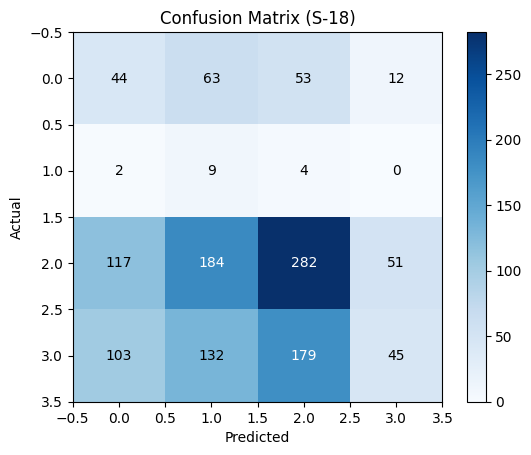

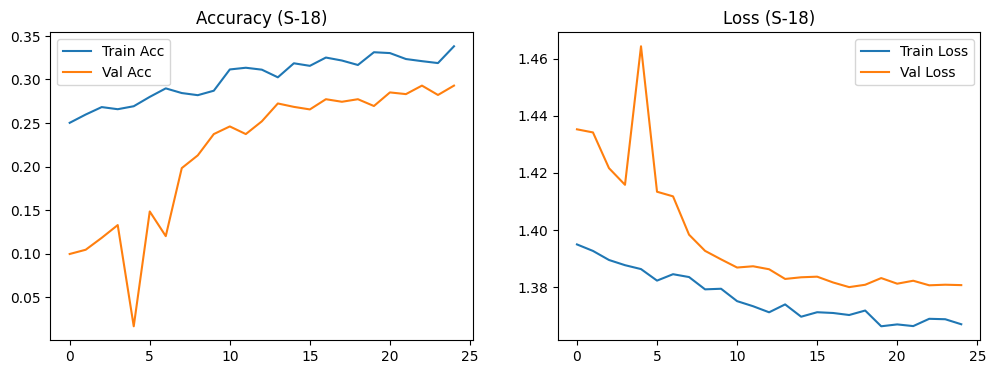

Eksperimen S-18 selesai.



In [ ]:
run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

# Weighted Random (Saved Mpdel)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All_Sampler
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-01
🛠️  Strategy: Freeze Semua | Optim: ADAM | Sched: REDUCE_LR

📊 INFORMASI LAYER (FREEZE SEMUA):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3118 | Val Acc: 0.2764 | Val Loss: 1.3826 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3965 | Val Acc: 0.3887 | Val Loss: 1.3478 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4321 | Val Acc: 0.4033 | Val Loss: 1.3370 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4678 | Val Acc: 0.3662 | Val Loss: 1.3515 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4683 

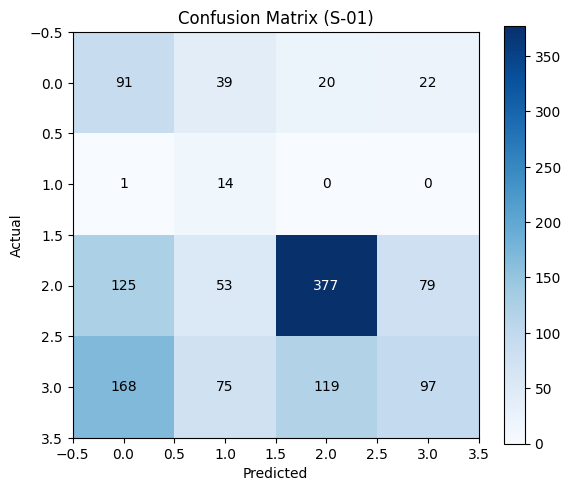

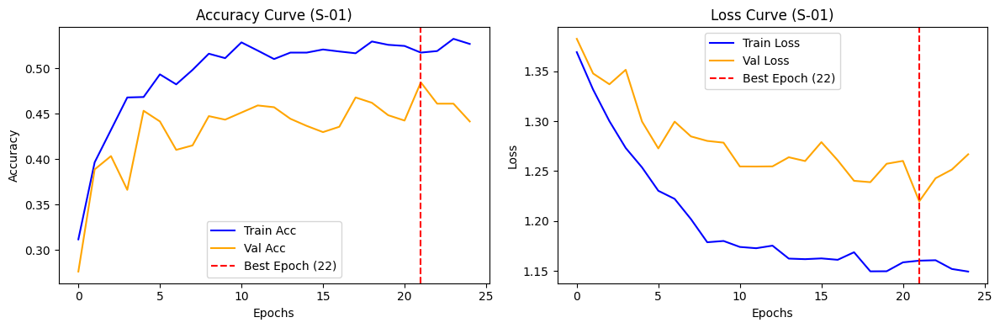

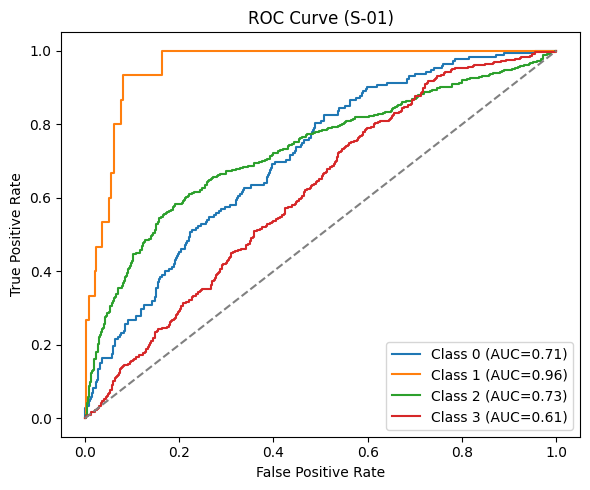

✅ Seluruh plot informatif untuk S-01 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-02
🛠️  Strategy: Freeze Semua | Optim: ADAM | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.3201 | Val Acc: 0.4004 | Val Loss: 1.3431 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3972 | Val Acc: 0.3877 | Val Loss: 1.3305 
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4385 | Val Acc: 0.4463 | Val Loss: 1.3032 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4412 | Val Acc: 0.4336 | Val Loss: 1.2968 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4763 | Val Acc: 0.4355 | Val Loss: 1.2912 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4978 | Val Acc: 0.4434 | Val Loss: 1.2901 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4946 | Val Acc: 0.4521 | Val Loss: 1.2760 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.4983 | Val Acc: 0.4463 | Val Loss: 1.2783 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.5017 | Val Acc: 0.4258 | Val Loss: 1.2805 
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.5120

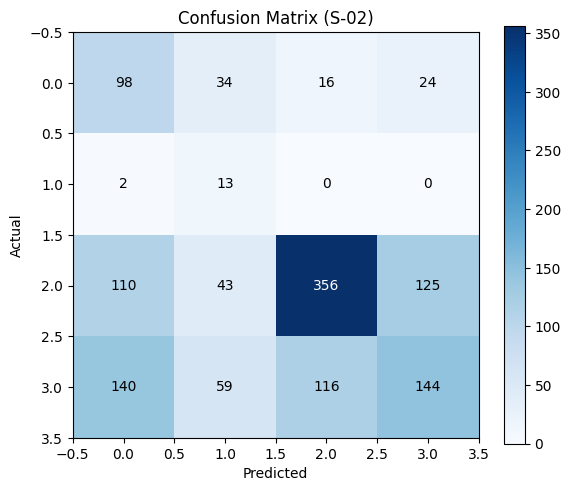

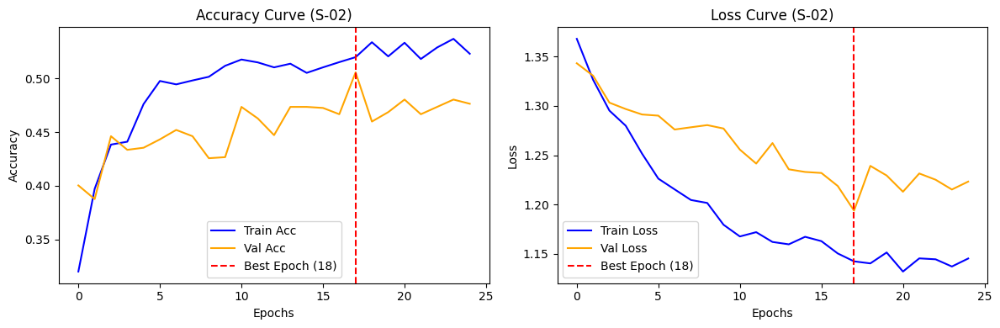

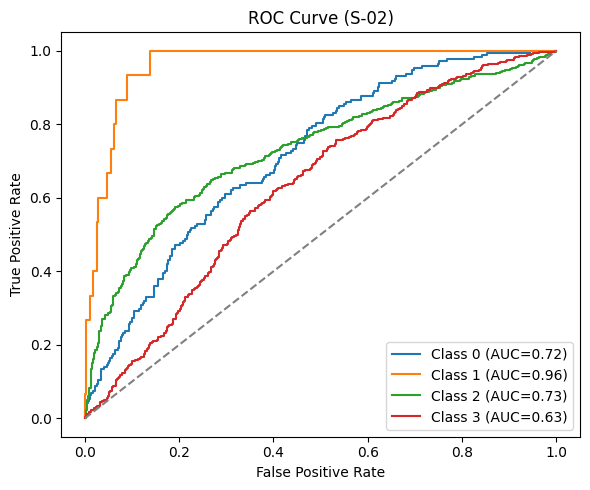

✅ Seluruh plot informatif untuk S-02 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-03
🛠️  Strategy: Freeze Semua | Optim: ADAMW | Sched: REDUCE_LR

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.3062 | Val Acc: 0.1660 | Val Loss: 1.4071 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.3987 | Val Acc: 0.4092 | Val Loss: 1.3446 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4302 | Val Acc: 0.4092 | Val Loss: 1.3300 
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4719 | Val Acc: 0.4053 | Val Loss: 1.3243 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4734 | Val Acc: 0.4062 | Val Loss: 1.3210 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.4841 | Val Acc: 0.4268 | Val Loss: 1.2949 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.4875 | Val Acc: 0.4053 | Val Loss: 1.3037 
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.4949 | Val Acc: 0.4355 | Val Loss: 1.2684 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.5020 | Val Acc: 0.4521 | Val Loss: 1.2722 ⭐ (Best)
Epoch 10/25 | LR: 1.00e-04

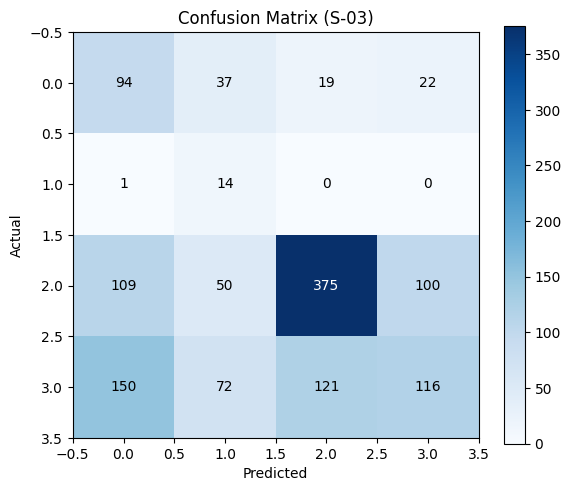

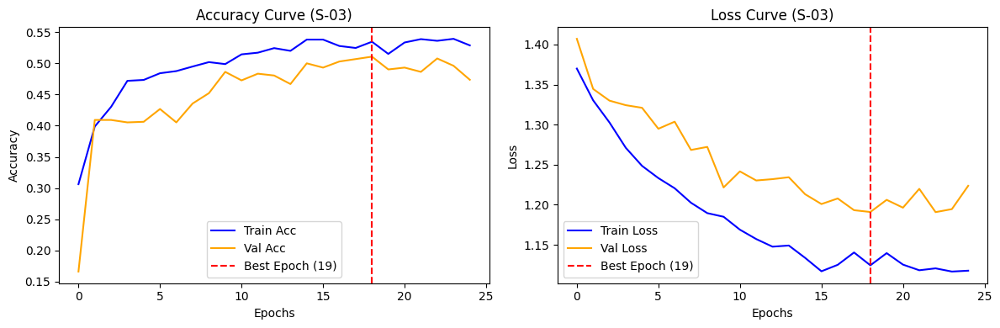

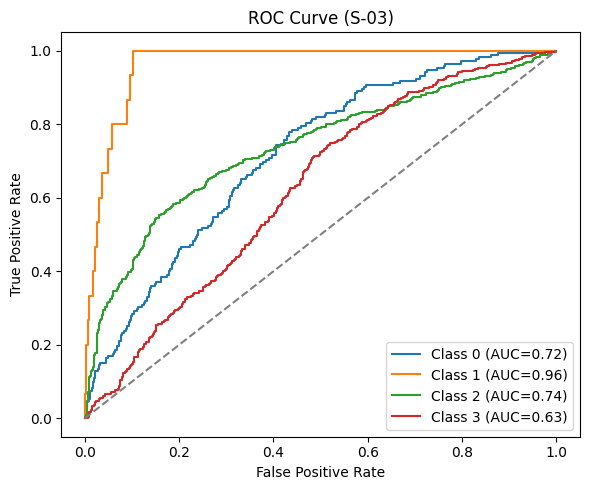

✅ Seluruh plot informatif untuk S-03 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-04
🛠️  Strategy: Freeze Semua | Optim: ADAMW | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2998 | Val Acc: 0.3672 | Val Loss: 1.3665 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.3850 | Val Acc: 0.4199 | Val Loss: 1.3364 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.4336 | Val Acc: 0.3877 | Val Loss: 1.3413 
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.4602 | Val Acc: 0.4072 | Val Loss: 1.3137 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.4551 | Val Acc: 0.4287 | Val Loss: 1.3044 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.4578 | Val Acc: 0.4453 | Val Loss: 1.2702 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.4924 | Val Acc: 0.4307 | Val Loss: 1.2880 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.5037 | Val Acc: 0.4609 | Val Loss: 1.2684 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.4990 | Val Acc: 0.4902 | Val Loss: 1.2394 ⭐ (Best)
Epoch 10/25 | LR: 6.5

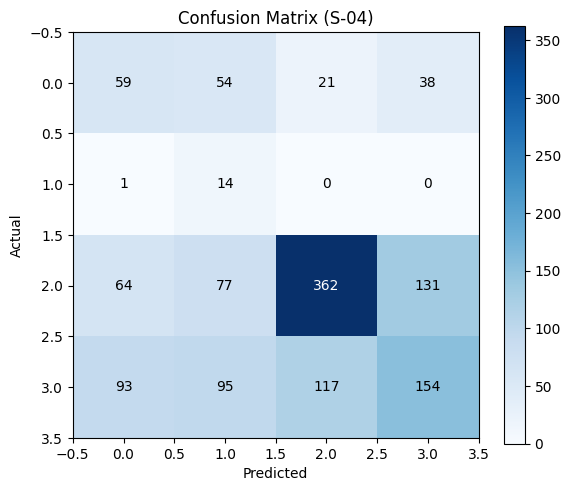

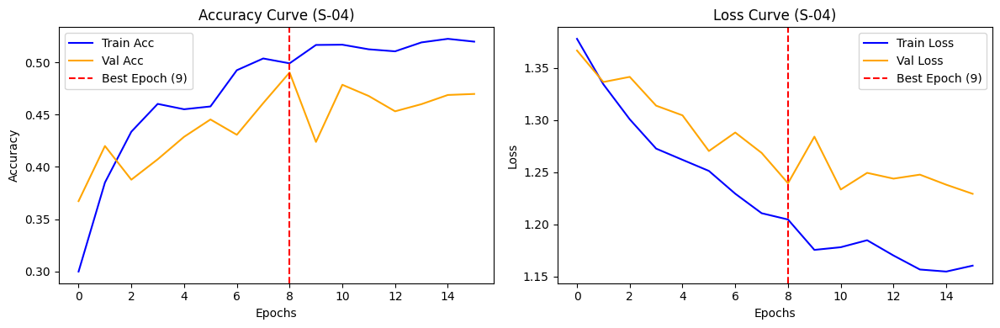

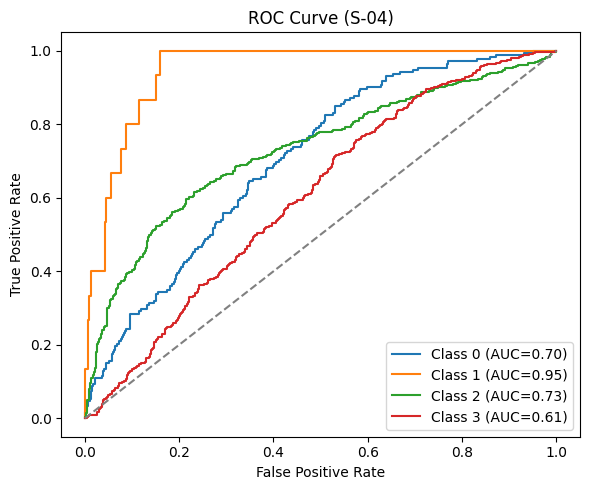

✅ Seluruh plot informatif untuk S-04 berhasil ditampilkan.


🎉 BATCH FASE 1 (S-01 hingga S-06) DENGAN SAMPLER SELESAI DIEKSEKUSI!


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All_Sampler'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_freeze_all_sampler'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
# Menghitung bobot untuk setiap sampel agar kelas minoritas sering terambil
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# Data Loaders (Dikunci menggunakan Sampler, sehingga shuffle WAJIB False)
train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer dicetak sekali saja
info_printed = False

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: FREEZE SEMUA PARAMETER FEATURE EXTRACTOR
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FREEZE SEMUA):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS FUNCTION ------------------
    # Standard loss karena kita sudah menggunakan WeightedRandomSampler
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER & SCHEDULER ------------------
    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    ("S-01", "adam", "reduce_lr"),
    ("S-02", "adam", "cosine"),
    ("S-03", "adamw", "reduce_lr"),
    ("S-04", "adamw", "cosine"),
    # ("S-05", "sgd", "reduce_lr"),
    # ("S-06", "sgd", "cosine"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) DENGAN SAMPLER SELESAI DIEKSEKUSI!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All_Sampler
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-05
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: REDUCE_LR

📊 INFORMASI LAYER (FREEZE SEMUA):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 23,508,032 (99.97%)
   - Trainable Parameter: 8,196 (0.03%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2644 | Val Acc: 0.2559 | Val Loss: 1.3889 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2849 | Val Acc: 0.2910 | Val Loss: 1.3823 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.3049 | Val Acc: 0.3291 | Val Loss: 1.3741 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.3215 | Val Acc: 0.3262 | Val Loss: 1.3779 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.3335 |

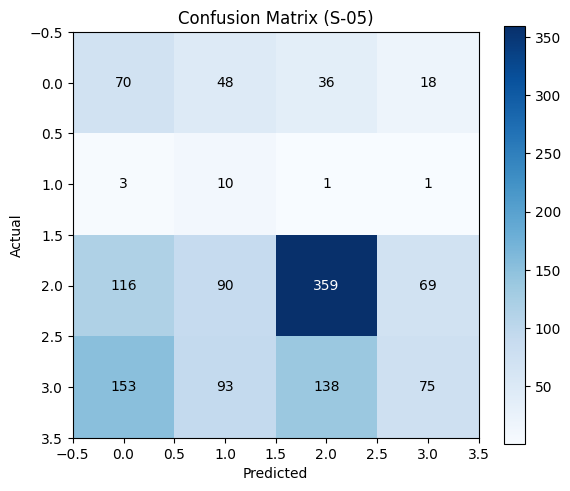

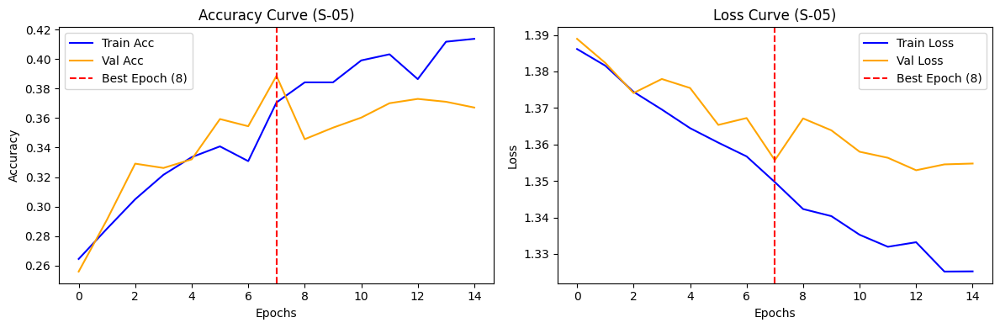

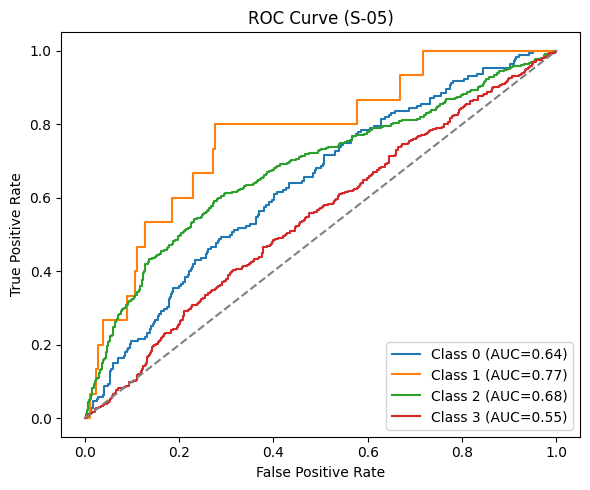

✅ Seluruh plot informatif untuk S-05 berhasil ditampilkan.

🚀 MULAI EKSPERIMEN: S-06
🛠️  Strategy: Freeze Semua | Optim: SGD | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2561 | Val Acc: 0.3320 | Val Loss: 1.3702 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2751 | Val Acc: 0.3301 | Val Loss: 1.3725 
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2908 | Val Acc: 0.2881 | Val Loss: 1.3798 
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3049 | Val Acc: 0.3086 | Val Loss: 1.3778 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3169 | Val Acc: 0.2656 | Val Loss: 1.3864 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3123 | Val Acc: 0.3271 | Val Loss: 1.3746 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.3296 | Val Acc: 0.3408 | Val Loss: 1.3724 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.3413 | Val Acc: 0.3037 | Val Loss: 1.3786 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.3523 | Val Acc: 0.3086 | Val Loss: 1.3774 
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.3792 | Val Ac

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Freeze_All_Sampler'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_freeze_all_sampler'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

# Kunci total randomness (Deterministik)
torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
# Menghitung bobot untuk setiap sampel agar kelas minoritas sering terambil
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS & TRANSFORMS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]
        if self.transform:
            image = self.transform(image)
        return image, label, idx

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# Data Loaders (Dikunci menggunakan Sampler, sehingga shuffle WAJIB False)
train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# Tracker agar info layer dicetak sekali saja
info_printed = False

# ==========================================
# 5. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name}")
    print(f"🛠️  Strategy: Freeze Semua | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # KUNCI 1: FREEZE SEMUA PARAMETER FEATURE EXTRACTOR
    for param in model.parameters():
        param.requires_grad = False

    # Ganti Classifier Layer (Otomatis requires_grad = True)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FREEZE SEMUA):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS FUNCTION ------------------
    # Standard loss karena kita sudah menggunakan WeightedRandomSampler
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER & SCHEDULER ------------------
    trainable_params_ref = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params_ref, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params_ref, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params_ref, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)

    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.3)
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=CONFIG["epochs"])

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist, train_loss_hist, val_loss_hist = [], [], [], []

    best_model = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # SCHEDULER
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr = optimizer.param_groups[0]['lr']

        mark = ""
        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Acc: {best_acc:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING INFORMATIF (Pure Output) ------------------
    # 1. Confusion Matrix
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"✅ Seluruh plot informatif untuk {scenario_name} berhasil ditampilkan.")

# ==========================================
# 6. EKSEKUSI SKENARIO (S-01 s/d S-06)
# ==========================================

scenarios = [
    # ("S-01", "adam", "reduce_lr"),
    # ("S-02", "adam", "cosine"),
    # ("S-03", "adamw", "reduce_lr"),
    # ("S-04", "adamw", "cosine"),
    ("S-05", "sgd", "reduce_lr"),
    ("S-06", "sgd", "cosine"),
]

for s_name, optim_type, sched_type in scenarios:
    run_experiment(s_name, optim_type, sched_type)

print("\n\n🎉 BATCH FASE 1 (S-01 hingga S-06) DENGAN SAMPLER SELESAI DIEKSEKUSI!")

Mounted at /content/drive
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer_Sampler
Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-07
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: ADAM | Sched: REDUCE_LR
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 131MB/s]


Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5298 | Val Acc: 0.4941 | Val Loss: 1.0369 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6562 | Val Acc: 0.6064 | Val Loss: 0.8712 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.7036 | Val Acc: 0.6426 | Val Loss: 0.7730 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7400 | Val Acc: 0.6367 | Val Loss: 0.8409 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7473 | Val Acc: 0.6416 | Val Loss: 0.9251 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.7720 | Val Acc: 0.6592 | Val Loss: 0.7909 
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.7744 | Val Acc: 0.7002 | Val Loss: 0.6624 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7876 | Val Acc: 0.7539 | Val Loss: 0.6035 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.8176 | Val Acc: 0.7490 | Val Loss: 0.5868 ⭐ (Best)
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.8289 | Val Acc: 0.7275 | Val Loss: 0.6189 
Epoch 11/25 | LR: 1.00e-04 | Train Acc: 

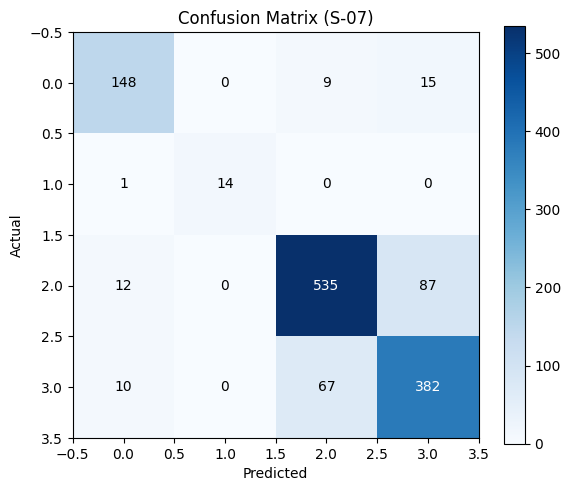

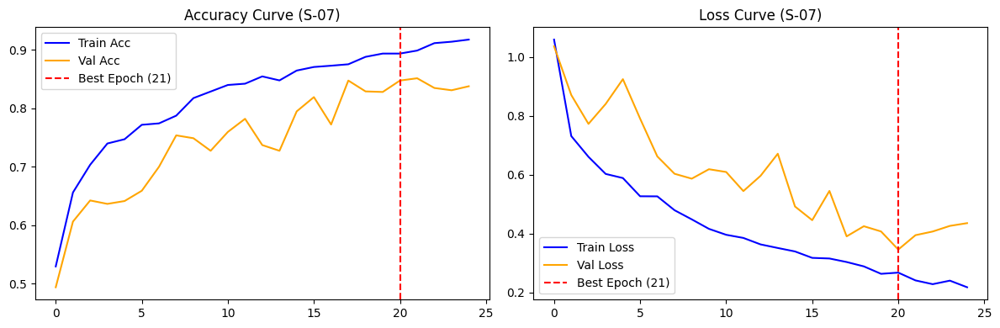

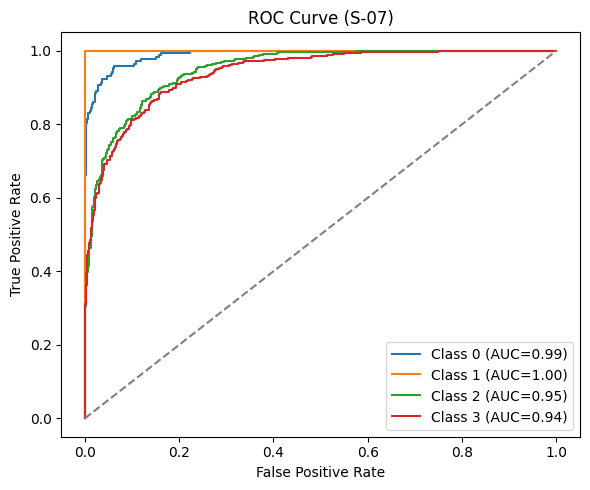

Eksperimen S-07 selesai.


🚀 MULAI EKSPERIMEN: S-08
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: ADAM | Sched: COSINE
Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5356 | Val Acc: 0.5635 | Val Loss: 0.9080 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.6660 | Val Acc: 0.5576 | Val Loss: 0.9482 
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7129 | Val Acc: 0.5830 | Val Loss: 0.8594 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7234 | Val Acc: 0.6367 | Val Loss: 0.7972 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7473 | Val Acc: 0.6572 | Val Loss: 0.7943 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.7798 | Val Acc: 0.7021 | Val Loss: 0.6575 ⭐ (Best)
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.7905 | Val Acc: 0.6982 | Val Loss: 0.6849 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8076 | Val Acc: 0.7373 | Val Loss: 0.5814 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.8079 | Val Acc: 0.7227 | Val Loss: 0.6151 
Epoch

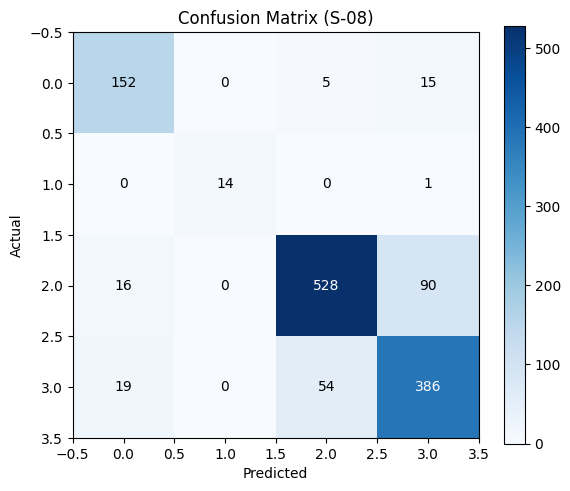

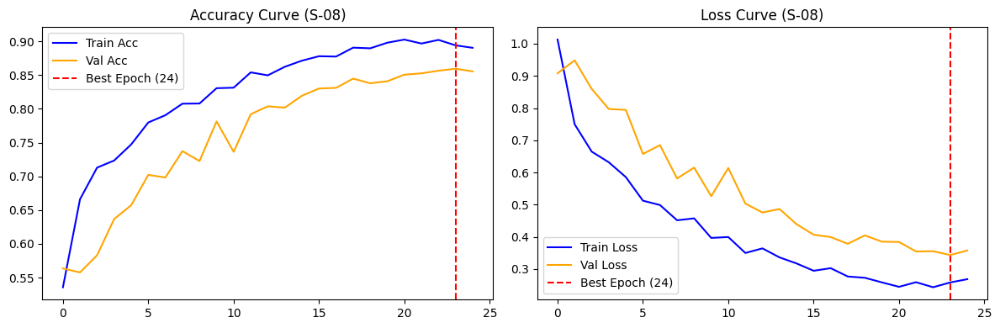

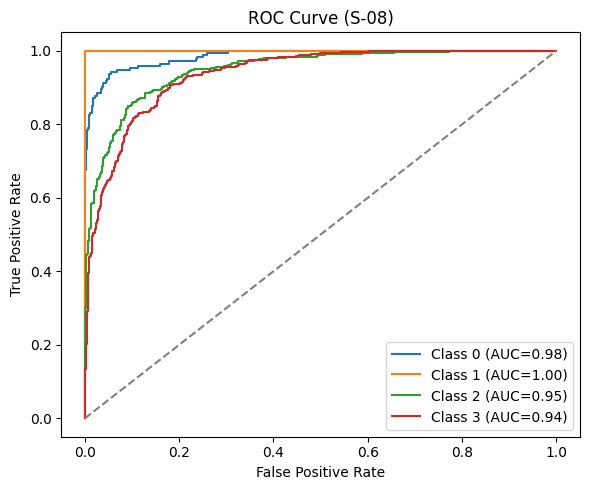

Eksperimen S-08 selesai.


🚀 MULAI EKSPERIMEN: S-09
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: ADAMW | Sched: REDUCE_LR
Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5244 | Val Acc: 0.5498 | Val Loss: 0.9288 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6538 | Val Acc: 0.5742 | Val Loss: 0.9300 
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6958 | Val Acc: 0.6533 | Val Loss: 0.7164 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7268 | Val Acc: 0.6387 | Val Loss: 0.8154 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7454 | Val Acc: 0.6738 | Val Loss: 0.7547 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.7637 | Val Acc: 0.6924 | Val Loss: 0.6481 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.7805 | Val Acc: 0.6826 | Val Loss: 0.7855 
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.7861 | Val Acc: 0.7246 | Val Loss: 0.6836 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.8149 | Val Acc: 0.7676 | Val Loss: 0.5286 ⭐ (Best)
Epoch 10/25 | LR:

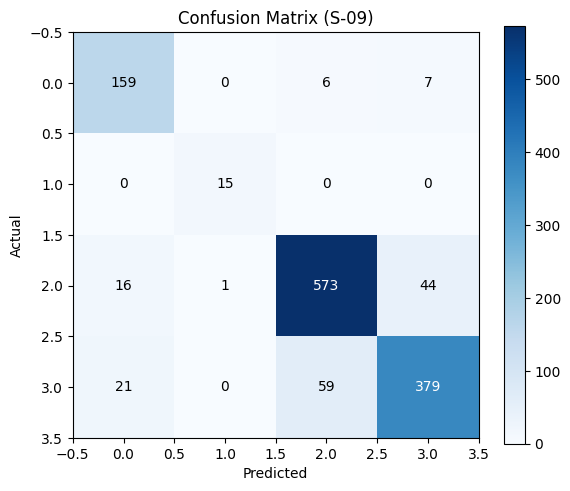

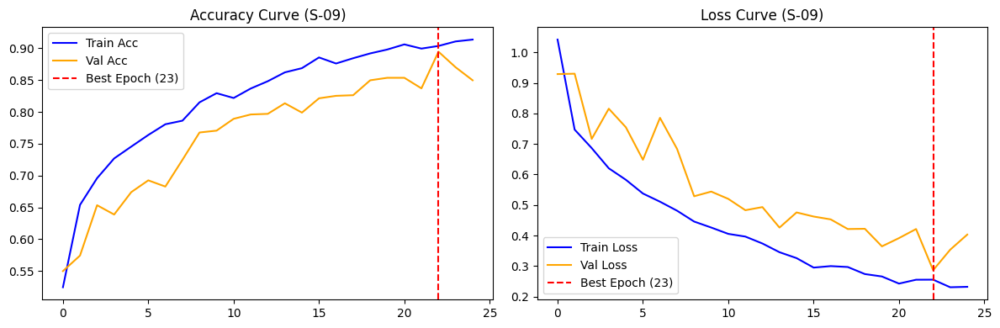

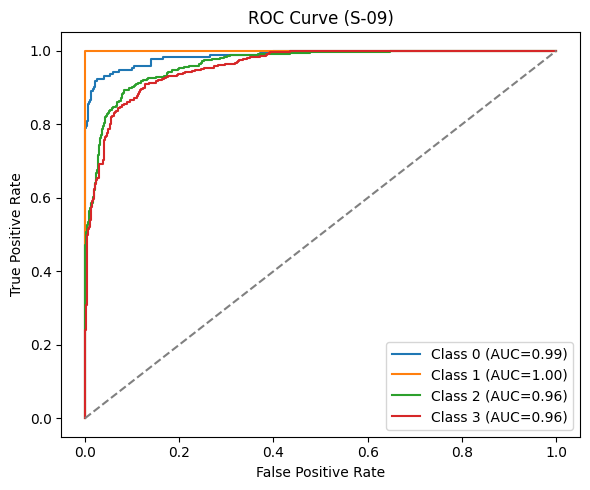

Eksperimen S-09 selesai.

🎉 Semua skenario Unfreeze Layer Terakhir dengan Sampler (S-07 s/d S-12) telah selesai dievaluasi.


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Unfreeze_Last_Layer_Sampler'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_unfreeze_last_layer_sampler'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"🛠️  Strategy: Unfreeze Layer Terakhir | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-07 sampai S-12 menggunakan "Unfreeze Layer Terakhir"
    for param in model.parameters():
        param.requires_grad = False

    # Buka layer4 (Layer Konvolusi Terakhir)
    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        mark = ""
        # EARLY STOPPING (Berdasarkan Val Loss sesuai kodemu)
        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    # Load best weights directly from RAM
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    print(f"\n✅ Bobot model terbaik (Epoch {best_epoch}) berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, indices in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING (Pure Output) ------------------
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.legend()
    plt.tight_layout()
    plt.show()

    # ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-07 s/d S-12
# ==========================================

run_experiment("S-07", optimizer_type="adam", scheduler_type="reduce_lr")
run_experiment("S-08", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-09", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-10", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-11", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-12", optimizer_type="sgd", scheduler_type="cosine")

print("🎉 Semua skenario Unfreeze Layer Terakhir dengan Sampler (S-07 s/d S-12) telah selesai dievaluasi.")


🚀 MULAI EKSPERIMEN: S-10
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: ADAMW | Sched: COSINE
Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5129 | Val Acc: 0.5381 | Val Loss: 0.9489 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.6663 | Val Acc: 0.6260 | Val Loss: 0.7857 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7053 | Val Acc: 0.6270 | Val Loss: 0.8667 
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.7234 | Val Acc: 0.6191 | Val Loss: 0.8350 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.7419 | Val Acc: 0.6709 | Val Loss: 0.7527 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.7588 | Val Acc: 0.6514 | Val Loss: 0.7850 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.7842 | Val Acc: 0.7012 | Val Loss: 0.6400 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.8113 | Val Acc: 0.7432 | Val Loss: 0.5933 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.8123 | Val Acc: 0.7373 | Val Loss: 0.6425 
Epoch 10/25 | LR: 6.55e-05 | Train Acc

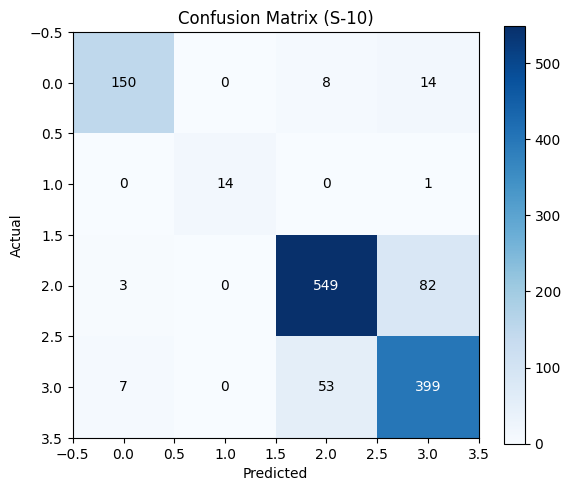

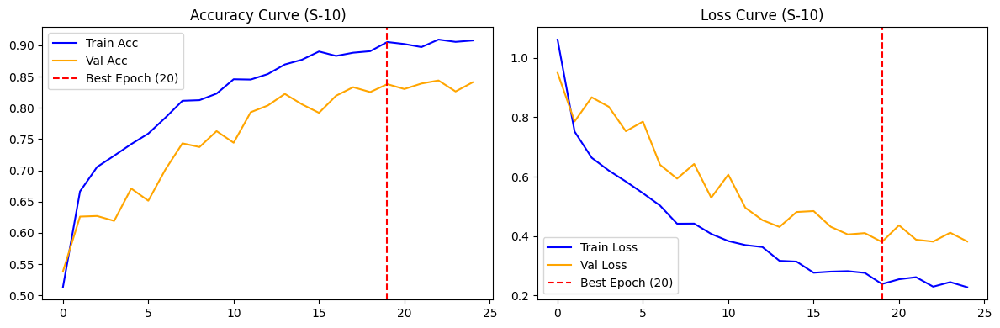

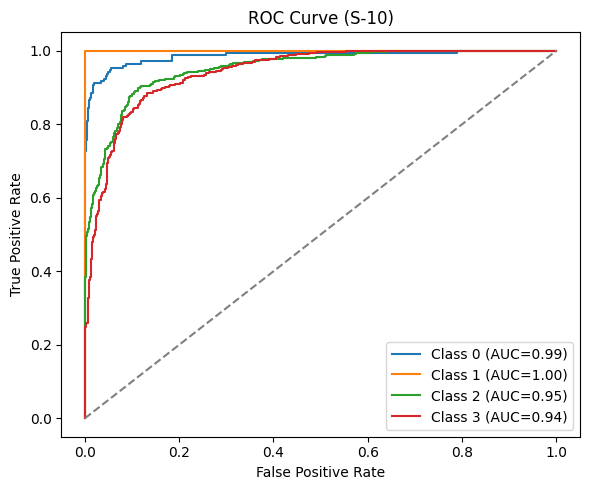

Eksperimen S-10 selesai.


🚀 MULAI EKSPERIMEN: S-11
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: REDUCE_LR
Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2615 | Val Acc: 0.2471 | Val Loss: 1.3937 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2786 | Val Acc: 0.2559 | Val Loss: 1.3883 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2900 | Val Acc: 0.2939 | Val Loss: 1.3805 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.2891 | Val Acc: 0.2695 | Val Loss: 1.3841 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.3174 | Val Acc: 0.2695 | Val Loss: 1.3864 
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.3286 | Val Acc: 0.3271 | Val Loss: 1.3736 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.3230 | Val Acc: 0.3428 | Val Loss: 1.3677 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.3420 | Val Acc: 0.3545 | Val Loss: 1.3648 ⭐ (Best)
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.3521 | Val Acc: 0.3350 | Val Loss: 1.3674 
Epo

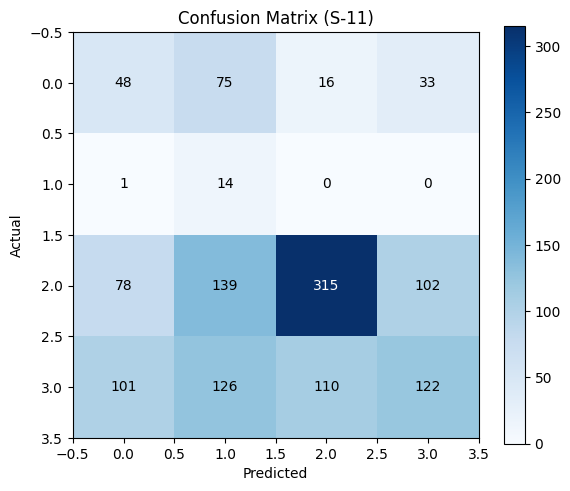

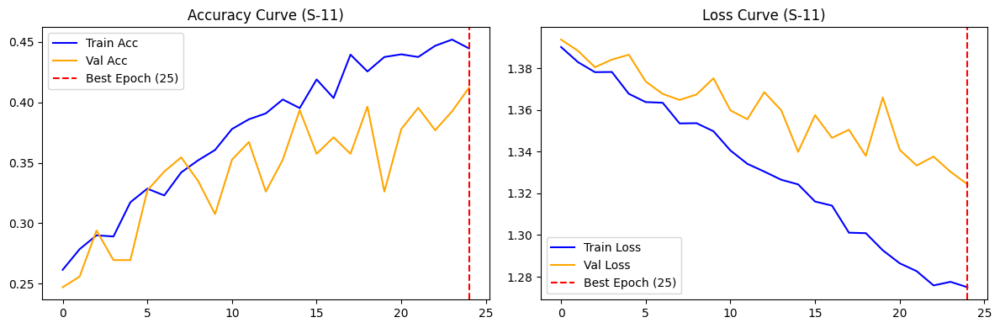

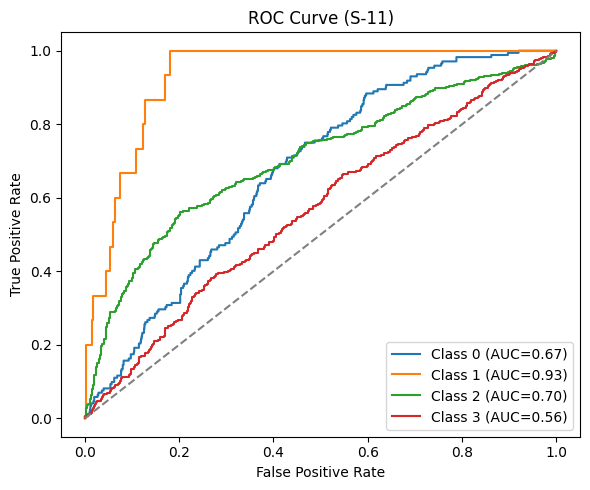

Eksperimen S-11 selesai.


🚀 MULAI EKSPERIMEN: S-12
🛠️  Strategy: Unfreeze Layer Terakhir | Optim: SGD | Sched: COSINE
Total Trainable Parameters: 14,972,932

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2664 | Val Acc: 0.3613 | Val Loss: 1.3627 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2595 | Val Acc: 0.3887 | Val Loss: 1.3604 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2864 | Val Acc: 0.3604 | Val Loss: 1.3681 
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.3157 | Val Acc: 0.3574 | Val Loss: 1.3694 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.3242 | Val Acc: 0.3076 | Val Loss: 1.3775 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.3289 | Val Acc: 0.3174 | Val Loss: 1.3758 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.3557 | Val Acc: 0.3643 | Val Loss: 1.3639 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.3367 | Val Acc: 0.2861 | Val Loss: 1.3787 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.3596 | Val Acc: 0.2920 | Val Loss: 1.3784 
⚠️ Early stopping dipicu pada epoch 9!

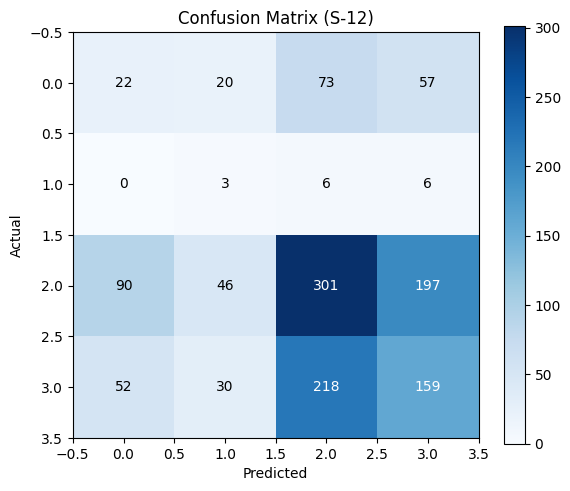

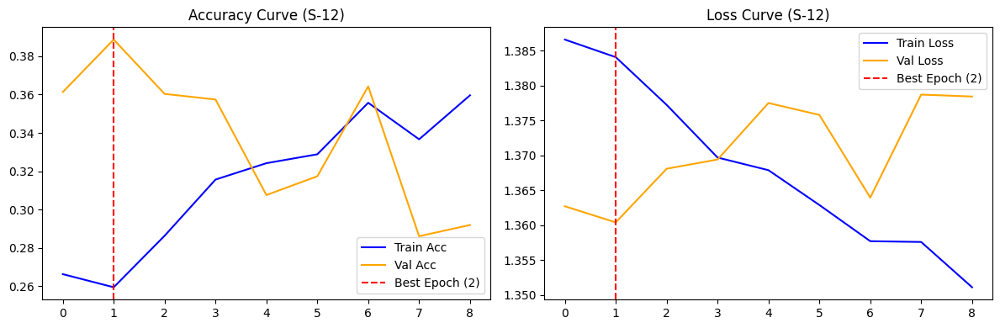

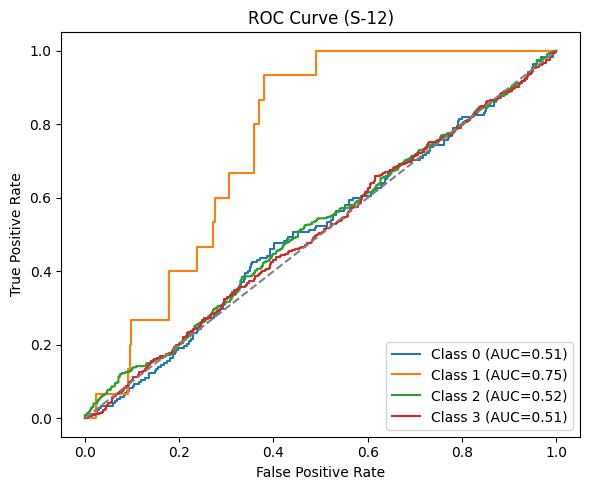

Eksperimen S-12 selesai.



In [ ]:
run_experiment("S-10", optimizer_type="adamw", scheduler_type="cosine")
run_experiment("S-11", optimizer_type="sgd", scheduler_type="reduce_lr")
run_experiment("S-12", optimizer_type="sgd", scheduler_type="cosine")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning_Sampler
Device: cuda

Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-13
🛠️  Strategy: Full Tuning | Optim: ADAM | Sched: REDUCE_LR

📊 INFORMASI LAYER (FULL TUNING):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5747 | Val Acc: 0.4150 | Val Loss: 1.2609 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.7268 | Val Acc: 0.5596 | Val Loss: 1.0458 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.7844 | Val Acc: 0.6436 | Val Loss: 0.8826 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.8311 | Val Acc: 0.7393 | Val Loss: 0.6197 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.8

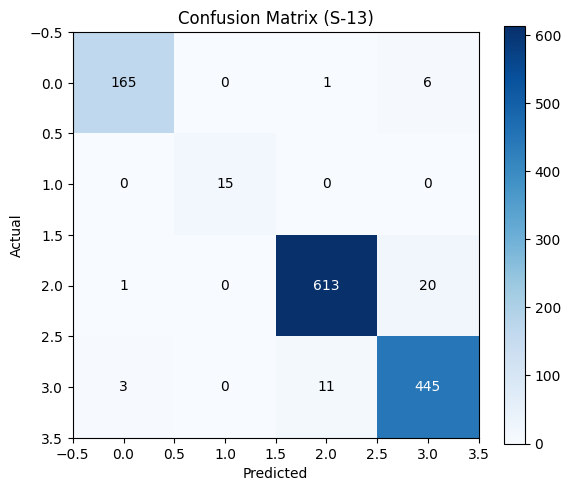

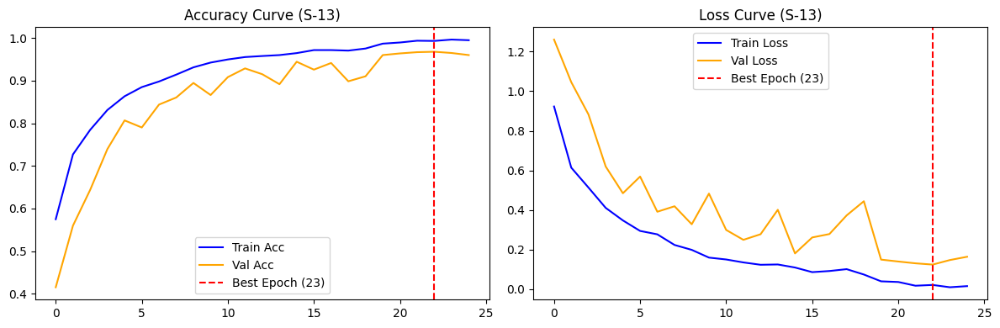

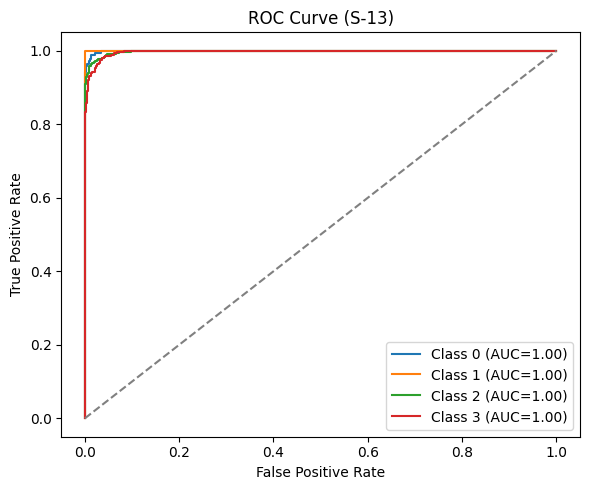

Eksperimen S-13 selesai.


🚀 MULAI EKSPERIMEN: S-14
🛠️  Strategy: Full Tuning | Optim: ADAM | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5933 | Val Acc: 0.5869 | Val Loss: 0.8466 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.7214 | Val Acc: 0.6768 | Val Loss: 0.7066 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7898 | Val Acc: 0.7559 | Val Loss: 0.6078 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.8335 | Val Acc: 0.8057 | Val Loss: 0.4699 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.8672 | Val Acc: 0.8242 | Val Loss: 0.4312 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8914 | Val Acc: 0.8213 | Val Loss: 0.4632 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.9138 | Val Acc: 0.8184 | Val Loss: 0.4656 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.9395 | Val Acc: 0.8955 | Val Loss: 0.3043 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9375 | Val Acc: 0.9072 | Val Loss: 0.2594 ⭐ (Best)
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.9529 |

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning_Sampler'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_full_tuning_sampler'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# Tracker agar info layer tidak di-print berulang-ulang
info_printed = False

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"🛠️  Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-13 sampai S-18 menggunakan "Full Tuning"
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI)
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FULL TUNING):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        mark = ""
        # EARLY STOPPING (Berdasarkan Val Loss)
        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Loss: {best_loss:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING (Pure Output) ------------------
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.legend()
    plt.tight_layout()
    plt.show()

    # ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-13 s/d S-18
# ==========================================

run_experiment("S-13", optimizer_type="adam", scheduler_type="reduce_lr")
run_experiment("S-14", optimizer_type="adam", scheduler_type="cosine")
# run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-16", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

print("🎉 Semua skenario Full Tuning dengan Sampler (S-13 s/d S-18) telah selesai dievaluasi.")

Mounted at /content/drive
Google Drive berhasil disambungkan. Bobot akan disimpan di: /content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning_Sampler
Device: cuda

Loading dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…):   0%|          | 0.00/22.6M [00:00<?, ?B/s]

data/test-00000-of-00001-44110b9df98c558(…):   0%|          | 0.00/5.65M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Train: 4096 | Val: 1024 | Test: 1280

🚀 MULAI EKSPERIMEN: S-15
🛠️  Strategy: Full Tuning | Optim: ADAMW | Sched: REDUCE_LR
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 182MB/s]



📊 INFORMASI LAYER (FULL TUNING):
   - Total Parameter    : 23,516,228
   - Frozen Parameter   : 0 (0.00%)
   - Trainable Parameter: 23,516,228 (100.00%)

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5747 | Val Acc: 0.4150 | Val Loss: 1.2609 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.7268 | Val Acc: 0.5596 | Val Loss: 1.0458 ⭐ (Best)
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.7844 | Val Acc: 0.6436 | Val Loss: 0.8826 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.8311 | Val Acc: 0.7393 | Val Loss: 0.6197 ⭐ (Best)
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.8633 | Val Acc: 0.8066 | Val Loss: 0.4845 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8848 | Val Acc: 0.7900 | Val Loss: 0.5688 
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8979 | Val Acc: 0.8438 | Val Loss: 0.3911 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.9141 | Val Acc: 0.8604 | Val Loss: 0.4188 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9312 | Val Acc: 0.8945 | Val Loss: 0.3278 ⭐ (Best)
Ep

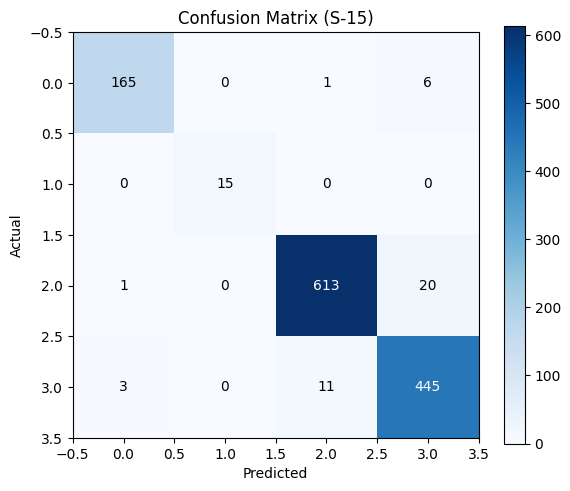

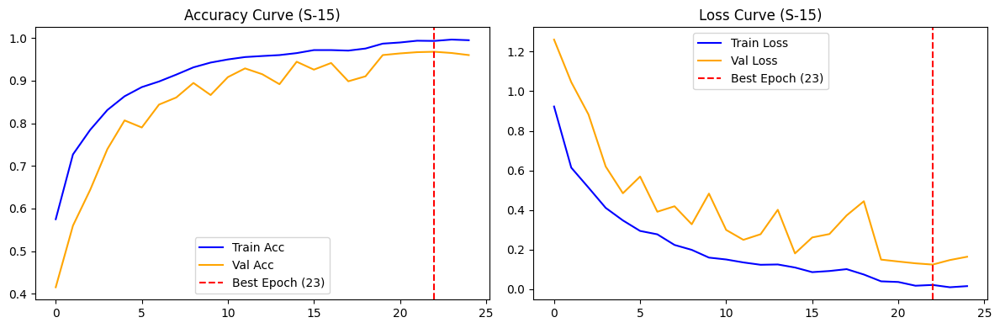

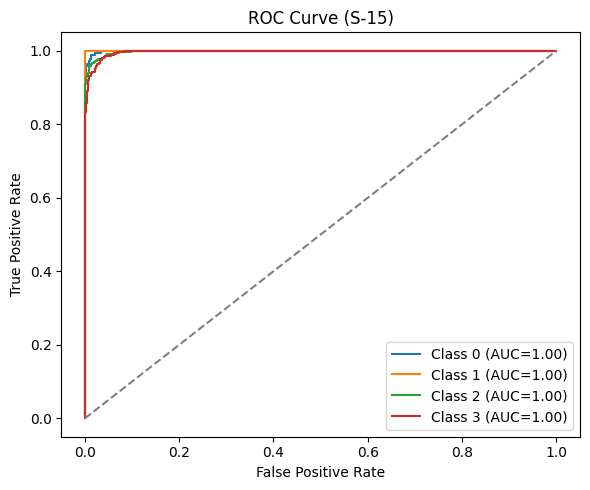

Eksperimen S-15 selesai.


🚀 MULAI EKSPERIMEN: S-16
🛠️  Strategy: Full Tuning | Optim: ADAMW | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.5933 | Val Acc: 0.5869 | Val Loss: 0.8466 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.7214 | Val Acc: 0.6768 | Val Loss: 0.7066 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.7898 | Val Acc: 0.7559 | Val Loss: 0.6078 ⭐ (Best)
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.8335 | Val Acc: 0.8057 | Val Loss: 0.4699 ⭐ (Best)
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.8672 | Val Acc: 0.8242 | Val Loss: 0.4312 ⭐ (Best)
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.8914 | Val Acc: 0.8213 | Val Loss: 0.4632 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.9138 | Val Acc: 0.8184 | Val Loss: 0.4656 
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.9395 | Val Acc: 0.8955 | Val Loss: 0.3043 ⭐ (Best)
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.9375 | Val Acc: 0.9072 | Val Loss: 0.2594 ⭐ (Best)
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.9529 

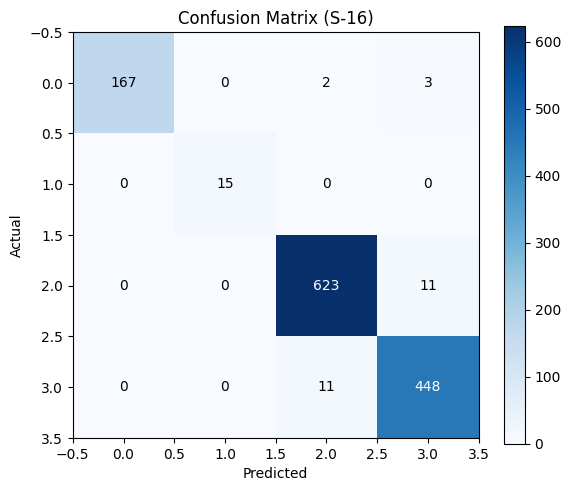

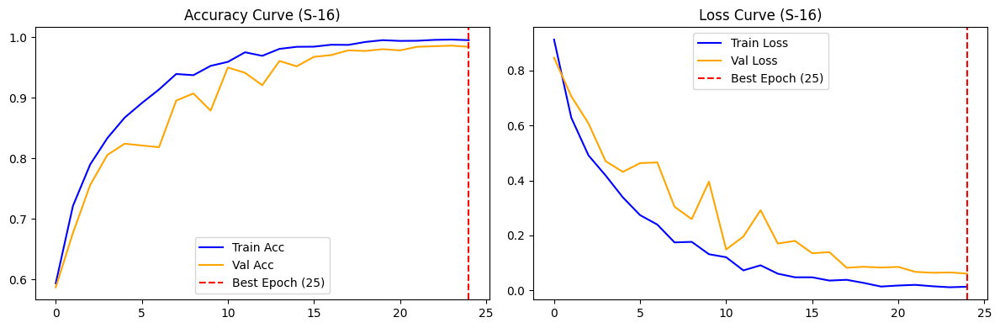

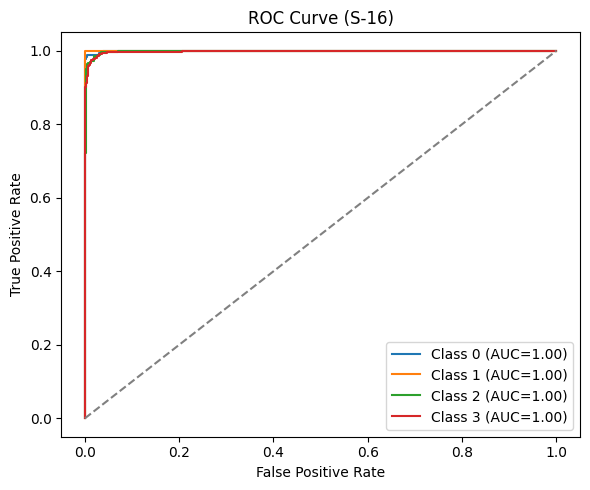

Eksperimen S-16 selesai.

🎉 Semua skenario Full Tuning dengan Sampler (S-13 s/d S-18) telah selesai dievaluasi.


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
try:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_save_path = '/content/drive/MyDrive/Alzheimer_MRI_Models/Full_Tuning_Sampler'
    print(f"Google Drive berhasil disambungkan. Bobot akan disimpan di: {drive_save_path}")
except ImportError:
    drive_save_path = './output_full_tuning_sampler'
    print("Tidak berjalan di Colab. Menyimpan secara lokal.")

os.makedirs(drive_save_path, exist_ok=True)

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked Learning Rate
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,
    "num_workers": 2,
    "seed": 42,
    "save_dir": drive_save_path
}

torch.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed(CONFIG["seed"])
torch.cuda.manual_seed_all(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("\nLoading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. WEIGHTED RANDOM SAMPLER SETUP
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts

sample_weights = class_weights[train_labels]
sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# Tracker agar info layer tidak di-print berulang-ulang
info_printed = False

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    global info_printed

    print(f"\n{'='*70}")
    print(f"🚀 MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"🛠️  Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*70}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-13 sampai S-18 menggunakan "Full Tuning"
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # REKAM JEJAK LAYER & PARAMETER (PRINT HANYA SEKALI)
    if not info_printed:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        frozen_params = total_params - trainable_params
        print(f"\n📊 INFORMASI LAYER (FULL TUNING):")
        print(f"   - Total Parameter    : {total_params:,}")
        print(f"   - Frozen Parameter   : {frozen_params:,} ({(frozen_params/total_params)*100:.2f}%)")
        print(f"   - Trainable Parameter: {trainable_params:,} ({(trainable_params/total_params)*100:.2f}%)")
        info_printed = True

    # REKAM BOBOT AWAL (Initial Weights)
    initial_weights = copy.deepcopy(model.fc[1].weight.data)

    # ------------------ LOSS FUNCTION ------------------
    criterion = nn.CrossEntropyLoss()

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    best_epoch = 0
    counter = 0

    print("\n⏳ Memulai Training...")
    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        mark = ""
        # EARLY STOPPING (Berdasarkan Val Loss)
        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = epoch + 1
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
            mark = "⭐ (Best)"
        else:
            counter += 1

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f} {mark}")

        if counter >= CONFIG["patience"]:
            print(f"⚠️ Early stopping dipicu pada epoch {epoch+1}!")
            break

    # ------------------ POST-TRAINING ANALYSIS & SAVING ------------------
    model.load_state_dict(best_model)

    # Simpan Bobot Terbaik ke Google Drive
    save_path = os.path.join(CONFIG["save_dir"], f"{scenario_name}_best_epoch_{best_epoch}.pth")
    torch.save(model.state_dict(), save_path)

    final_weights = model.fc[1].weight.data
    weight_shift = torch.norm(final_weights - initial_weights).item()

    print(f"\n📈 HASIL TRAINING [{scenario_name}]:")
    print(f"   - Epoch Terbaik : Epoch {best_epoch} (Val Loss: {best_loss:.4f})")
    print(f"   - L2 Norm Perubahan Bobot Layer Klasifikasi: {weight_shift:.4f}")
    print(f"   - ✅ Bobot berhasil disimpan di: {save_path}")

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST EVALUATION ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING (Pure Output) ------------------
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.tight_layout()
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc", color='blue')
    ax1.plot(val_acc_hist, label="Val Acc", color='orange')
    ax1.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax1.set_title(f"Accuracy Curve ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss", color='blue')
    ax2.plot(val_loss_hist, label="Val Loss", color='orange')
    ax2.axvline(x=best_epoch-1, color='red', linestyle='--', label=f'Best Epoch ({best_epoch})')
    ax2.set_title(f"Loss Curve ({scenario_name})")
    ax2.legend()
    plt.tight_layout()
    plt.show()

    # ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure(figsize=(6, 5))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--", color='grey')
    plt.title(f"ROC Curve ({scenario_name})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO S-13 s/d S-18
# ==========================================

# run_experiment("S-13", optimizer_type="adam", scheduler_type="reduce_lr")
# run_experiment("S-14", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")
run_experiment("S-16", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

print("🎉 Semua skenario Full Tuning dengan Sampler (S-13 s/d S-18) telah selesai dievaluasi.")


🚀 MULAI EKSPERIMEN: S-17
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: REDUCE_LR

⏳ Memulai Training...
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.2590 | Val Acc: 0.1572 | Val Loss: 1.4106 ⭐ (Best)
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.2537 | Val Acc: 0.1650 | Val Loss: 1.4148 
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.2646 | Val Acc: 0.2139 | Val Loss: 1.3971 ⭐ (Best)
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.2649 | Val Acc: 0.2070 | Val Loss: 1.4011 
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.2717 | Val Acc: 0.2432 | Val Loss: 1.3961 ⭐ (Best)
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.2749 | Val Acc: 0.1953 | Val Loss: 1.3947 ⭐ (Best)
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.2632 | Val Acc: 0.2656 | Val Loss: 1.3819 ⭐ (Best)
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.2803 | Val Acc: 0.2549 | Val Loss: 1.3848 
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.2856 | Val Acc: 0.2490 | Val Loss: 1.3920 
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.2913 | Val Acc: 0.2471 | Val Loss: 1.3857 
Epo

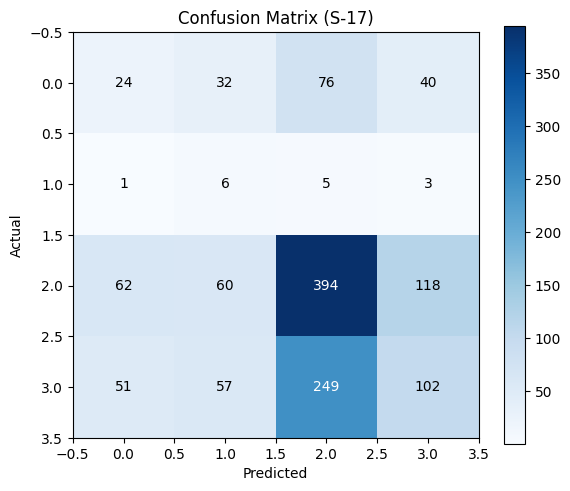

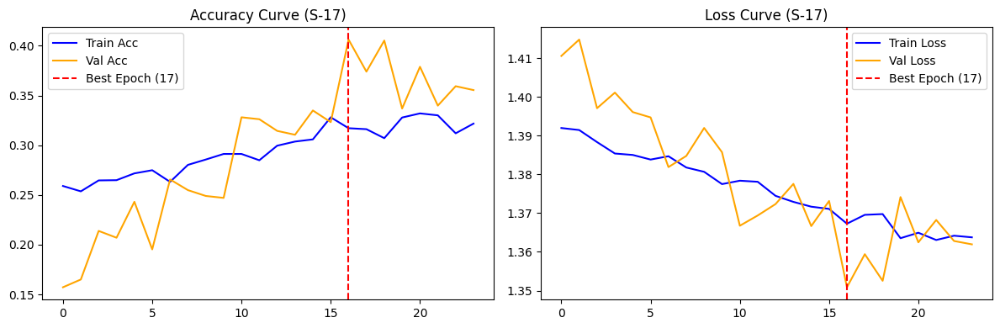

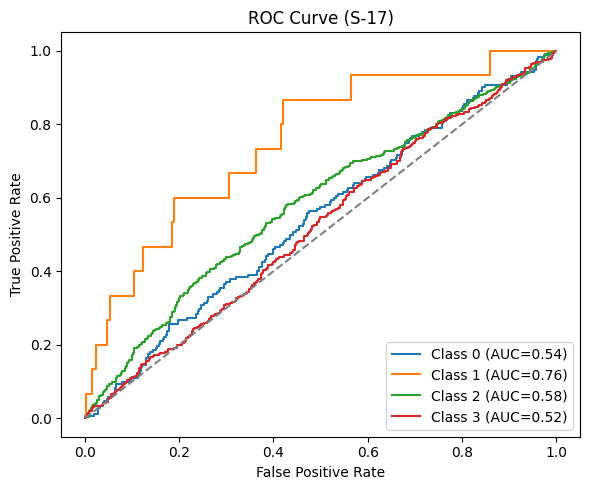

Eksperimen S-17 selesai.


🚀 MULAI EKSPERIMEN: S-18
🛠️  Strategy: Full Tuning | Optim: SGD | Sched: COSINE

⏳ Memulai Training...
Epoch 01/25 | LR: 9.96e-05 | Train Acc: 0.2456 | Val Acc: 0.3359 | Val Loss: 1.3752 ⭐ (Best)
Epoch 02/25 | LR: 9.84e-05 | Train Acc: 0.2483 | Val Acc: 0.3213 | Val Loss: 1.3729 ⭐ (Best)
Epoch 03/25 | LR: 9.65e-05 | Train Acc: 0.2378 | Val Acc: 0.2578 | Val Loss: 1.3903 
Epoch 04/25 | LR: 9.38e-05 | Train Acc: 0.2568 | Val Acc: 0.2812 | Val Loss: 1.3829 
Epoch 05/25 | LR: 9.05e-05 | Train Acc: 0.2451 | Val Acc: 0.2998 | Val Loss: 1.3877 
Epoch 06/25 | LR: 8.64e-05 | Train Acc: 0.2585 | Val Acc: 0.3232 | Val Loss: 1.3777 
Epoch 07/25 | LR: 8.19e-05 | Train Acc: 0.2678 | Val Acc: 0.3408 | Val Loss: 1.3701 ⭐ (Best)
Epoch 08/25 | LR: 7.68e-05 | Train Acc: 0.2664 | Val Acc: 0.3086 | Val Loss: 1.3882 
Epoch 09/25 | LR: 7.13e-05 | Train Acc: 0.2769 | Val Acc: 0.2930 | Val Loss: 1.3794 
Epoch 10/25 | LR: 6.55e-05 | Train Acc: 0.2705 | Val Acc: 0.3242 | Val Loss: 1.37

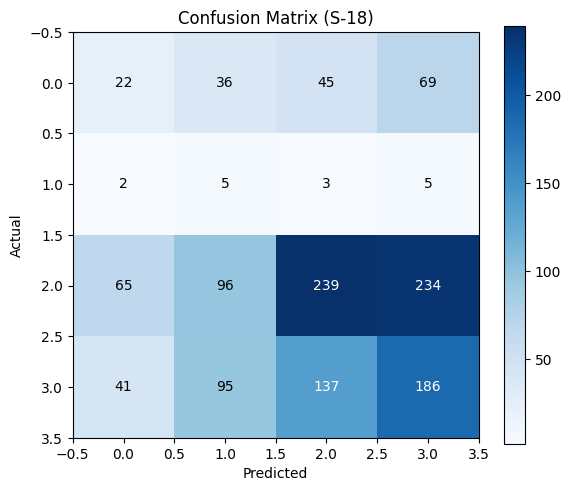

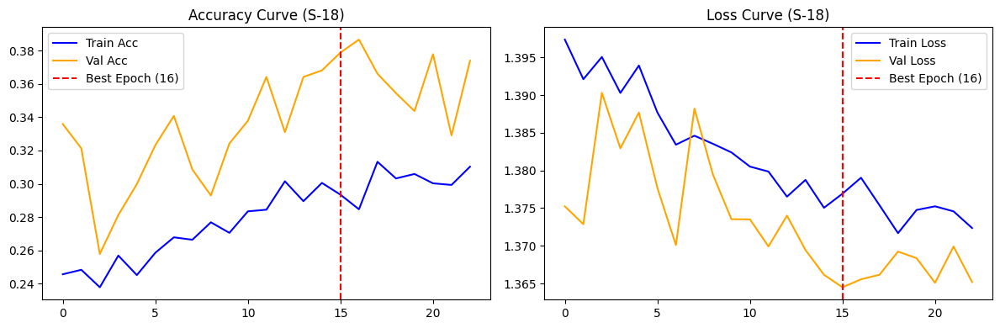

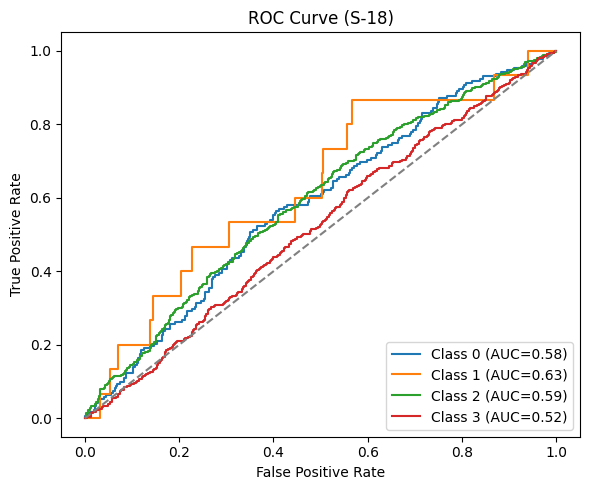

Eksperimen S-18 selesai.



In [ ]:
run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

# LAST EXPERIMENT

AUG + Class Weight

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-15
Strategy: Full Tuning | Optim: ADAMW | Sched: REDUCE_LR
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5166 | Val Acc: 0.5537 | Val Loss: 1.0524
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6096 | Val Acc: 0.6719 | Val Loss: 0.7970
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6902 | Val Acc: 0.6348 | Val Loss: 0.7375
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7505 | Val Acc: 0.7432 | Val Loss: 0.5294
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.8069 | Val Acc: 0.8428 | Val Loss: 0.3788
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8494 | Val Acc: 0.8643 | Val Loss: 0.2703
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8682 | Val Acc: 0.8828 | Val Loss: 0.2808
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.8979 | Val Acc: 0.8818 | Val Loss: 0.3304
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9185 | Val Acc: 0.9346 | Val Loss: 0.1642
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.9377 | Val Acc

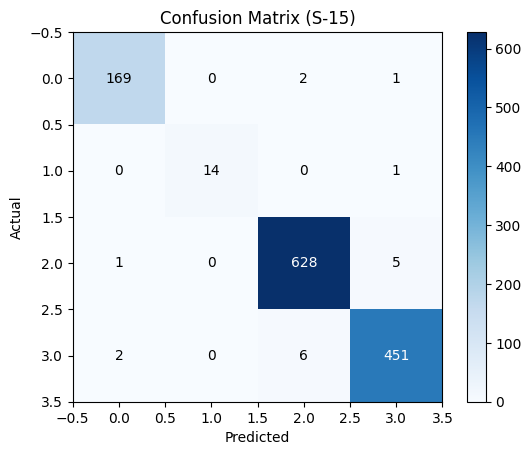

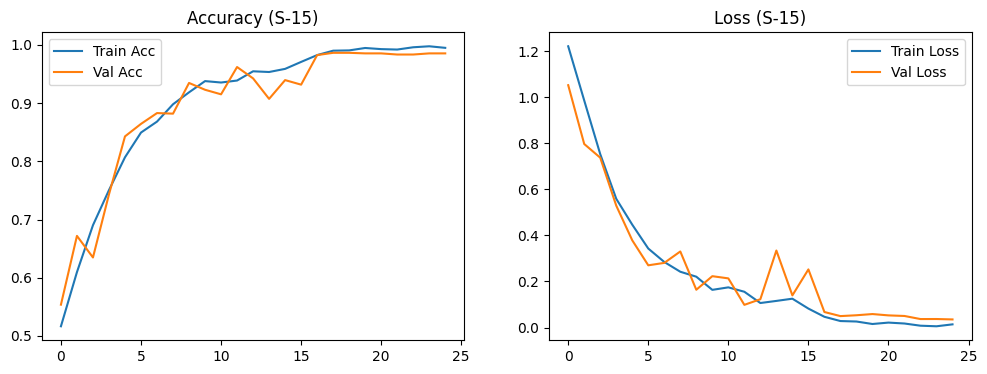

Eksperimen S-15 selesai.



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # LR Agresif untuk Full Tuning
    "batch_size": 16,
    "epochs": 25,
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE (CLASS WEIGHTS)
# ==========================================
# Menggantikan fungsi Sampler untuk menjaga kelengkapan distribusi data
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION TANPA COLOR JITTER)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# KEMBALI MENGGUNAKAN SHUFFLE=TRUE
train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: S-13 sampai S-18 menggunakan "Full Tuning"
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION (CLASS WEIGHTS) ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        # Memantau val_acc (mode='max') dengan factor 0.3
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Eksekusi Scheduler
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']
        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO (Format Sesuai Request)
# ==========================================

# run_experiment("S-13", optimizer_type="adam", scheduler_type="reduce_lr")
# run_experiment("S-14", optimizer_type="adam", scheduler_type="cosine")
run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")
# run_experiment("S-16", optimizer_type="adamw", scheduler_type="cosine")
# run_experiment("S-17", optimizer_type="sgd", scheduler_type="reduce_lr")
# run_experiment("S-18", optimizer_type="sgd", scheduler_type="cosine")

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # DIKUNCI: Mengikuti hardcode 1e-4 dari kode asli
    "batch_size": 16,
    "epochs": 25,
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE (CLASS WEIGHTS)
# ==========================================
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)
class_weights_tensor = torch.tensor(class_weights_array, dtype=torch.float).to(device)

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (LOCKED TO AUGMENTATION TANPA COLOR JITTER)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(
    train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"]
)
val_loader = DataLoader(
    val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)
test_loader = DataLoader(
    test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"]
)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: Full Tuning | Optim: {optimizer_type.upper()} | Sched: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # DIKUNCI: Full Tuning
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params_count = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params_count:,}")

    # ------------------ LOSS FUNCTION (CLASS WEIGHTS) ------------------
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    # ------------------ OPTIMIZER ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        # Weight decay ditambahkan khusus AdamW sesuai aslinya
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER ------------------
    if scheduler_type == "reduce_lr":
        # Mode diubah ke 'max' memantau Akurasi, sesuai kode asli
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', patience=3, factor=0.3
        )
    elif scheduler_type == "cosine":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Eksekusi Scheduler (ReduceLR memantau val_acc sekarang)
        if scheduler_type == "reduce_lr":
            scheduler.step(val_acc)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']
        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()
    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI SKENARIO
# ==========================================

run_experiment("S-15", optimizer_type="adamw", scheduler_type="reduce_lr")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: S-15
Strategy: Full Tuning | Optim: ADAMW | Sched: REDUCE_LR
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.5134 | Val Acc: 0.4404 | Val Loss: 1.1322
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.6038 | Val Acc: 0.6621 | Val Loss: 0.7442
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.6936 | Val Acc: 0.6484 | Val Loss: 0.6316
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.7397 | Val Acc: 0.7891 | Val Loss: 0.4603
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.7971 | Val Acc: 0.8018 | Val Loss: 0.4804
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.8452 | Val Acc: 0.8496 | Val Loss: 0.3220
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.8789 | Val Acc: 0.8633 | Val Loss: 0.3055
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.9019 | Val Acc: 0.8906 | Val Loss: 0.2963
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.9229 | Val Acc: 0.8877 | Val Loss: 0.2858
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.9294 | Val Acc

Data Augmentasi + Skenario Handling Imbalance Data (None, Class Weight, Weighted Random Sampler)

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: 1_TIDAK_ADA
Strategy: none
-> Tidak menggunakan Sampler (Normal Shuffle)...
-> Menggunakan Standard Loss Function...
Epoch 01/25 | Train Acc: 0.5542 | Val Acc: 0.6035 | Val Loss: 0.8260
Epoch 02/25 | Train Acc: 0.6265 | Val Acc: 0.6719 | Val Loss: 0.7354
Epoch 03/25 | Train Acc: 0.6768 | Val Acc: 0.6973 | Val Loss: 0.6722
Epoch 04/25 | Train Acc: 0.7312 | Val Acc: 0.7539 | Val Loss: 0.5713
Epoch 05/25 | Train Acc: 0.7666 | Val Acc: 0.7725 | Val Loss: 0.5485
Epoch 06/25 | Train Acc: 0.8042 | Val Acc: 0.8232 | Val Loss: 0.4496
Epoch 07/25 | Train Acc: 0.8303 | Val Acc: 0.8496 | Val Loss: 0.3927
Epoch 08/25 | Train Acc: 0.8501 | Val Acc: 0.8418 | Val Loss: 0.4065
Epoch 09/25 | Train Acc: 0.8682 | Val Acc: 0.8662 | Val Loss: 0.3386
Epoch 10/25 | Train Acc: 0.8911 | Val Acc: 0.8789 | Val Loss: 0.3196
Epoch 11/25 | Train Acc: 0.8997 | Val Acc: 0.8857 | Val Loss: 0.3174
Epoch 12/25 | Train Acc: 0.9065 | Va

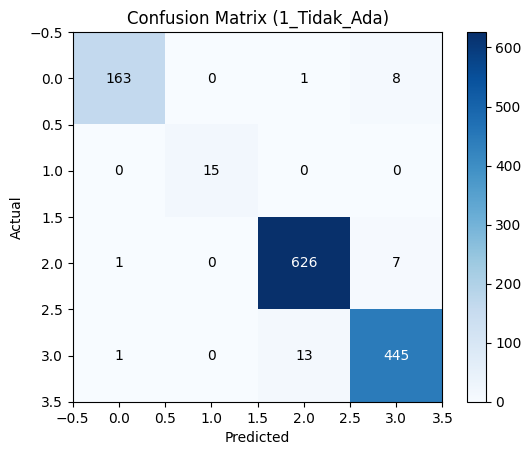

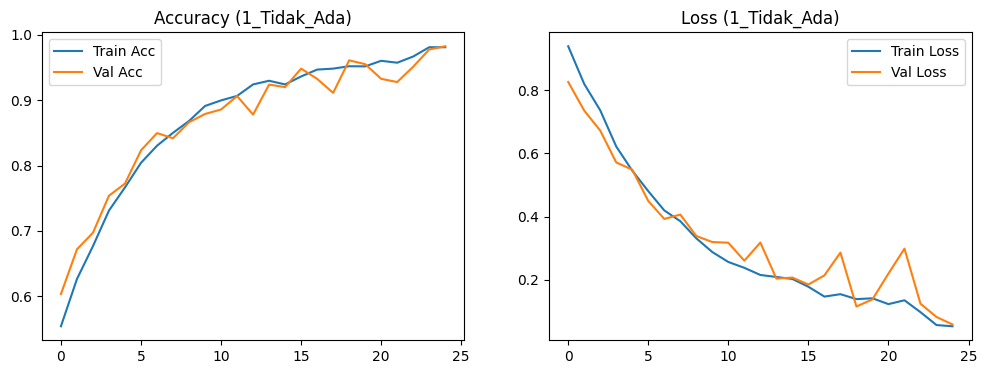

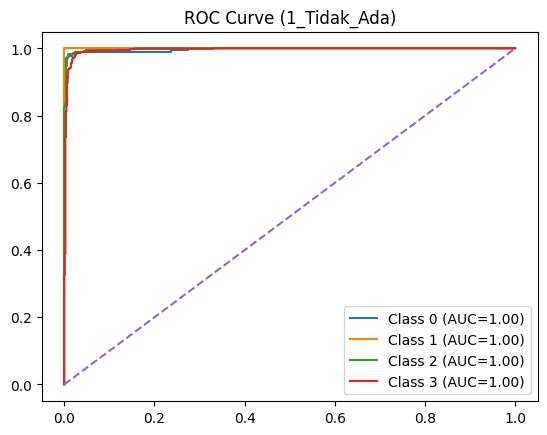

Eksperimen 1_Tidak_Ada selesai.

MULAI EKSPERIMEN: 2_CLASS_WEIGHT
Strategy: class_weight
-> Tidak menggunakan Sampler (Normal Shuffle)...
-> Menggunakan Class Weight pada Loss Function...
Epoch 01/25 | Train Acc: 0.4844 | Val Acc: 0.5889 | Val Loss: 1.2134
Epoch 02/25 | Train Acc: 0.5776 | Val Acc: 0.6211 | Val Loss: 0.9481
Epoch 03/25 | Train Acc: 0.6387 | Val Acc: 0.6348 | Val Loss: 0.8113
Epoch 04/25 | Train Acc: 0.6780 | Val Acc: 0.6816 | Val Loss: 0.7864
Epoch 05/25 | Train Acc: 0.7153 | Val Acc: 0.7334 | Val Loss: 0.5756
Epoch 06/25 | Train Acc: 0.7563 | Val Acc: 0.7559 | Val Loss: 0.5888
Epoch 07/25 | Train Acc: 0.7856 | Val Acc: 0.7988 | Val Loss: 0.5284
Epoch 08/25 | Train Acc: 0.8167 | Val Acc: 0.8076 | Val Loss: 0.4318
Epoch 09/25 | Train Acc: 0.8447 | Val Acc: 0.8379 | Val Loss: 0.3882
Epoch 10/25 | Train Acc: 0.8577 | Val Acc: 0.8506 | Val Loss: 0.3807
Epoch 11/25 | Train Acc: 0.8713 | Val Acc: 0.8906 | Val Loss: 0.2761
Epoch 12/25 | Train Acc: 0.8877 | Val Acc: 0.8857 | V

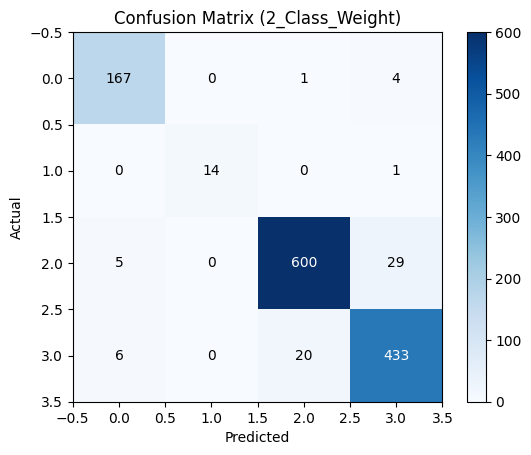

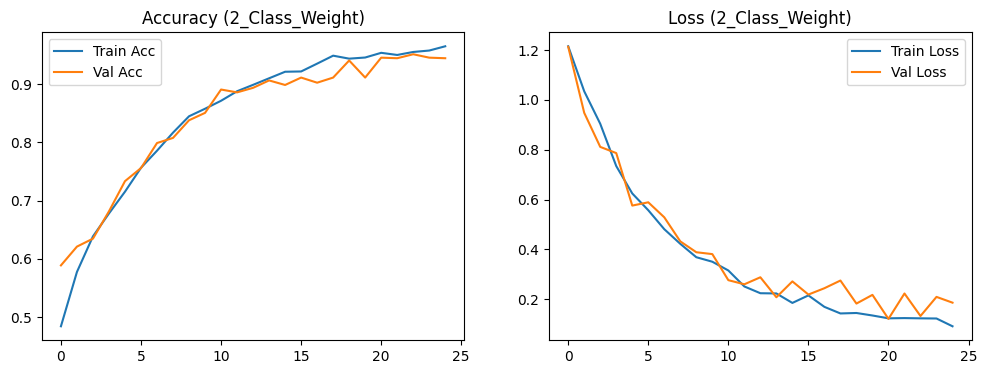

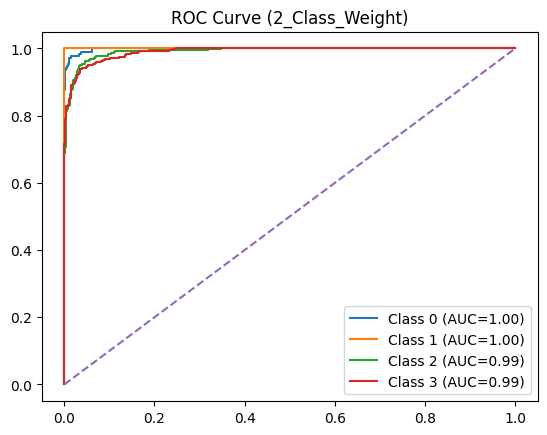

Eksperimen 2_Class_Weight selesai.

MULAI EKSPERIMEN: 3_WEIGHTED_SAMPLER
Strategy: sampler
-> Menggunakan Weighted Random Sampler...
-> Menggunakan Standard Loss Function...
Epoch 01/25 | Train Acc: 0.5647 | Val Acc: 0.5908 | Val Loss: 0.8536
Epoch 02/25 | Train Acc: 0.7002 | Val Acc: 0.6602 | Val Loss: 0.7649
Epoch 03/25 | Train Acc: 0.7527 | Val Acc: 0.7197 | Val Loss: 0.6509
Epoch 04/25 | Train Acc: 0.7844 | Val Acc: 0.6182 | Val Loss: 0.9966
Epoch 05/25 | Train Acc: 0.8213 | Val Acc: 0.7119 | Val Loss: 0.7365
Epoch 06/25 | Train Acc: 0.8438 | Val Acc: 0.7910 | Val Loss: 0.4883
Epoch 07/25 | Train Acc: 0.8535 | Val Acc: 0.7744 | Val Loss: 0.5431
Epoch 08/25 | Train Acc: 0.8655 | Val Acc: 0.8008 | Val Loss: 0.4679
Epoch 09/25 | Train Acc: 0.8838 | Val Acc: 0.8447 | Val Loss: 0.4144
Epoch 10/25 | Train Acc: 0.8955 | Val Acc: 0.8623 | Val Loss: 0.3414
Epoch 11/25 | Train Acc: 0.9055 | Val Acc: 0.8379 | Val Loss: 0.4532
Epoch 12/25 | Train Acc: 0.9233 | Val Acc: 0.8604 | Val Loss: 0.367

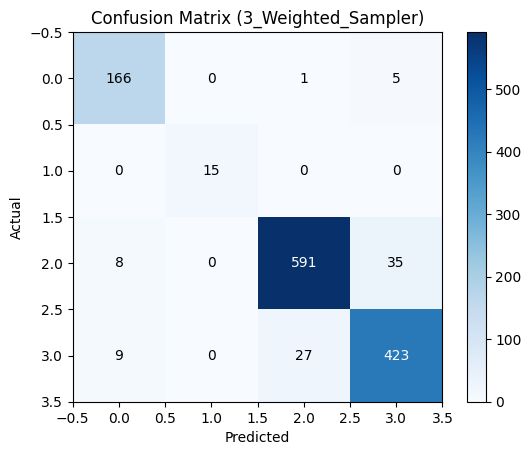

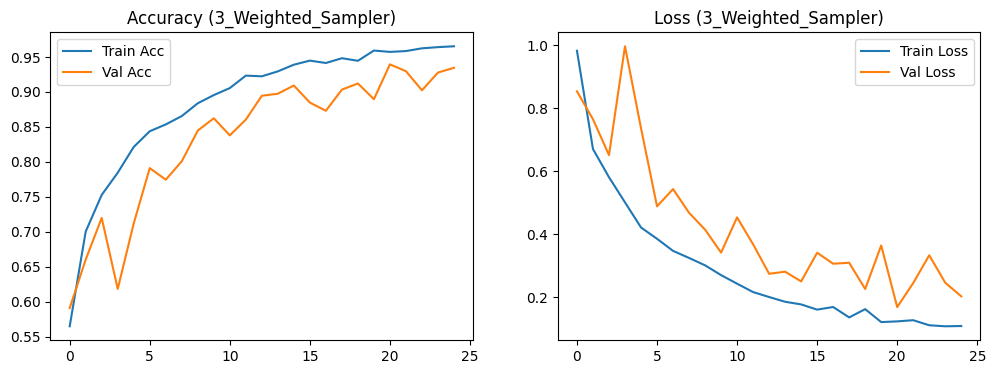

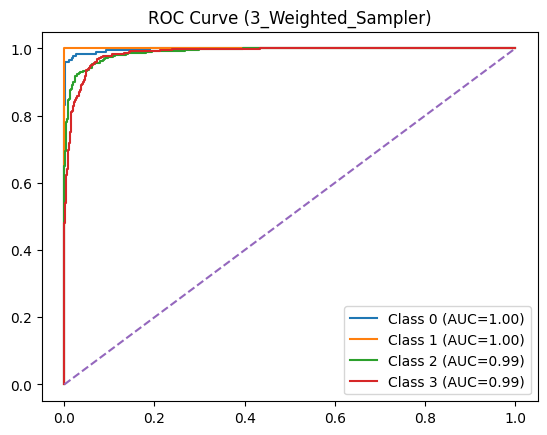

Eksperimen 3_Weighted_Sampler selesai.

Ketiga skenario selesai dieksekusi. Silakan bandingkan laporan klasifikasi (F1-score pada kelas minoritas) dan grafik CM-nya.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-4,            # Locked
    "batch_size": 16,
    "epochs": 25,          # Locked
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"] # 5120 data
test_data = dataset["test"]      # 1280 data

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE WEIGHTS
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts
# Normalisasi bobot agar nilainya stabil untuk gradient loss
class_weights = class_weights / class_weights.sum() * num_classes

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        # Kembalikan idx untuk kebutuhan XAI nanti
        return image, label, idx

# ==========================================
# 5. TRANSFORMS (AUGMENTASI DIKUNCI ON)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1), # Tambahan ColorJitter
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Instansiasi dataset
train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, imbalance_strategy):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Strategy: {imbalance_strategy}")
    print(f"{'='*60}")

    # ------------------ DATALOADER & SAMPLER ------------------
    if imbalance_strategy == "sampler":
        print("-> Menggunakan Weighted Random Sampler...")
        sample_weights = class_weights[train_labels]
        sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)
        # Ingat: Shuffle WAJIB False jika menggunakan custom sampler
        train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, shuffle=False, num_workers=CONFIG["num_workers"])
    else:
        print("-> Tidak menggunakan Sampler (Normal Shuffle)...")
        train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])

    val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
    test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze layer 3 & 4
    for param in model.layer3.parameters():
        param.requires_grad = True
    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # ------------------ LOSS FUNCTION ------------------
    if imbalance_strategy == "class_weight":
        print("-> Menggunakan Class Weight pada Loss Function...")
        class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
        criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    else:
        print("-> Menggunakan Standard Loss Function...")
        criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=CONFIG["lr"]
    )

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=3, factor=0.3
    )

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total
        scheduler.step(val_acc)

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load bobot terbaik
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    # 1. Confusion Matrix
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.title(f"ROC Curve ({scenario_name})")
    plt.legend(loc="lower right")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.")

# ==========================================
# 7. EKSEKUSI 3 SKENARIO SECARA BERUNTUN
# ==========================================

# Skenario 1: Tanpa Penanganan Imbalance
run_experiment(scenario_name="1_Tidak_Ada", imbalance_strategy="none")

# Skenario 2: Menggunakan Class Weight pada Loss
run_experiment(scenario_name="2_Class_Weight", imbalance_strategy="class_weight")

# Skenario 3: Menggunakan Weighted Random Sampler
run_experiment(scenario_name="3_Weighted_Sampler", imbalance_strategy="sampler")

print("\nKetiga skenario selesai dieksekusi. Silakan bandingkan laporan klasifikasi (F1-score pada kelas minoritas) dan grafik CM-nya.")

Data Augmentation + Class Weight + Skenario FIne Tuning (Freeze, Unfreeze last, Unfreeze Last)

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: V1_FREEZE_SEMUA
Fine-Tuning: freeze_all | Initial LR: 0.0001
Total Trainable Parameters: 8,196
Epoch 01/25 | LR: 1.00e-04 | Train Acc: 0.4646 | Val Acc: 0.5176 | Val Loss: 1.2876
Epoch 02/25 | LR: 1.00e-04 | Train Acc: 0.4717 | Val Acc: 0.5225 | Val Loss: 1.2728
Epoch 03/25 | LR: 1.00e-04 | Train Acc: 0.4885 | Val Acc: 0.5195 | Val Loss: 1.2659
Epoch 04/25 | LR: 1.00e-04 | Train Acc: 0.4961 | Val Acc: 0.5371 | Val Loss: 1.2588
Epoch 05/25 | LR: 1.00e-04 | Train Acc: 0.4990 | Val Acc: 0.5322 | Val Loss: 1.2486
Epoch 06/25 | LR: 1.00e-04 | Train Acc: 0.5107 | Val Acc: 0.5107 | Val Loss: 1.2409
Epoch 07/25 | LR: 1.00e-04 | Train Acc: 0.5027 | Val Acc: 0.5156 | Val Loss: 1.2286
Epoch 08/25 | LR: 1.00e-04 | Train Acc: 0.5149 | Val Acc: 0.4980 | Val Loss: 1.2301
Epoch 09/25 | LR: 1.00e-04 | Train Acc: 0.5237 | Val Acc: 0.5234 | Val Loss: 1.2182
Epoch 10/25 | LR: 1.00e-04 | Train Acc: 0.5283 | Val Acc: 0.5

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


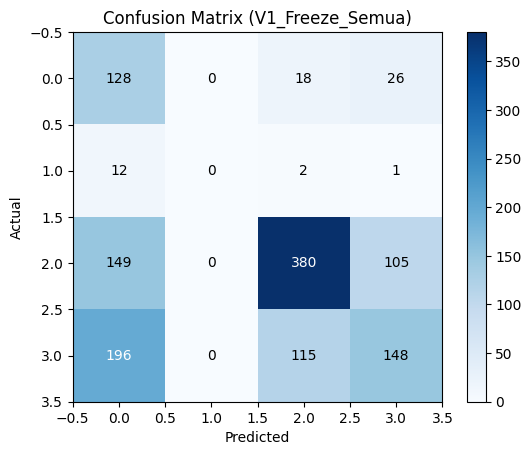

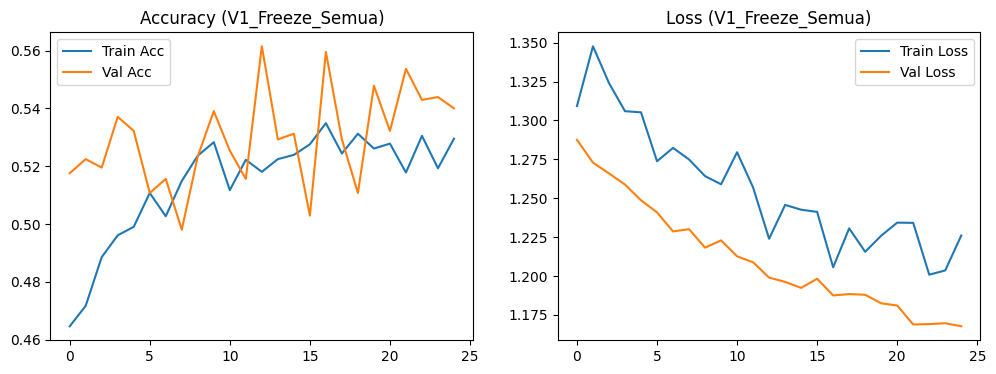

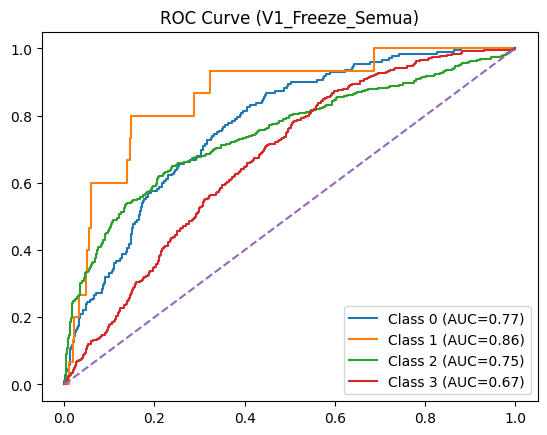

Eksperimen V1_Freeze_Semua selesai.


MULAI EKSPERIMEN: V2_UNFREEZE_LAYER_TERAKHIR
Fine-Tuning: unfreeze_last | Initial LR: 5e-05
Total Trainable Parameters: 14,972,932
Epoch 01/25 | LR: 5.00e-05 | Train Acc: 0.4614 | Val Acc: 0.5010 | Val Loss: 1.1678
Epoch 02/25 | LR: 5.00e-05 | Train Acc: 0.5266 | Val Acc: 0.5518 | Val Loss: 1.0705
Epoch 03/25 | LR: 5.00e-05 | Train Acc: 0.5669 | Val Acc: 0.5977 | Val Loss: 1.0109
Epoch 04/25 | LR: 5.00e-05 | Train Acc: 0.5876 | Val Acc: 0.6104 | Val Loss: 0.9474
Epoch 05/25 | LR: 5.00e-05 | Train Acc: 0.6111 | Val Acc: 0.5957 | Val Loss: 0.8681
Epoch 06/25 | LR: 5.00e-05 | Train Acc: 0.6292 | Val Acc: 0.6426 | Val Loss: 0.7995
Epoch 07/25 | LR: 5.00e-05 | Train Acc: 0.6406 | Val Acc: 0.6553 | Val Loss: 0.7616
Epoch 08/25 | LR: 5.00e-05 | Train Acc: 0.6592 | Val Acc: 0.6660 | Val Loss: 0.7392
Epoch 09/25 | LR: 5.00e-05 | Train Acc: 0.6711 | Val Acc: 0.6768 | Val Loss: 0.6670
Epoch 10/25 | LR: 5.00e-05 | Train Acc: 0.6926 | Val Acc: 0.6875 | Val Loss

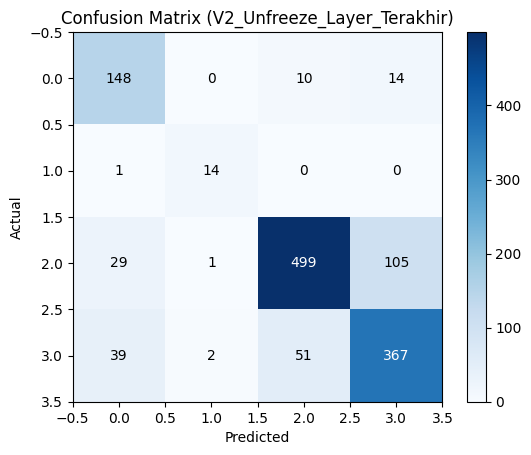

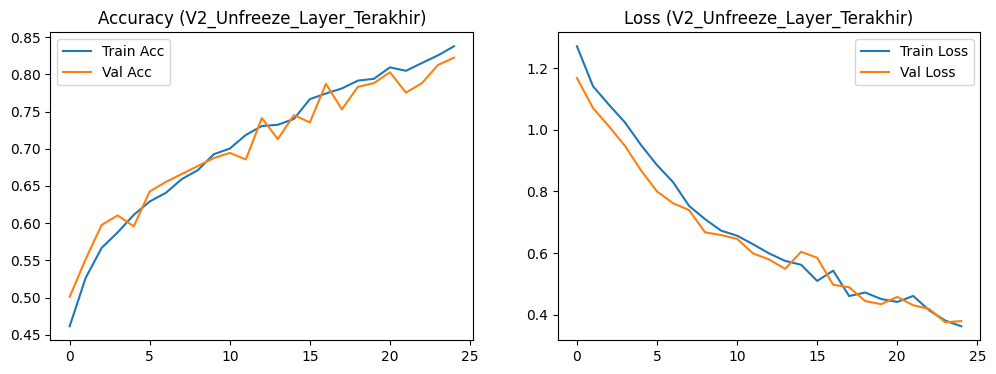

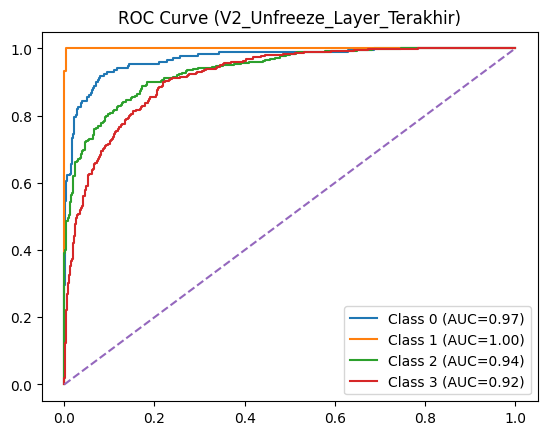

Eksperimen V2_Unfreeze_Layer_Terakhir selesai.


MULAI EKSPERIMEN: V3_FULL_TUNING
Fine-Tuning: full_tuning | Initial LR: 1e-05
Total Trainable Parameters: 23,516,228
Epoch 01/25 | LR: 1.00e-05 | Train Acc: 0.4333 | Val Acc: 0.5156 | Val Loss: 1.2824
Epoch 02/25 | LR: 1.00e-05 | Train Acc: 0.5046 | Val Acc: 0.4951 | Val Loss: 1.2358
Epoch 03/25 | LR: 1.00e-05 | Train Acc: 0.5088 | Val Acc: 0.5068 | Val Loss: 1.1801
Epoch 04/25 | LR: 1.00e-05 | Train Acc: 0.5134 | Val Acc: 0.5254 | Val Loss: 1.1434
Epoch 05/25 | LR: 1.00e-05 | Train Acc: 0.5349 | Val Acc: 0.5215 | Val Loss: 1.1076
Epoch 06/25 | LR: 1.00e-05 | Train Acc: 0.5444 | Val Acc: 0.5527 | Val Loss: 1.0921
Epoch 07/25 | LR: 1.00e-05 | Train Acc: 0.5601 | Val Acc: 0.5918 | Val Loss: 1.0678
Epoch 08/25 | LR: 1.00e-05 | Train Acc: 0.5688 | Val Acc: 0.5859 | Val Loss: 1.0336
Epoch 09/25 | LR: 1.00e-05 | Train Acc: 0.5938 | Val Acc: 0.6279 | Val Loss: 0.9813
Epoch 10/25 | LR: 1.00e-05 | Train Acc: 0.6082 | Val Acc: 0.6260 | Val Loss: 0

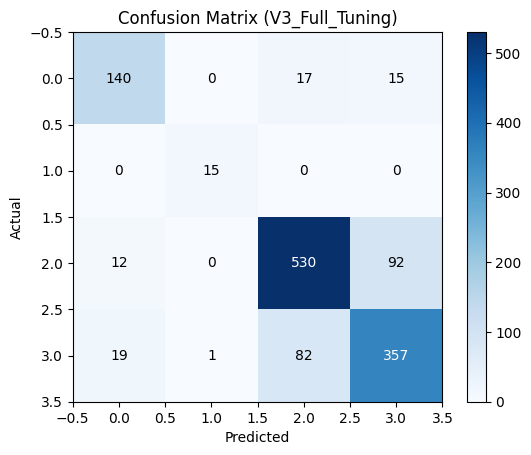

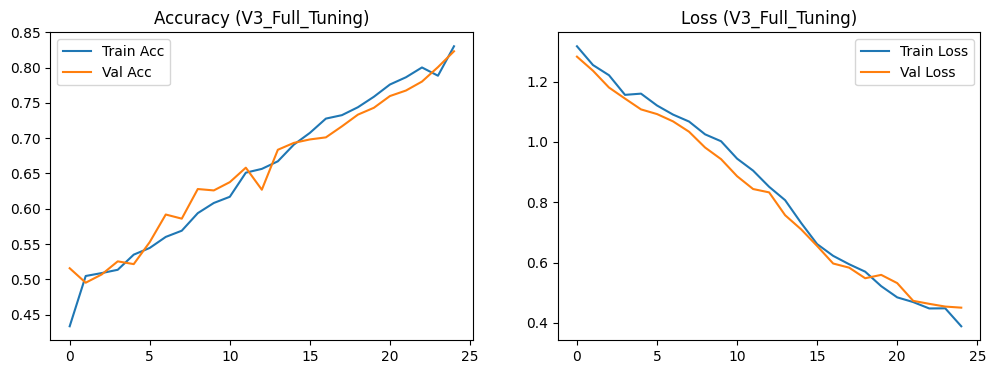

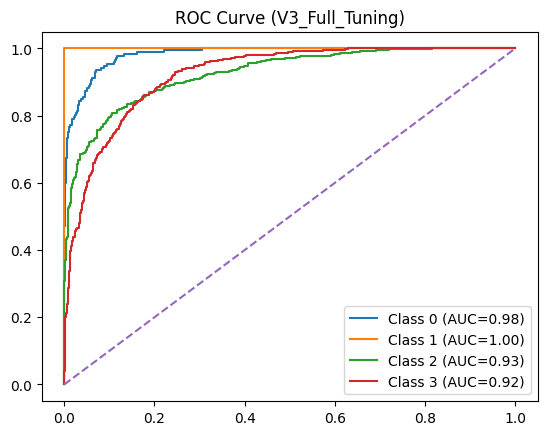

Eksperimen V3_Full_Tuning selesai.

Ketiga strategi Fine-Tuning selesai dievaluasi!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "batch_size": 16,
    "epochs": 25,          # Locked Epochs
    "patience": 7,         # Early stopping patience
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE WEIGHTS (CLASS WEIGHT DIKUNCI)
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * num_classes

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (AUGMENTASI DIKUNCI ON)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

# ------------------ DATALOADER ------------------
# Dataloader dibuat di luar fungsi karena tidak ada perubahan sampler antar skenario
train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, fine_tune_level):
    # --- LOGIKA LEARNING RATE DINAMIS ---
    if fine_tune_level == "freeze_all":
        current_lr = 1e-4  # V-1: Hanya train layer FC yang benar-benar baru
    elif fine_tune_level == "unfreeze_last":
        current_lr = 5e-5  # V-2: Train FC + Layer terakhir (perlu kehati-hatian menengah)
    else: # full_tuning
        current_lr = 1e-5  # V-3: Train semua layer (sangat hati-hati agar tidak lupa pre-trained)

    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Fine-Tuning: {fine_tune_level} | Initial LR: {current_lr}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # --- LOGIKA UNFREEZE BERDASARKAN LEVEL ---
    if fine_tune_level == "freeze_all":
        for param in model.parameters():
            param.requires_grad = False

    elif fine_tune_level == "unfreeze_last":
        for param in model.parameters():
            param.requires_grad = False
        # Unfreeze layer konvolusi terakhir ResNet50
        for param in model.layer4.parameters():
            param.requires_grad = True

    elif fine_tune_level == "full_tuning":
        for param in model.parameters():
            param.requires_grad = True

    # Ganti Layer FC Terakhir (selalu requires_grad=True secara otomatis)
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {trainable_params:,}")

    # ------------------ LOSS FUNCTION (CLASS WEIGHT DIKUNCI) ------------------
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    # ------------------ OPTIMIZER & SCHEDULER ------------------
    # Optimizer mengikat LR dinamis yang sudah kita tentukan di atas
    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=current_lr
    )

    # Memantau val_loss, jika tidak turun selama 3 epoch, pangkas LR jadi setengahnya
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=3
    )

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Scheduler merespons berdasarkan validation loss
        scheduler.step(val_loss)

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        # Cek LR berjalan untuk di-print
        current_lr_in_optim = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load bobot terbaik sebelum test
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    # 1. Confusion Matrix
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    # 2. Kurva Loss & Accuracy
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    # 3. ROC Curve
    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.title(f"ROC Curve ({scenario_name})")
    plt.legend(loc="lower right")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI 3 SKENARIO SECARA BERUNTUN
# ==========================================

# V-1: Freeze Semua Layer Feature
run_experiment(scenario_name="V1_Freeze_Semua", fine_tune_level="freeze_all")

# V-2: Unfreeze Layer 4 (Layer Terakhir ResNet50)
run_experiment(scenario_name="V2_Unfreeze_Layer_Terakhir", fine_tune_level="unfreeze_last")

# V-3: Full Tuning
run_experiment(scenario_name="V3_Full_Tuning", fine_tune_level="full_tuning")

print("Ketiga strategi Fine-Tuning selesai dievaluasi!")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: E4_ADAM
Optimizer: ADAM | LR: 1e-05 | Strategy: Full Tuning
Epoch 01/25 | LR: 1.00e-05 | Train Acc: 0.4277 | Val Acc: 0.4707 | Val Loss: 1.2708
Epoch 02/25 | LR: 1.00e-05 | Train Acc: 0.5020 | Val Acc: 0.5166 | Val Loss: 1.2288
Epoch 03/25 | LR: 1.00e-05 | Train Acc: 0.5244 | Val Acc: 0.5137 | Val Loss: 1.1686
Epoch 04/25 | LR: 1.00e-05 | Train Acc: 0.5332 | Val Acc: 0.5186 | Val Loss: 1.1445
Epoch 05/25 | LR: 1.00e-05 | Train Acc: 0.5505 | Val Acc: 0.5557 | Val Loss: 1.0891
Epoch 06/25 | LR: 1.00e-05 | Train Acc: 0.5654 | Val Acc: 0.5713 | Val Loss: 1.0408
Epoch 07/25 | LR: 1.00e-05 | Train Acc: 0.5754 | Val Acc: 0.6025 | Val Loss: 0.9889
Epoch 08/25 | LR: 1.00e-05 | Train Acc: 0.5911 | Val Acc: 0.5801 | Val Loss: 0.9775
Epoch 09/25 | LR: 1.00e-05 | Train Acc: 0.6145 | Val Acc: 0.6172 | Val Loss: 0.9234
Epoch 10/25 | LR: 1.00e-05 | Train Acc: 0.6323 | Val Acc: 0.6309 | Val Loss: 0.8874
Epoch 11/25 

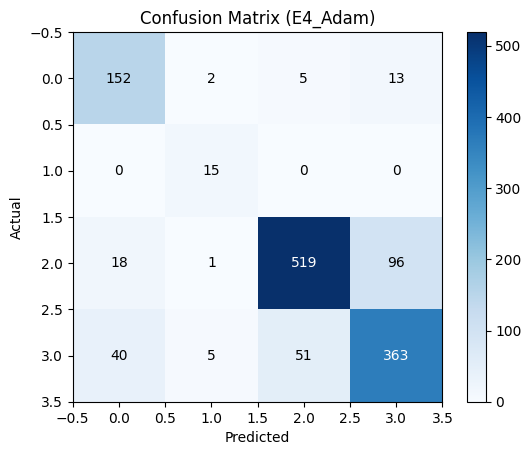

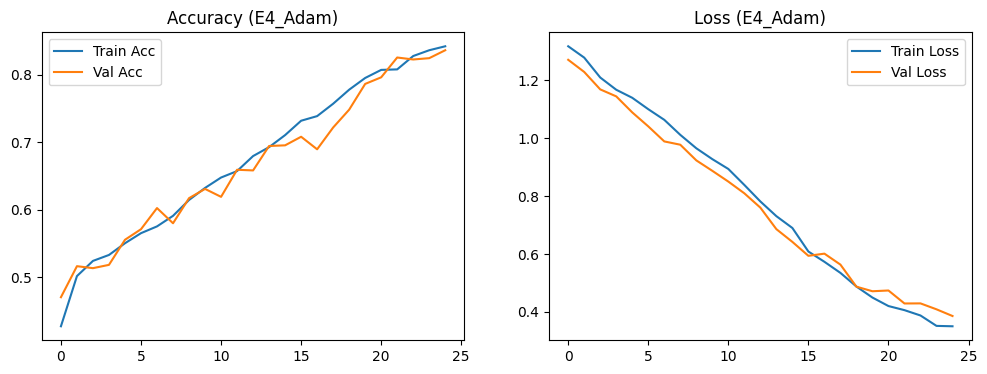

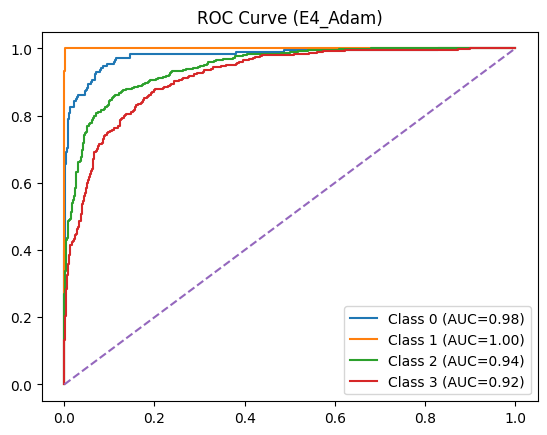

Eksperimen E4_Adam selesai.


MULAI EKSPERIMEN: E5_ADAMW
Optimizer: ADAMW | LR: 1e-05 | Strategy: Full Tuning
Epoch 01/25 | LR: 1.00e-05 | Train Acc: 0.3611 | Val Acc: 0.4873 | Val Loss: 1.2836
Epoch 02/25 | LR: 1.00e-05 | Train Acc: 0.4861 | Val Acc: 0.5039 | Val Loss: 1.2315
Epoch 03/25 | LR: 1.00e-05 | Train Acc: 0.5259 | Val Acc: 0.5381 | Val Loss: 1.1705
Epoch 04/25 | LR: 1.00e-05 | Train Acc: 0.5339 | Val Acc: 0.5107 | Val Loss: 1.1302
Epoch 05/25 | LR: 1.00e-05 | Train Acc: 0.5569 | Val Acc: 0.5293 | Val Loss: 1.1024
Epoch 06/25 | LR: 1.00e-05 | Train Acc: 0.5652 | Val Acc: 0.6025 | Val Loss: 1.0535
Epoch 07/25 | LR: 1.00e-05 | Train Acc: 0.5754 | Val Acc: 0.6045 | Val Loss: 1.0100
Epoch 08/25 | LR: 1.00e-05 | Train Acc: 0.6025 | Val Acc: 0.6016 | Val Loss: 0.9556
Epoch 09/25 | LR: 1.00e-05 | Train Acc: 0.6172 | Val Acc: 0.6094 | Val Loss: 0.9115
Epoch 10/25 | LR: 1.00e-05 | Train Acc: 0.6392 | Val Acc: 0.6230 | Val Loss: 0.8592
Epoch 11/25 | LR: 1.00e-05 | Train Acc: 0.6392 | V

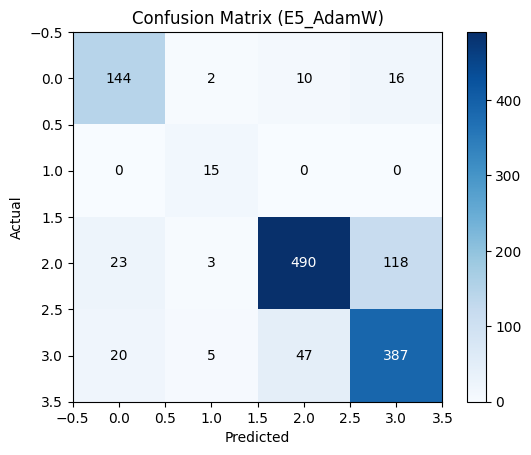

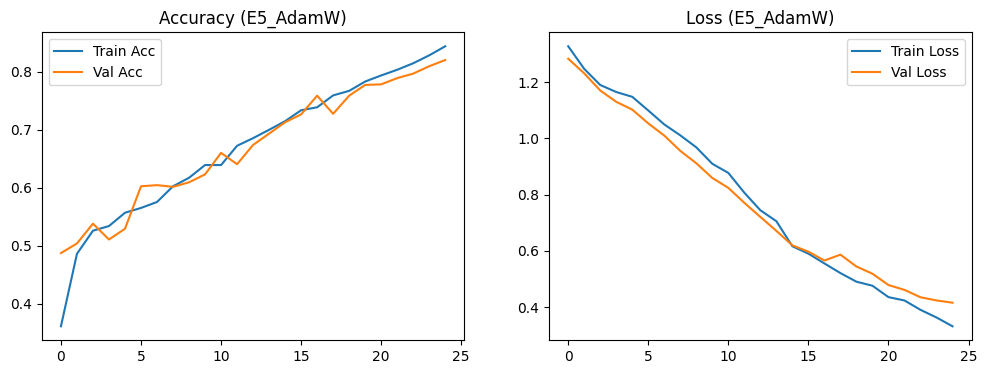

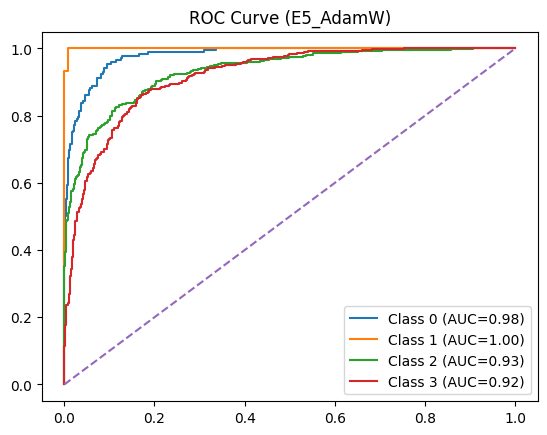

Eksperimen E5_AdamW selesai.


MULAI EKSPERIMEN: E6_SGD
Optimizer: SGD | LR: 1e-05 | Strategy: Full Tuning
Epoch 01/25 | LR: 1.00e-05 | Train Acc: 0.3516 | Val Acc: 0.3701 | Val Loss: 1.3665
Epoch 02/25 | LR: 1.00e-05 | Train Acc: 0.3411 | Val Acc: 0.3682 | Val Loss: 1.3635
Epoch 03/25 | LR: 1.00e-05 | Train Acc: 0.3406 | Val Acc: 0.3760 | Val Loss: 1.3629
Epoch 04/25 | LR: 1.00e-05 | Train Acc: 0.3354 | Val Acc: 0.3662 | Val Loss: 1.3624
Epoch 05/25 | LR: 1.00e-05 | Train Acc: 0.3369 | Val Acc: 0.3701 | Val Loss: 1.3613
Epoch 06/25 | LR: 1.00e-05 | Train Acc: 0.3323 | Val Acc: 0.3818 | Val Loss: 1.3620
Epoch 07/25 | LR: 1.00e-05 | Train Acc: 0.3423 | Val Acc: 0.3447 | Val Loss: 1.3590
Epoch 08/25 | LR: 1.00e-05 | Train Acc: 0.3289 | Val Acc: 0.3594 | Val Loss: 1.3608
Epoch 09/25 | LR: 1.00e-05 | Train Acc: 0.3330 | Val Acc: 0.3350 | Val Loss: 1.3615
Epoch 10/25 | LR: 1.00e-05 | Train Acc: 0.3315 | Val Acc: 0.3838 | Val Loss: 1.3604
Epoch 11/25 | LR: 5.00e-06 | Train Acc: 0.3381 | Val 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


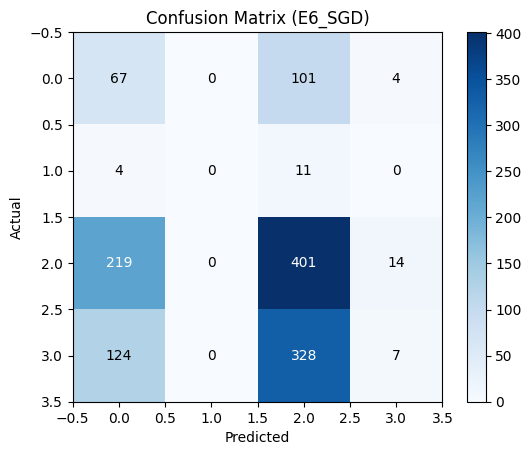

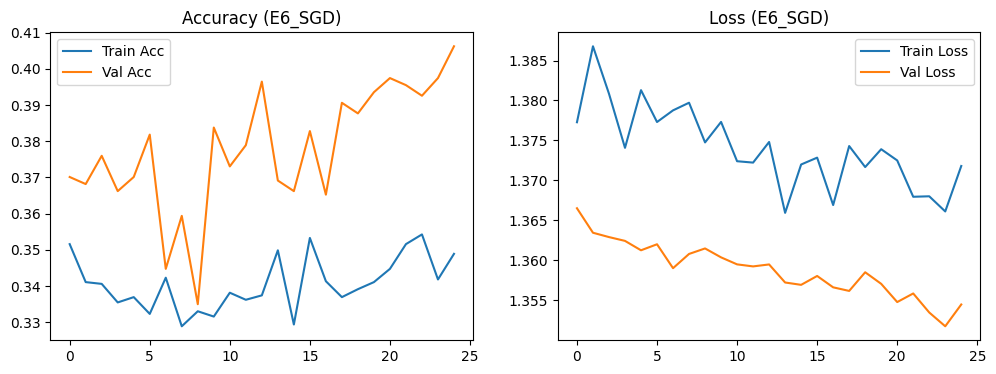

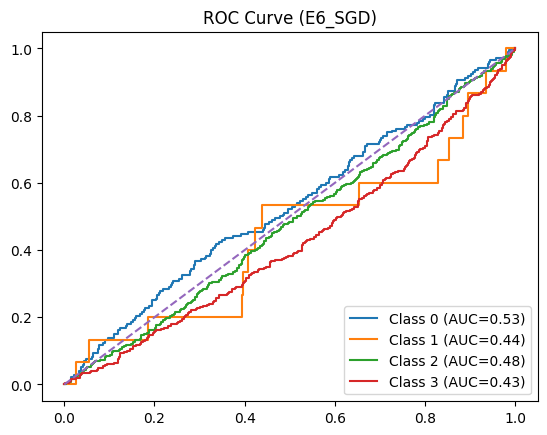

Eksperimen E6_SGD selesai.

Tahap 2: Evaluasi Optimizer selesai!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-5,            # LOCKED: Hasil optimal Full Tuning
    "batch_size": 16,
    "epochs": 25,
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE WEIGHTS (CLASS WEIGHT DIKUNCI)
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * num_classes

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (AUGMENTASI DIKUNCI ON)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, optimizer_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Optimizer: {optimizer_type.upper()} | LR: {CONFIG['lr']} | Strategy: Full Tuning")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOCKED: Full Tuning (Semua Layer Dibuka)
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # ------------------ LOSS FUNCTION (CLASS WEIGHT DIKUNCI) ------------------
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    # ------------------ OPTIMIZER LOGIC ------------------
    trainable_params = filter(lambda p: p.requires_grad, model.parameters())

    if optimizer_type == "adam":
        optimizer = optim.Adam(trainable_params, lr=CONFIG["lr"])
    elif optimizer_type == "adamw":
        optimizer = optim.AdamW(trainable_params, lr=CONFIG["lr"], weight_decay=1e-4)
    elif optimizer_type == "sgd":
        # Momentum 0.9 ditambahkan agar performa SGD kompetitif
        optimizer = optim.SGD(trainable_params, lr=CONFIG["lr"], momentum=0.9, weight_decay=1e-4)
    else:
        raise ValueError("Optimizer tidak didukung!")

    # ------------------ SCHEDULER (LOCKED) ------------------
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=3
    )

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Scheduler Step
        scheduler.step(val_loss)

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load bobot terbaik sebelum test
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.title(f"ROC Curve ({scenario_name})")
    plt.legend(loc="lower right")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI 3 SKENARIO SECARA BERUNTUN
# ==========================================

# E-4: Full Tuning + Adam
run_experiment(scenario_name="E4_Adam", optimizer_type="adam")

# E-5: Full Tuning + AdamW
run_experiment(scenario_name="E5_AdamW", optimizer_type="adamw")

# E-6: Full Tuning + SGD (dengan Momentum)
run_experiment(scenario_name="E6_SGD", optimizer_type="sgd")

print("Tahap 2: Evaluasi Optimizer selesai!")

Device: cuda
Loading dataset...
Train: 4096 | Val: 1024 | Test: 1280

MULAI EKSPERIMEN: R7_REDUCELRONPLATEAU
Optimizer: ADAM | Strategy: Full Tuning | Scheduler: REDUCE_LR
Epoch 01/25 | LR: 1.00e-05 | Train Acc: 0.4172 | Val Acc: 0.4795 | Val Loss: 1.2771
Epoch 02/25 | LR: 1.00e-05 | Train Acc: 0.4995 | Val Acc: 0.5205 | Val Loss: 1.2217
Epoch 03/25 | LR: 1.00e-05 | Train Acc: 0.5146 | Val Acc: 0.4951 | Val Loss: 1.1699
Epoch 04/25 | LR: 1.00e-05 | Train Acc: 0.5356 | Val Acc: 0.5352 | Val Loss: 1.1298
Epoch 05/25 | LR: 1.00e-05 | Train Acc: 0.5586 | Val Acc: 0.5430 | Val Loss: 1.0987
Epoch 06/25 | LR: 1.00e-05 | Train Acc: 0.5620 | Val Acc: 0.5322 | Val Loss: 1.0547
Epoch 07/25 | LR: 1.00e-05 | Train Acc: 0.5635 | Val Acc: 0.6201 | Val Loss: 1.0079
Epoch 08/25 | LR: 1.00e-05 | Train Acc: 0.5999 | Val Acc: 0.5742 | Val Loss: 0.9684
Epoch 09/25 | LR: 1.00e-05 | Train Acc: 0.6172 | Val Acc: 0.6006 | Val Loss: 0.9195
Epoch 10/25 | LR: 1.00e-05 | Train Acc: 0.6365 | Val Acc: 0.6270 | Val L

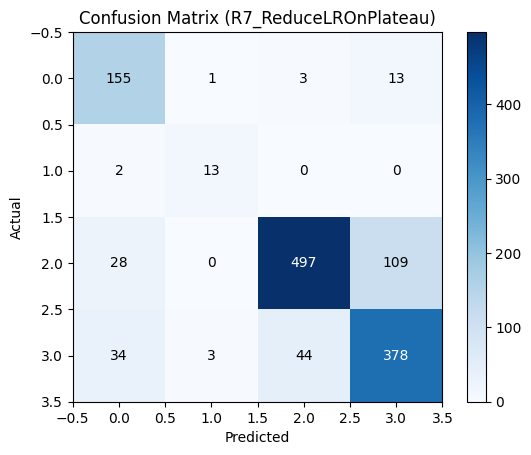

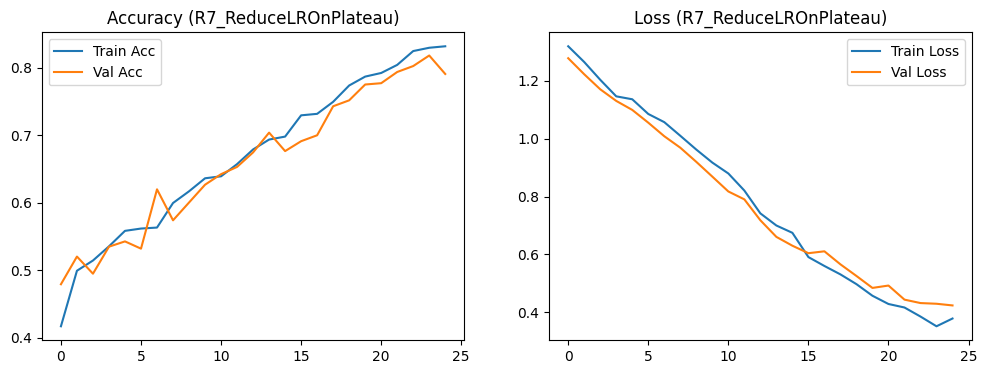

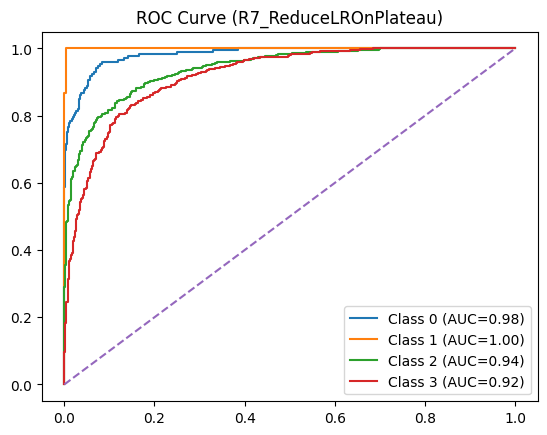

Eksperimen R7_ReduceLROnPlateau selesai.


MULAI EKSPERIMEN: R8_COSINEANNEALING
Optimizer: ADAM | Strategy: Full Tuning | Scheduler: COSINE
Epoch 01/25 | LR: 9.96e-06 | Train Acc: 0.3669 | Val Acc: 0.4375 | Val Loss: 1.2841
Epoch 02/25 | LR: 9.84e-06 | Train Acc: 0.4729 | Val Acc: 0.5186 | Val Loss: 1.2295
Epoch 03/25 | LR: 9.65e-06 | Train Acc: 0.5386 | Val Acc: 0.5293 | Val Loss: 1.1789
Epoch 04/25 | LR: 9.38e-06 | Train Acc: 0.5427 | Val Acc: 0.5420 | Val Loss: 1.1339
Epoch 05/25 | LR: 9.05e-06 | Train Acc: 0.5479 | Val Acc: 0.5293 | Val Loss: 1.1015
Epoch 06/25 | LR: 8.64e-06 | Train Acc: 0.5652 | Val Acc: 0.5957 | Val Loss: 1.0702
Epoch 07/25 | LR: 8.19e-06 | Train Acc: 0.5740 | Val Acc: 0.6045 | Val Loss: 1.0451
Epoch 08/25 | LR: 7.68e-06 | Train Acc: 0.5908 | Val Acc: 0.5928 | Val Loss: 0.9953
Epoch 09/25 | LR: 7.13e-06 | Train Acc: 0.6045 | Val Acc: 0.6123 | Val Loss: 0.9518
Epoch 10/25 | LR: 6.55e-06 | Train Acc: 0.6257 | Val Acc: 0.6240 | Val Loss: 0.9099
Epoch 11/25 | LR: 5.

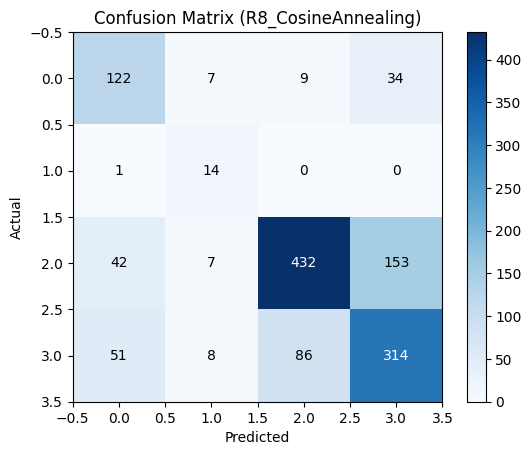

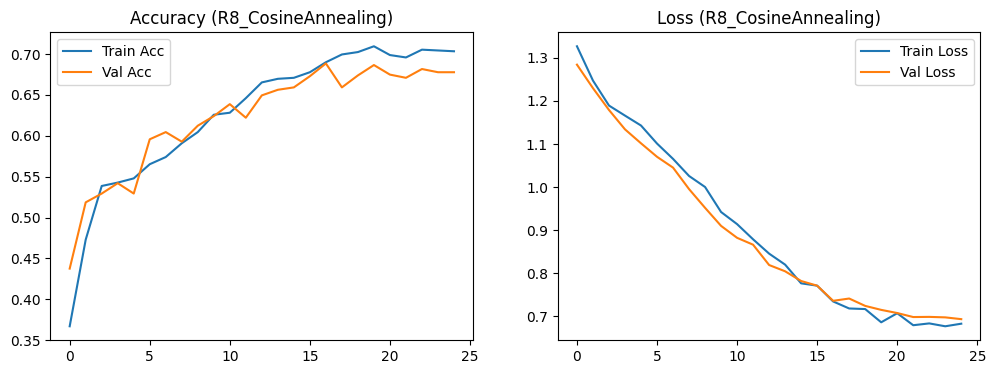

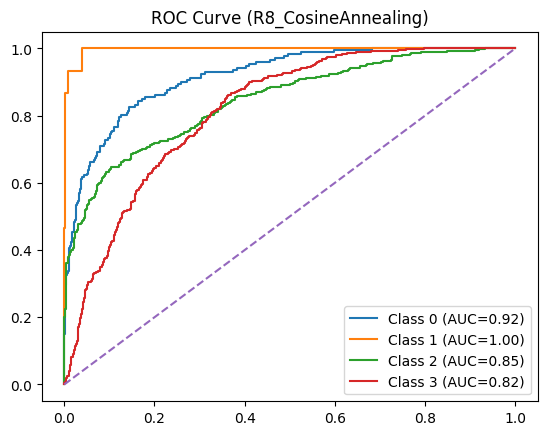

Eksperimen R8_CosineAnnealing selesai.

Tahap 3: Evaluasi Scheduler selesai!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights

from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

import numpy as np
import matplotlib.pyplot as plt
import copy
import random

# ==========================================
# 1. CONFIG & REPRODUCIBILITY
# ==========================================
CONFIG = {
    "lr": 1e-5,            # LOCKED: Hasil optimal Full Tuning
    "batch_size": 16,
    "epochs": 25,
    "patience": 7,
    "num_workers": 2,
    "seed": 42
}

torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
random.seed(CONFIG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ==========================================
# 2. LOAD DATA + STRATIFIED SPLIT
# ==========================================
print("Loading dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")

hf_train_data = dataset["train"]
test_data = dataset["test"]

train_labels_full = np.array(hf_train_data["label"])

train_idx, val_idx = train_test_split(
    np.arange(len(train_labels_full)),
    test_size=0.2,
    stratify=train_labels_full,
    random_state=CONFIG["seed"]
)

train_data_raw = hf_train_data.select(train_idx)
val_data_raw   = hf_train_data.select(val_idx)

print(f"Train: {len(train_data_raw)} | Val: {len(val_data_raw)} | Test: {len(test_data)}")

train_labels = np.array(train_data_raw["label"])
num_classes = len(np.unique(train_labels))

# ==========================================
# 3. KALKULASI IMBALANCE WEIGHTS (CLASS WEIGHT DIKUNCI)
# ==========================================
class_counts = np.bincount(train_labels)
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * num_classes

# ==========================================
# 4. DATASET CLASS
# ==========================================
class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        label = item["label"]

        if self.transform:
            image = self.transform(image)

        return image, label, idx

# ==========================================
# 5. TRANSFORMS (AUGMENTASI DIKUNCI ON)
# ==========================================
base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_transform_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = AlzheimerDataset(train_data_raw, train_transform_aug)
val_ds   = AlzheimerDataset(val_data_raw, base_transform)
test_ds  = AlzheimerDataset(test_data, base_transform)

train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, num_workers=CONFIG["num_workers"])
val_loader = DataLoader(val_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, num_workers=CONFIG["num_workers"])

# ==========================================
# 6. EXPERIMENT RUNNER FUNCTION
# ==========================================
def run_experiment(scenario_name, scheduler_type):
    print(f"\n{'='*60}")
    print(f"MULAI EKSPERIMEN: {scenario_name.upper()}")
    print(f"Optimizer: ADAM | Strategy: Full Tuning | Scheduler: {scheduler_type.upper()}")
    print(f"{'='*60}")

    # ------------------ MODEL RESNET50 ------------------
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)

    # LOCKED: Full Tuning
    for param in model.parameters():
        param.requires_grad = True

    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    model = model.to(device)

    # ------------------ LOSS FUNCTION (LOCKED) ------------------
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    # ------------------ OPTIMIZER (LOCKED: ADAM) ------------------
    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=CONFIG["lr"]
    )

    # ------------------ SCHEDULER LOGIC ------------------
    if scheduler_type == "reduce_lr":
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.5, patience=3
        )
    elif scheduler_type == "cosine":
        # T_max diset sama dengan jumlah epoch maksimal
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=CONFIG["epochs"]
        )
    else:
        raise ValueError("Scheduler tidak didukung!")

    # ------------------ TRAINING LOOP ------------------
    train_acc_hist, val_acc_hist = [], []
    train_loss_hist, val_loss_hist = [], []

    best_model = copy.deepcopy(model.state_dict())
    best_loss = float("inf")
    counter = 0

    for epoch in range(CONFIG["epochs"]):
        model.train()
        train_loss, correct, total = 0, 0, 0

        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss /= total
        train_acc = correct / total

        # VALIDASI
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                preds = outputs.argmax(1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # Eksekusi Scheduler Step berdasarkan tipe
        if scheduler_type == "reduce_lr":
            scheduler.step(val_loss)
        elif scheduler_type == "cosine":
            scheduler.step()

        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)
        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)

        current_lr_in_optim = optimizer.param_groups[0]['lr']

        print(f"Epoch {epoch+1:02d}/{CONFIG['epochs']} | LR: {current_lr_in_optim:.2e} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | Val Loss: {val_loss:.4f}")

        # EARLY STOPPING
        if val_loss < best_loss:
            best_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            counter = 0
        else:
            counter += 1
            if counter >= CONFIG["patience"]:
                print(f"Early stopping at epoch {epoch+1}!")
                break

    # Load bobot terbaik sebelum test
    model.load_state_dict(best_model)

    # ------------------ TESTING ------------------
    print(f"\n--- FINAL TEST ({scenario_name}) ---")
    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)

    # ------------------ PLOTTING ------------------
    plt.figure()
    plt.imshow(cm, cmap='Blues')
    plt.title(f"Confusion Matrix ({scenario_name})")
    plt.colorbar()
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for i in range(len(cm)):
        for j in range(len(cm)):
            plt.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(train_acc_hist, label="Train Acc")
    ax1.plot(val_acc_hist, label="Val Acc")
    ax1.set_title(f"Accuracy ({scenario_name})")
    ax1.legend()

    ax2.plot(train_loss_hist, label="Train Loss")
    ax2.plot(val_loss_hist, label="Val Loss")
    ax2.set_title(f"Loss ({scenario_name})")
    ax2.legend()
    plt.show()

    y_true = label_binarize(all_labels, classes=list(range(num_classes)))
    y_score = np.array(all_probs)

    plt.figure()
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.title(f"ROC Curve ({scenario_name})")
    plt.legend(loc="lower right")
    plt.show()

    print(f"Eksperimen {scenario_name} selesai.\n")

# ==========================================
# 7. EKSEKUSI 2 SKENARIO SECARA BERUNTUN
# ==========================================

# R-7: ReduceLROnPlateau
run_experiment(scenario_name="R7_ReduceLROnPlateau", scheduler_type="reduce_lr")

# R-8: Cosine Annealing
run_experiment(scenario_name="R8_CosineAnnealing", scheduler_type="cosine")

print("Tahap 3: Evaluasi Scheduler selesai!")